# Set up

In [3]:
from google.colab import drive

drive.mount('/content/drive')
drive_path = 'drive/MyDrive'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 20)
import matplotlib.pyplot as plt
import seaborn as sb
import missingno as msno
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report

# Dataset

Dataset source: https://www.kaggle.com/datasets/muthuj7/weather-dataset

In [ ]:
#drive_path = '__datasets'
df = pd.read_csv(f'{drive_path}/weatherHistory.csv')
df

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.
...,...,...,...,...,...,...,...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,Partly Cloudy,rain,26.016667,26.016667,0.43,10.9963,31.0,16.1000,0.0,1014.36,Partly cloudy starting in the morning.
96449,2016-09-09 20:00:00.000 +0200,Partly Cloudy,rain,24.583333,24.583333,0.48,10.0947,20.0,15.5526,0.0,1015.16,Partly cloudy starting in the morning.
96450,2016-09-09 21:00:00.000 +0200,Partly Cloudy,rain,22.038889,22.038889,0.56,8.9838,30.0,16.1000,0.0,1015.66,Partly cloudy starting in the morning.
96451,2016-09-09 22:00:00.000 +0200,Partly Cloudy,rain,21.522222,21.522222,0.60,10.5294,20.0,16.1000,0.0,1015.95,Partly cloudy starting in the morning.


## Dataset lookup

In [ ]:
def dataset_lookup(df):
    print('Dataset info:')
    print(df.info())
    print()
    print('Dataset description:')
    print(df.describe())
    print()
    print('Amount of duplicates:')
    duplicates_amount = df.duplicated().sum()
    print(duplicates_amount)
    if (duplicates_amount > 0):
        print('Duplicates:')
        print(df[df.duplicated(keep = False)])
    print()
    print('Amount of missing values:')
    print(df.isna().sum(axis = 0))
    print()
    print('Unique values in each column:')
    object_types_count = 0
    for column in df:
        if df[column].dtypes == 'object':
            object_types_count += 1
            print('-' * len(column))
            print(f'{column}: {df[column].unique()}')
    if object_types_count == 0:
        print('-' * 10)
        print('No object columns in this dataset.')

dataset_lookup(df)

Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Formatted Date            96453 non-null  object 
 1   Summary                   96453 non-null  object 
 2   Precip Type               95936 non-null  object 
 3   Temperature (C)           96453 non-null  float64
 4   Apparent Temperature (C)  96453 non-null  float64
 5   Humidity                  96453 non-null  float64
 6   Wind Speed (km/h)         96453 non-null  float64
 7   Wind Bearing (degrees)    96453 non-null  float64
 8   Visibility (km)           96453 non-null  float64
 9   Loud Cover                96453 non-null  float64
 10  Pressure (millibars)      96453 non-null  float64
 11  Daily Summary             96453 non-null  object 
dtypes: float64(8), object(4)
memory usage: 8.8+ MB
None

Dataset description:
       Temperature (C)  Appa

Formatted Date                0
Summary                       0
Precip Type                 517
Temperature (C)               0
Apparent Temperature (C)      0
Humidity                      0
Wind Speed (km/h)             0
Wind Bearing (degrees)        0
Visibility (km)               0
Loud Cover                    0
Pressure (millibars)          0
Daily Summary                 0
dtype: int64

Unique values in each column:
--------------
Formatted Date: ['2006-04-01 00:00:00.000 +0200' '2006-04-01 01:00:00.000 +0200'
 '2006-04-01 02:00:00.000 +0200' ... '2016-09-09 21:00:00.000 +0200'
 '2016-09-09 22:00:00.000 +0200' '2016-09-09 23:00:00.000 +0200']
-------
Summary: ['Partly Cloudy' 'Mostly Cloudy' 'Overcast' 'Foggy'
 'Breezy and Mostly Cloudy' 'Clear' 'Breezy and Partly Cloudy'
 'Breezy and Overcast' 'Humid and Mostly Cloudy' 'Humid and Partly Cloudy'
 'Windy and Foggy' 'Windy and Overcast' 'Breezy and Foggy'
 'Windy and Partly Cloudy' 'Breezy' 'Dry and Partly Cloudy'
 'Windy and Mos

In [ ]:
df.describe()

,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars)
count,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.0,96453.000000
mean,11.932678,10.855029,0.734899,10.810640,187.509232,10.347325,0.0,1003.235956
std,9.551546,10.696847,0.195473,6.913571,107.383428,4.192123,0.0,116.969906
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,4.688889,2.311111,0.600000,5.828200,116.000000,8.339800,0.0,1011.900000
50%,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,0.0,1016.450000
75%,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,0.0,1021.090000
max,39.905556,39.344444,1.000000,63.852600,359.000000,16.100000,0.0,1046.380000


# Visual analysis

## Missing values

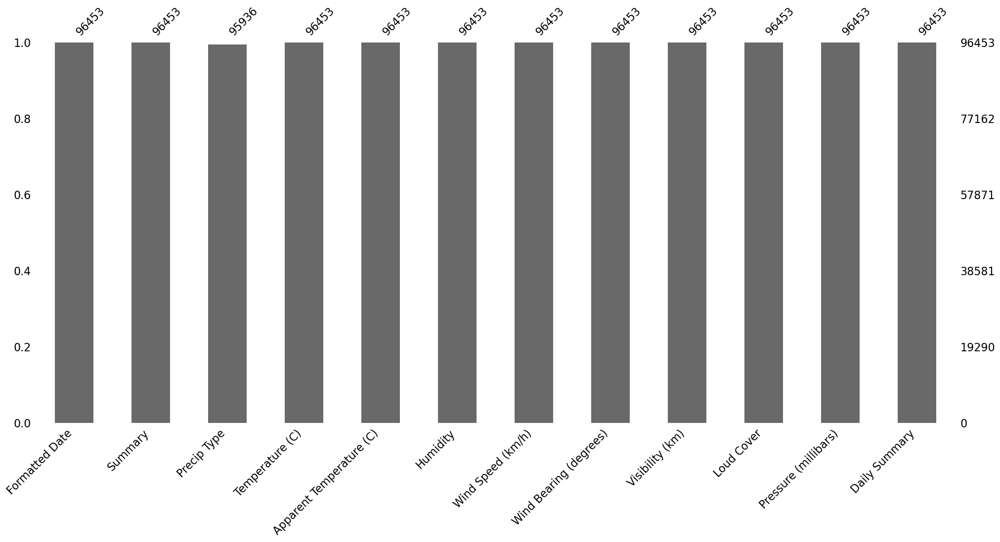

In [ ]:
msno.bar(df)
plt.show()

## Target feature plot

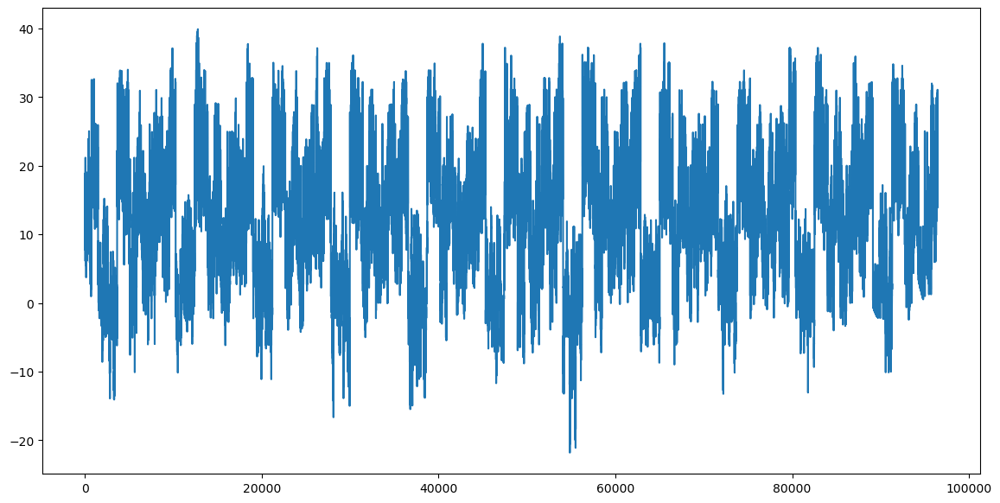

In [ ]:
plt.figure(figsize = (14, 7))
df['Temperature (C)'].plot()
plt.show()

## A closer look at the target feature

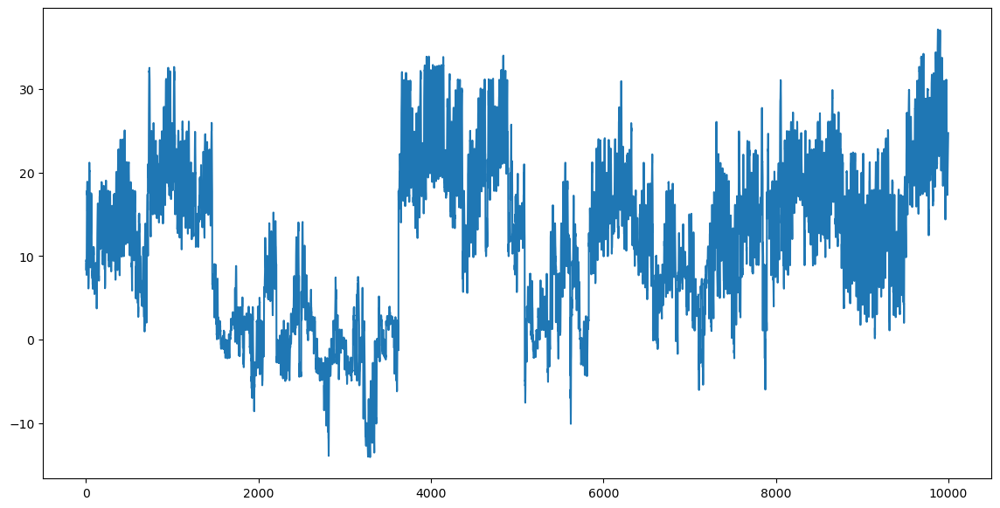

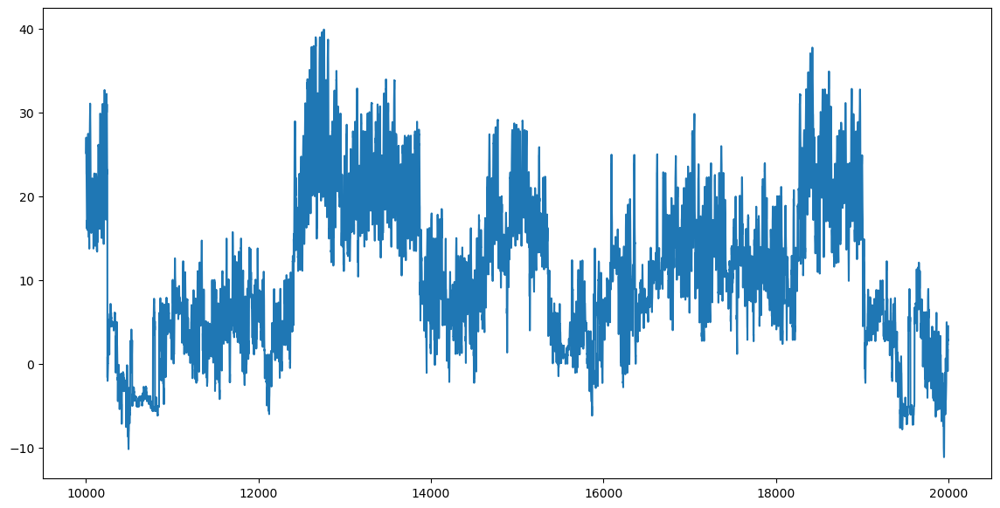

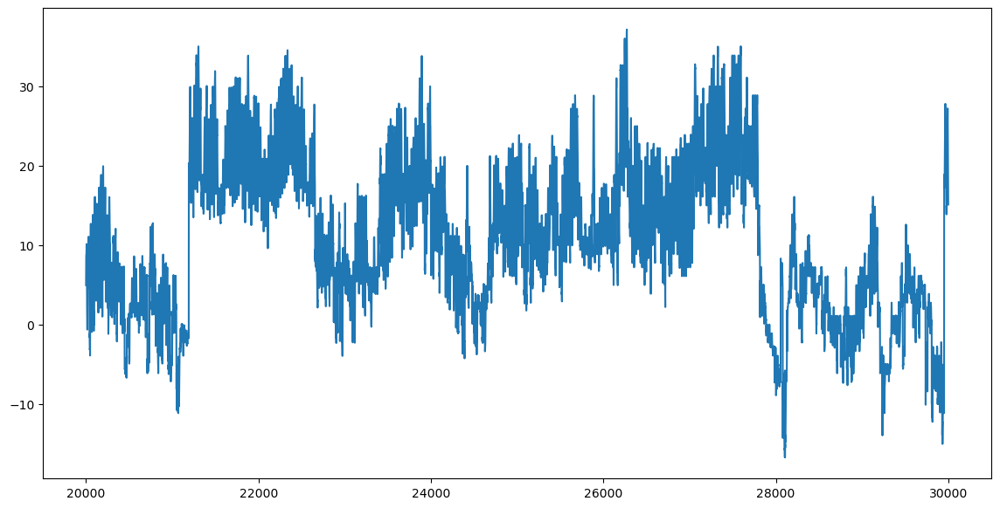

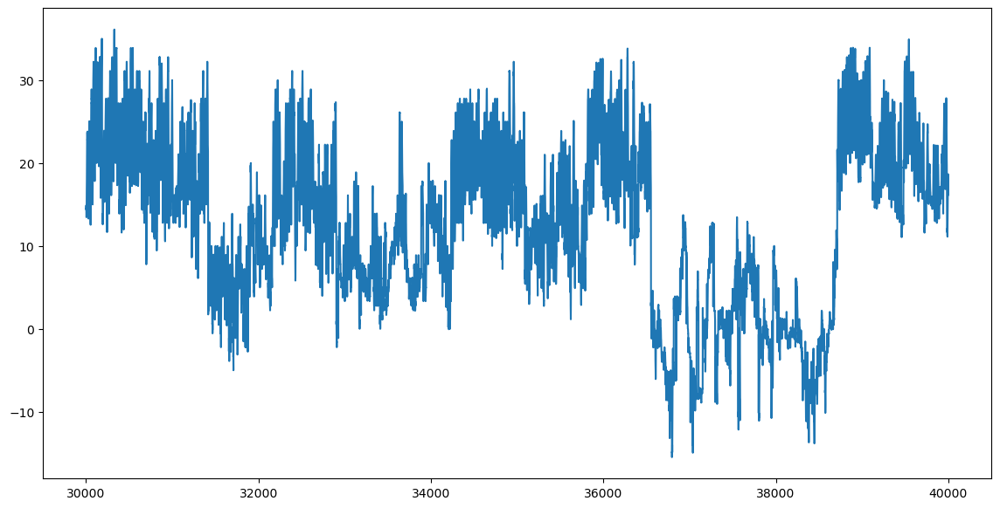

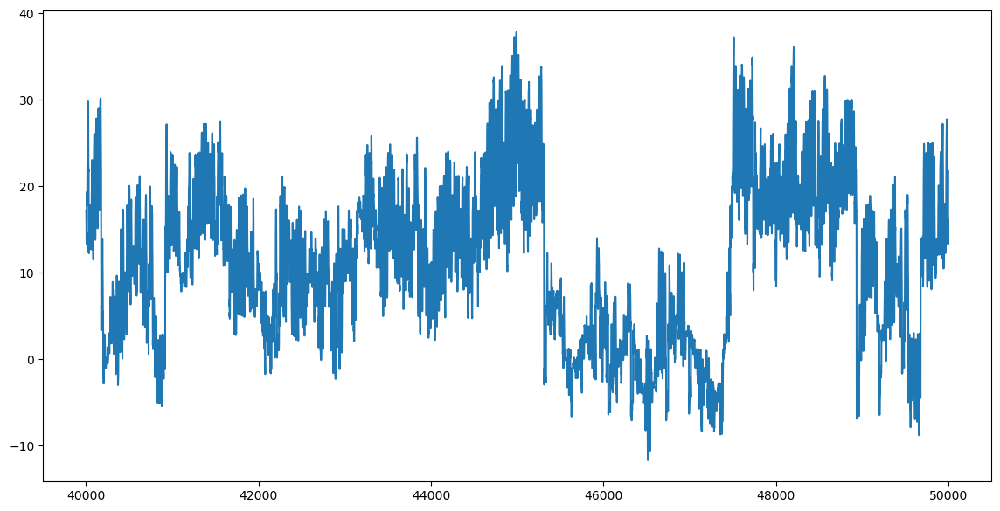

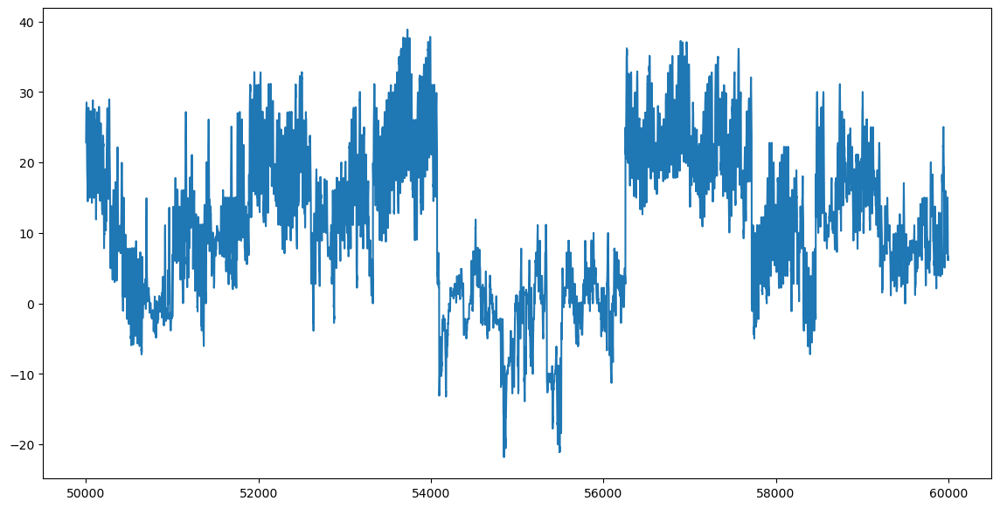

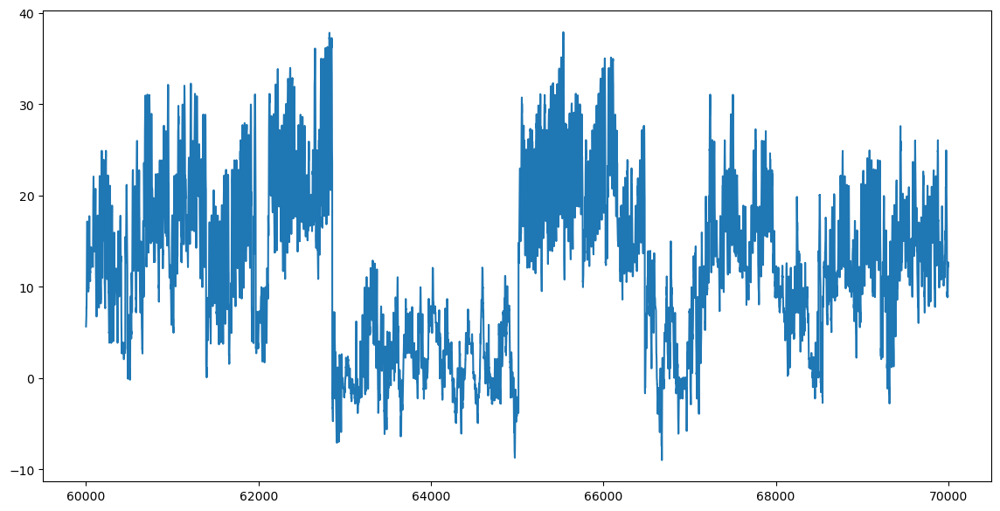

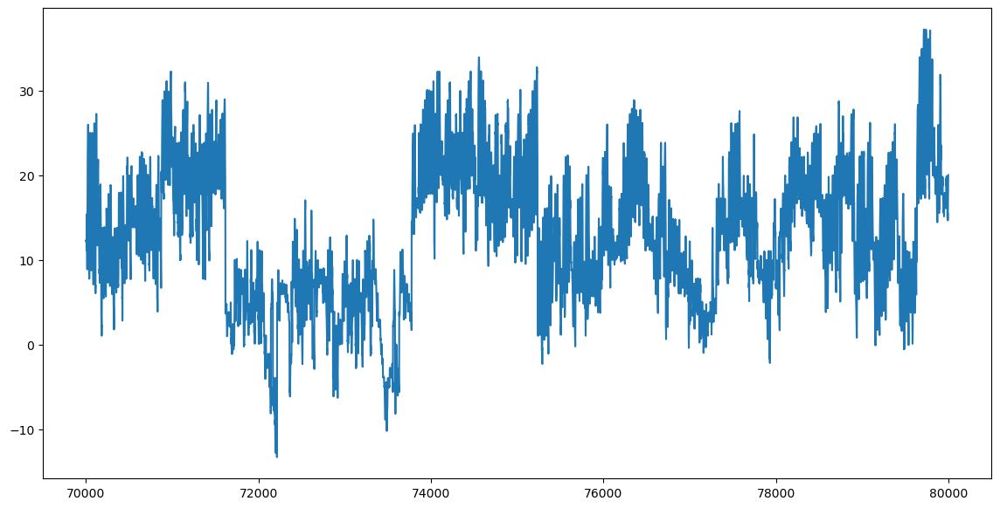

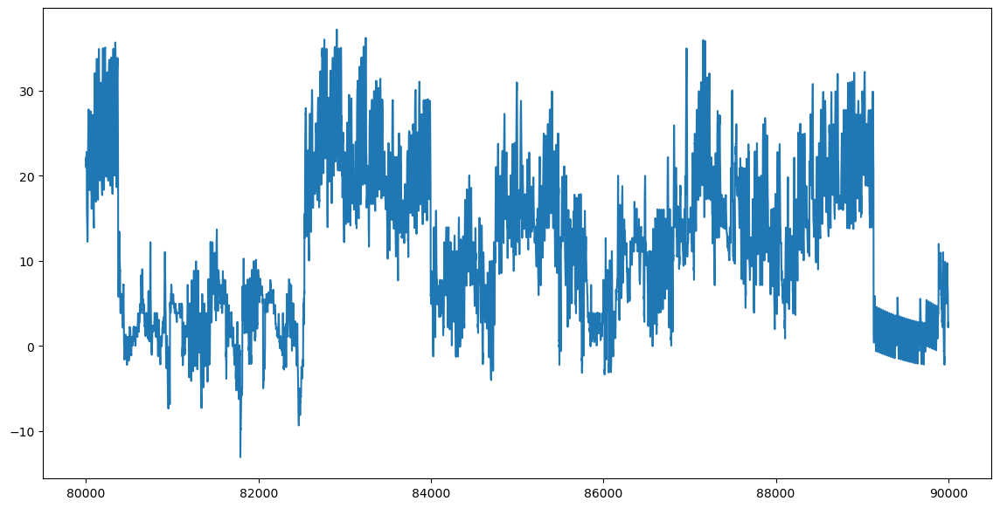

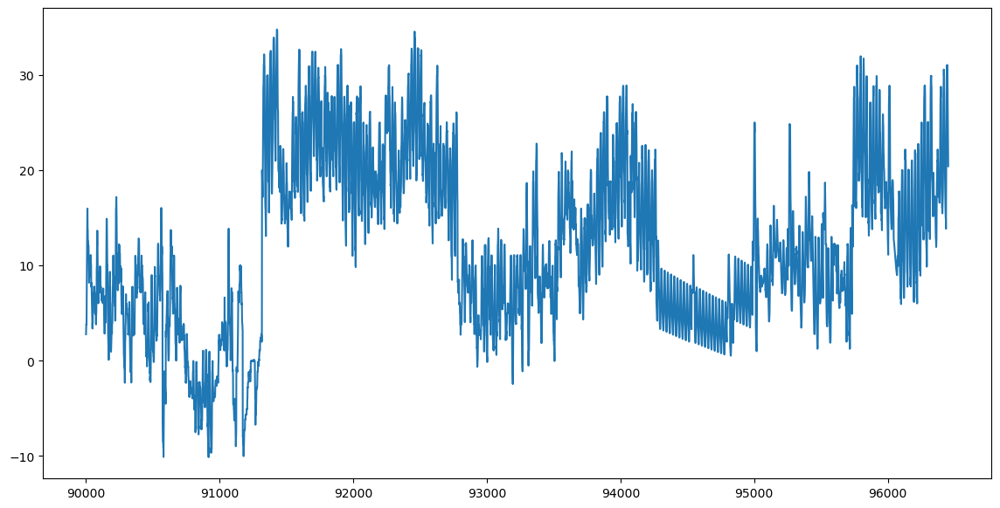

In [ ]:
step = 10000
for i in range(0, len(df), step):
    plt.figure(figsize = (14, 7))
    df.iloc[i:i + step]['Temperature (C)'].plot()
    plt.show()

## Non-target features plots

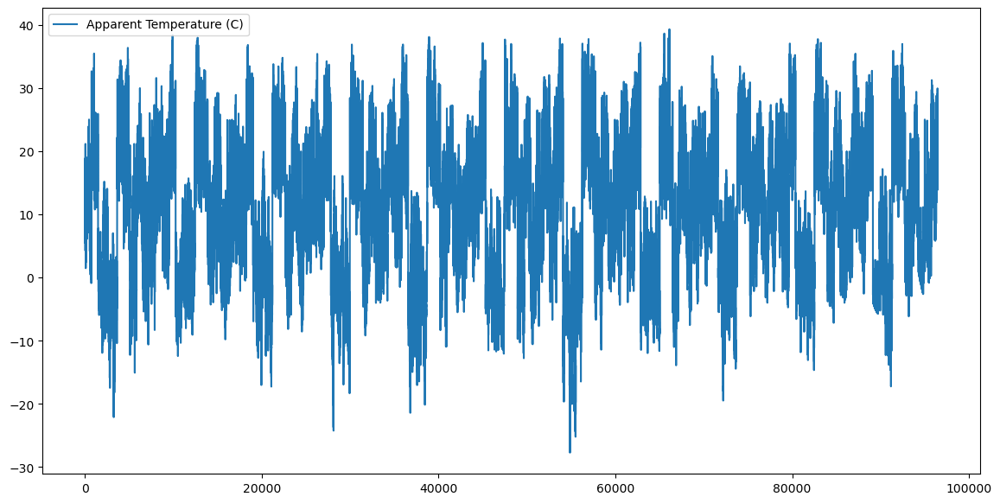

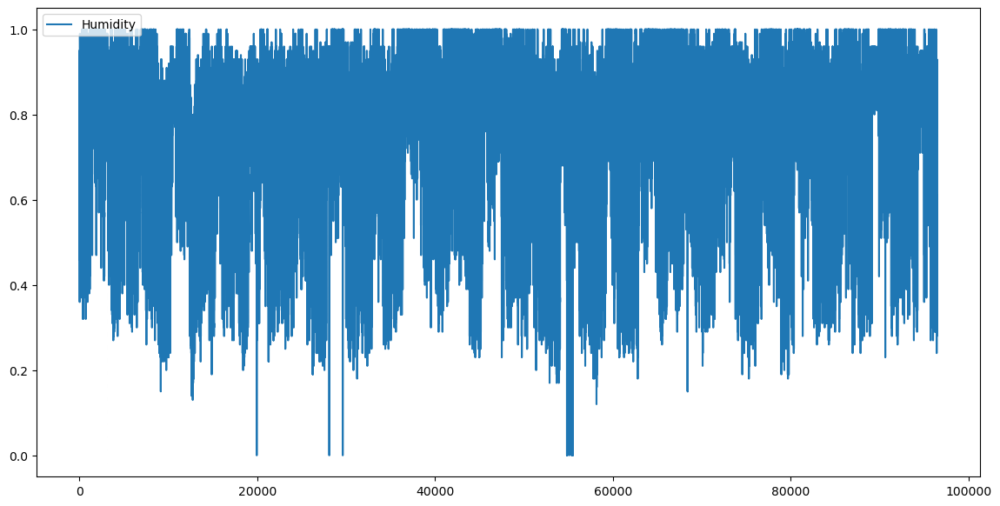

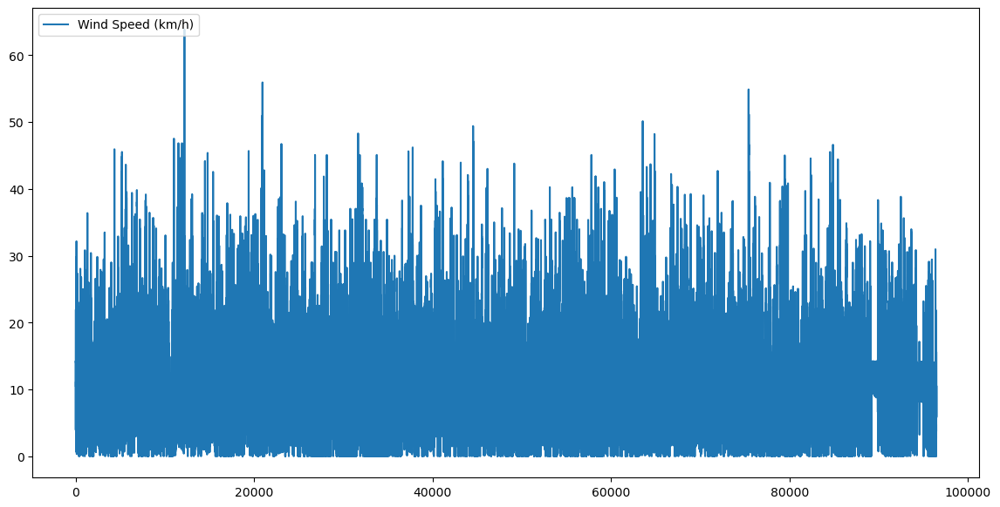

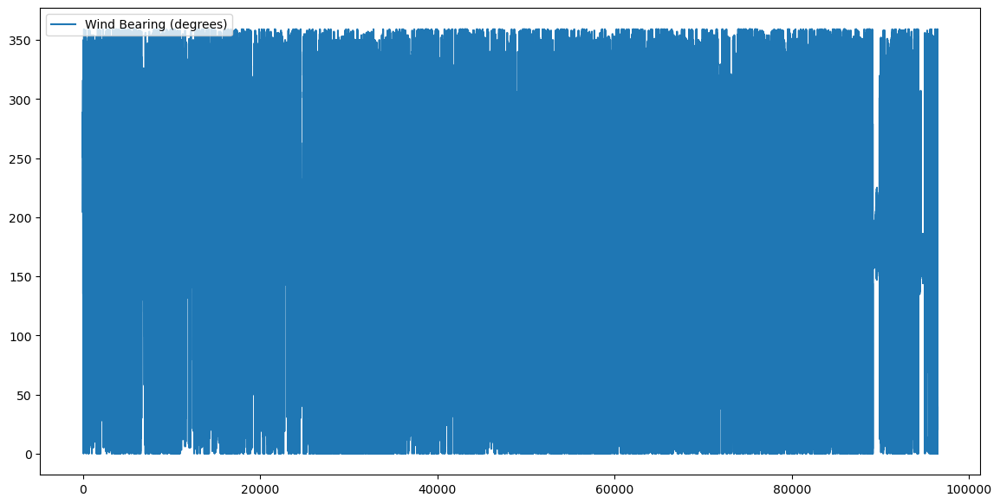

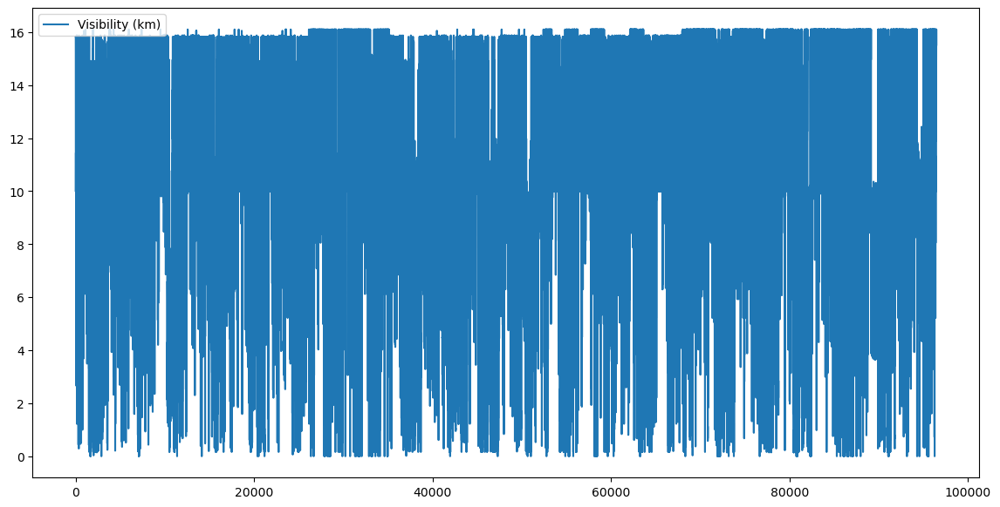

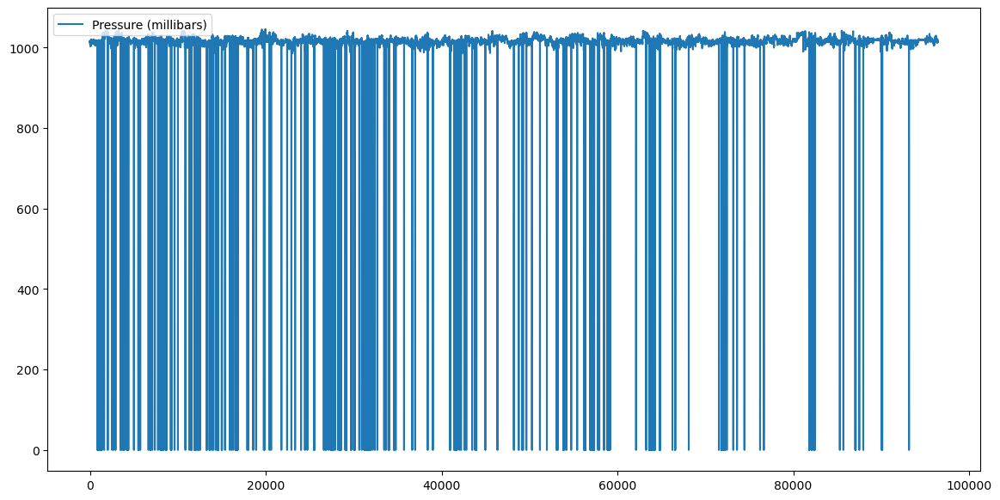

In [ ]:
for column in df.drop(columns = ['Loud Cover', 'Temperature (C)']):
    if df[column].dtypes == 'object':
        continue
    plt.figure(figsize = (14, 7))
    df[column].plot()
    plt.legend(loc = 'upper left')
    plt.show()

## Histograms

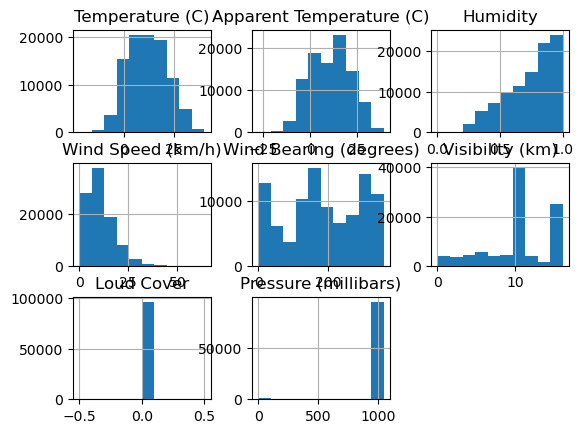

In [ ]:
def plot_dataset_histograms(df):
    df.hist()
    plt.show()

plot_dataset_histograms(df)

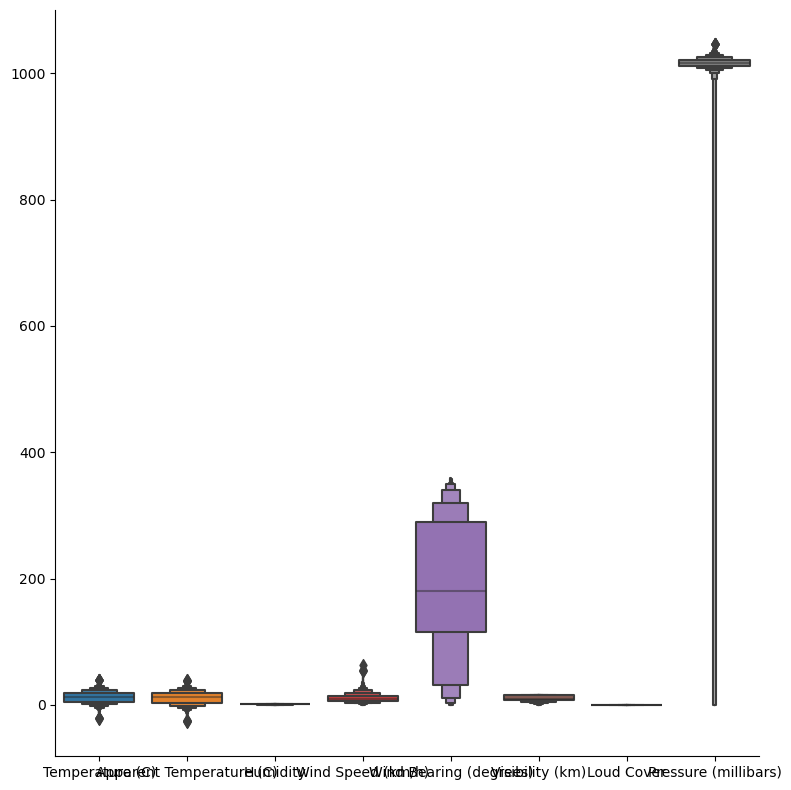

In [ ]:
def show_cat_plot(df):
    sb.catplot(df, kind = 'boxen', height = 8)
    plt.show()

show_cat_plot(df)

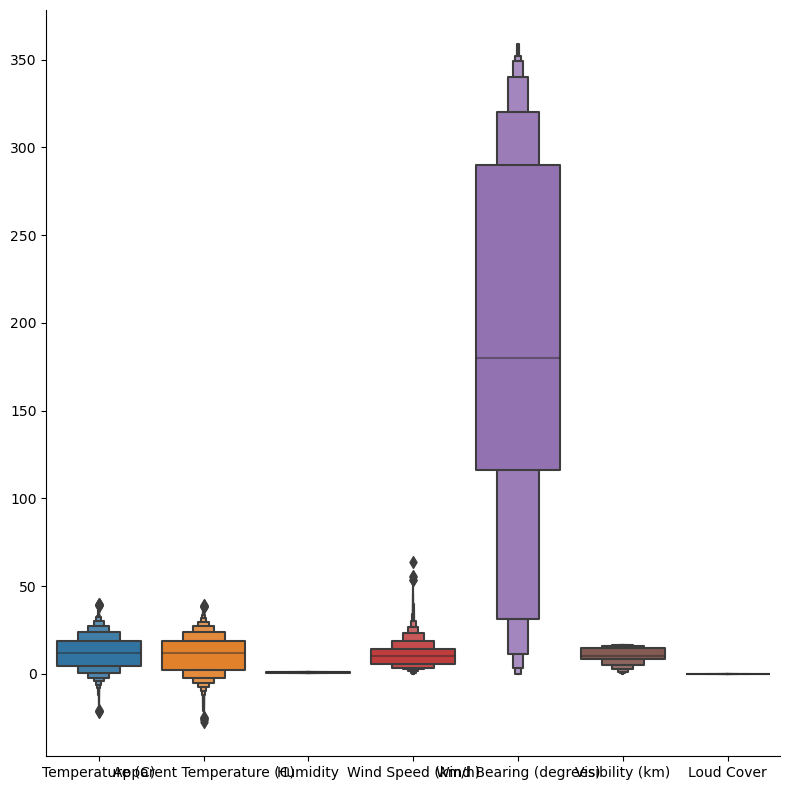

In [ ]:
show_cat_plot(df.drop(columns = 'Pressure (millibars)'))

## Pair plot

<Figure size 1500x1500 with 0 Axes>

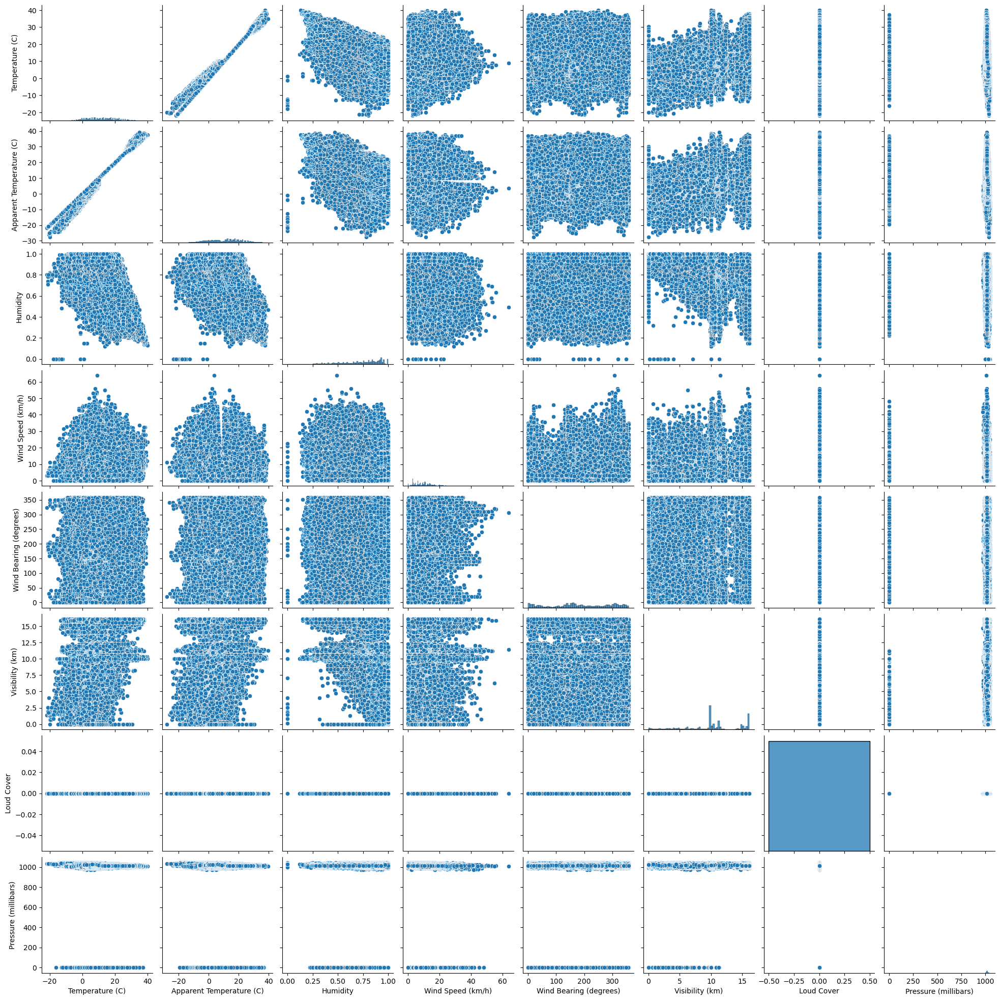

In [ ]:
def show_pair_plot(df, figure_size = (15, 15), target_name = None):
    plt.figure(figsize = figure_size)
    df_without_object_columns = df.select_dtypes(exclude = ['object'])
    if target_name != None:
        sb.pairplot(df_without_object_columns, palette = 'tab10', hue = target_name)
    else:
        sb.pairplot(df_without_object_columns)
    plt.show()

show_pair_plot(df)

## Correlation map

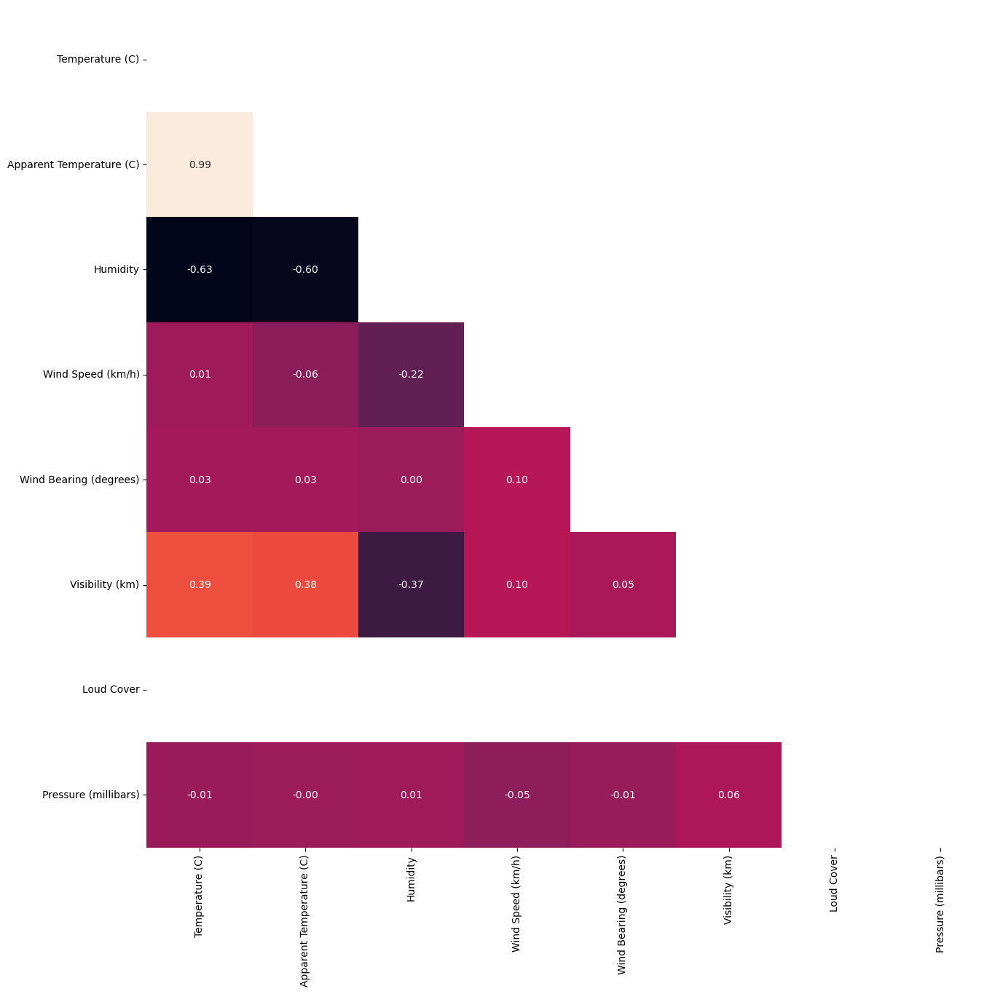

In [ ]:
def show_correlation_map(df, figure_size = (15, 15)):
    plt.figure(figsize = figure_size)
    corr_matrix = df.select_dtypes(exclude = ['object']).corr()
    lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k = -1).astype(np.bool_))
    sb.heatmap(
        lower,
        annot = True,
        fmt = '.2f',
        cbar = False)
    plt.show()

show_correlation_map(df)

## Summaries showcase

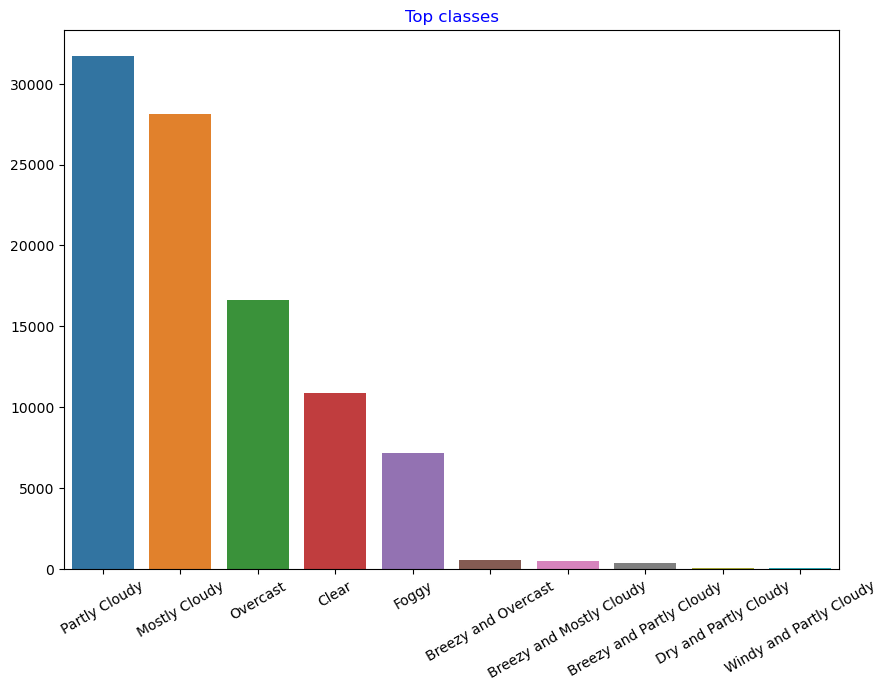

In [ ]:
def show_top_classes(df, column, num_of_top_classes = None):
    top = df[column].value_counts()
    if num_of_top_classes != None:
        top = top[:num_of_top_classes]
    plt.figure(figsize = (10, 7))
    sb.barplot(x = top.index, y = top.values)
    plt.xticks(rotation = 30)
    plt.title('Top classes', color = 'blue')
    plt.show()

show_top_classes(df, 'Summary', 10)

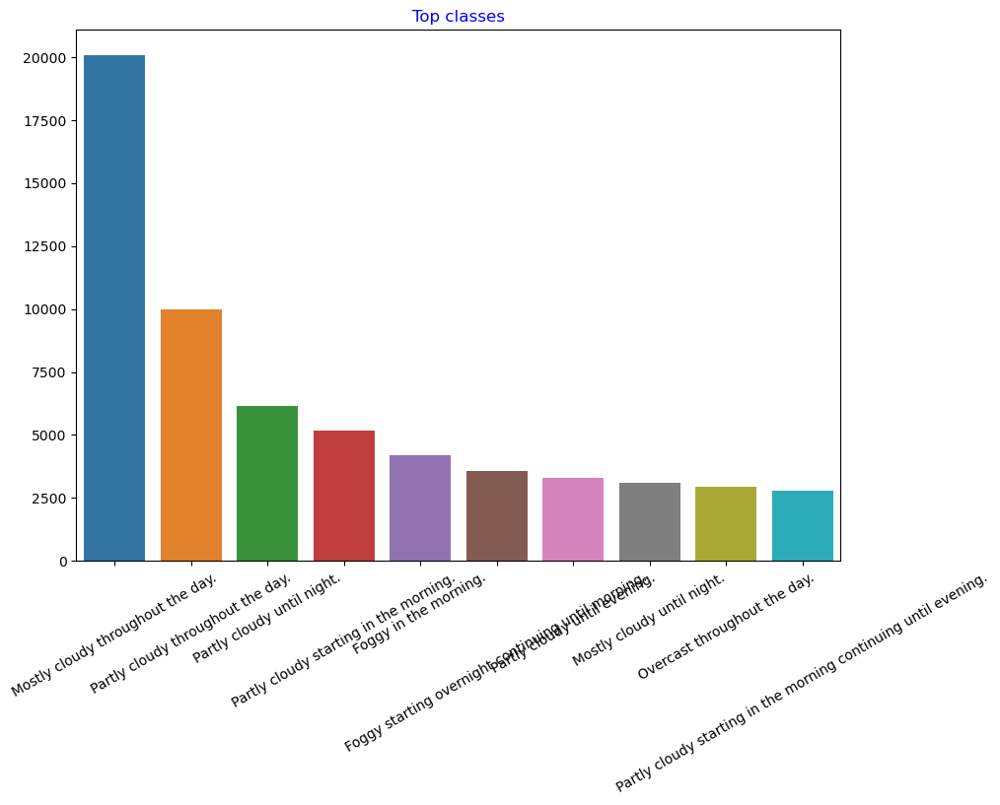

In [ ]:
show_top_classes(df, 'Daily Summary', 10)

## Exploring autocorrelation & partial autocorrelation

### Autocorrelation

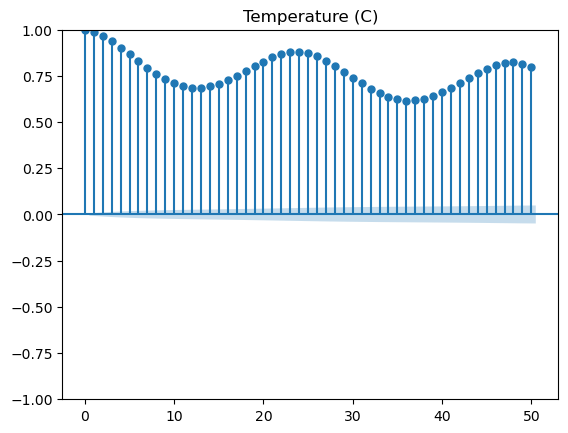

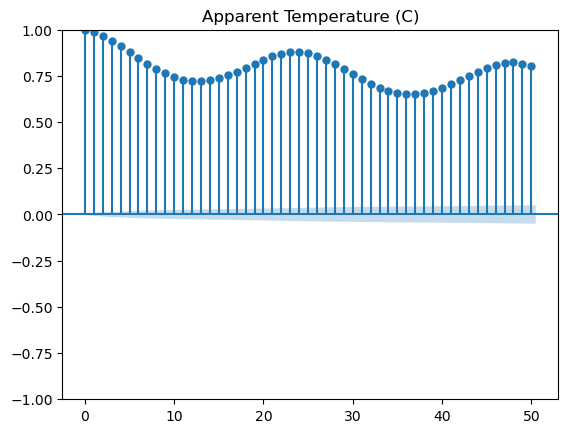

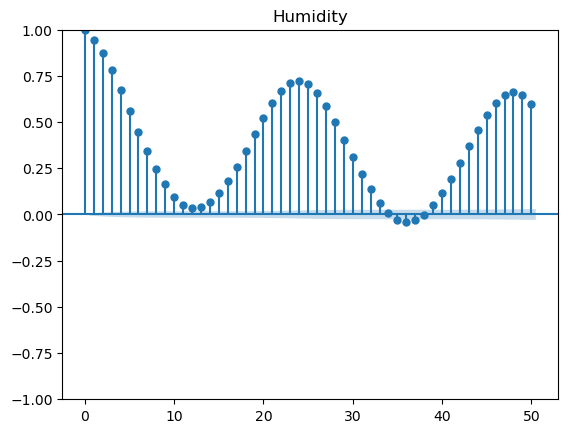

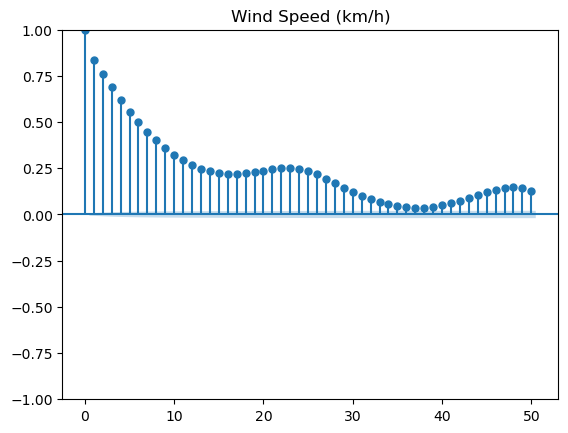

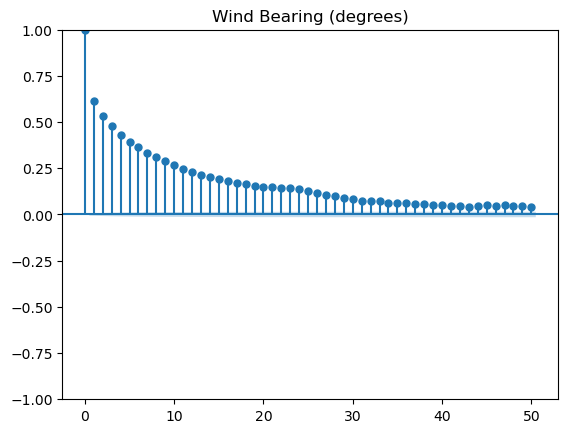

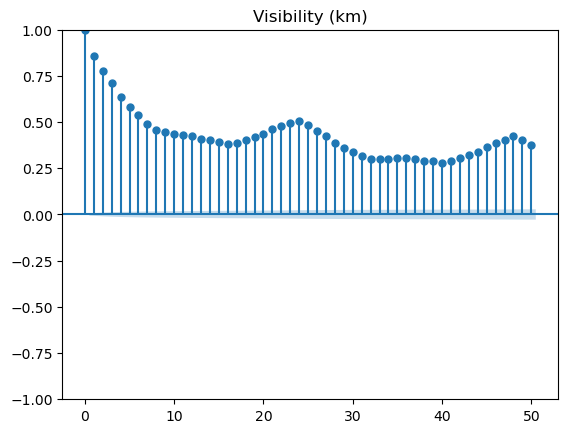

C:\Users\dexp\miniconda3\envs\env-tf\lib\site-packages\statsmodels\tsa\stattools.py:681: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\dexp\miniconda3\envs\env-tf\lib\site-packages\matplotlib\axes\_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


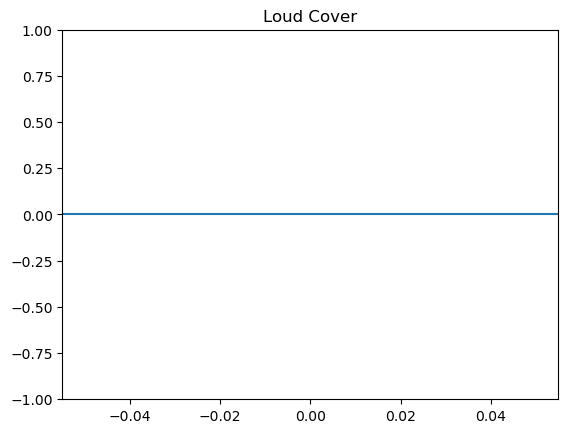

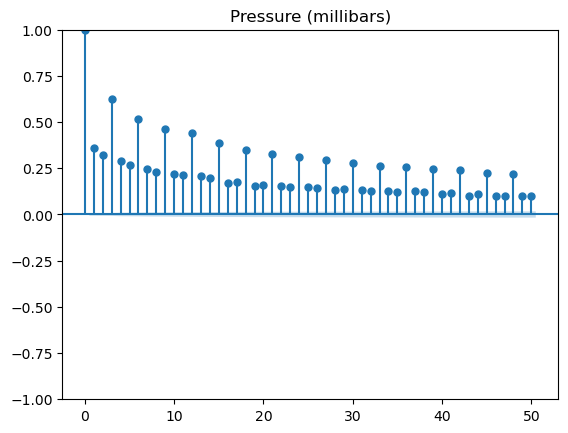

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

for column in df:
    if df[column].dtypes == 'object':
        continue
    plot_acf(df[column].to_numpy(), title = column)
    plt.show()

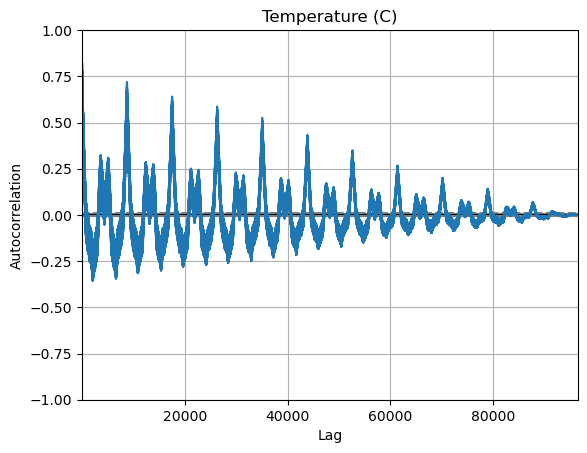

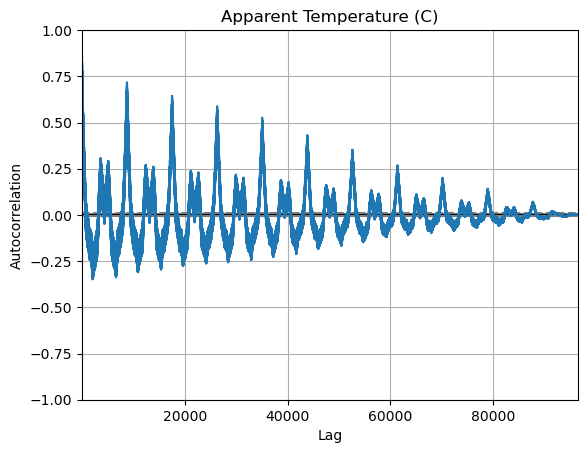

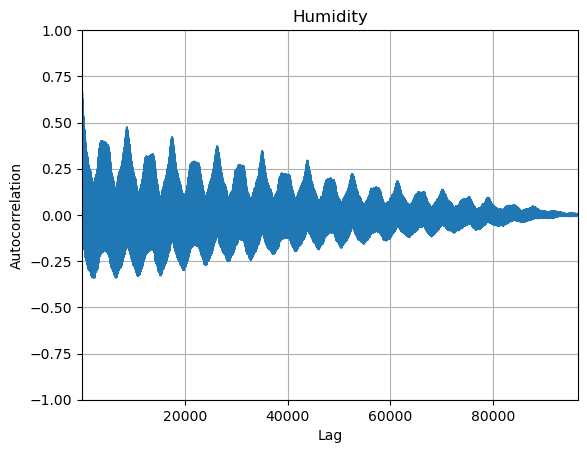

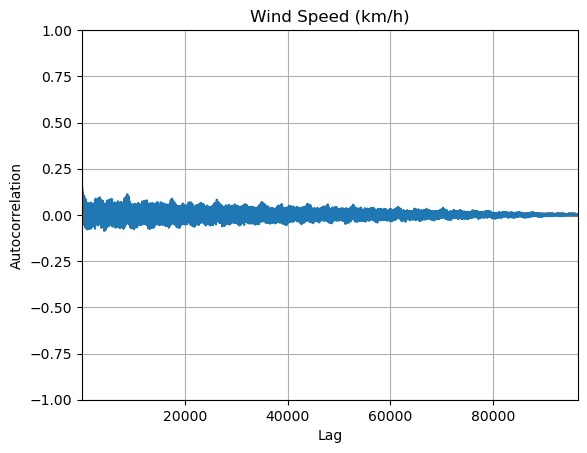

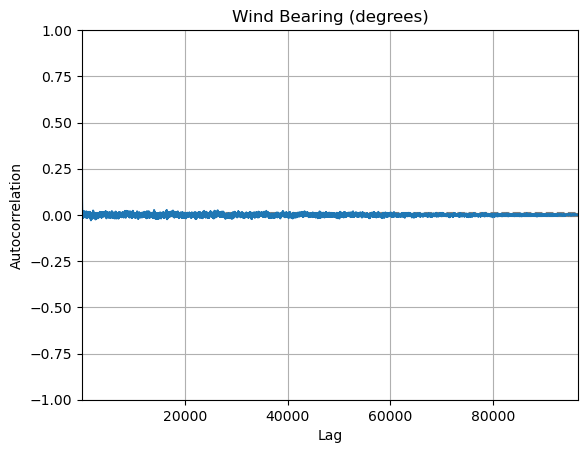

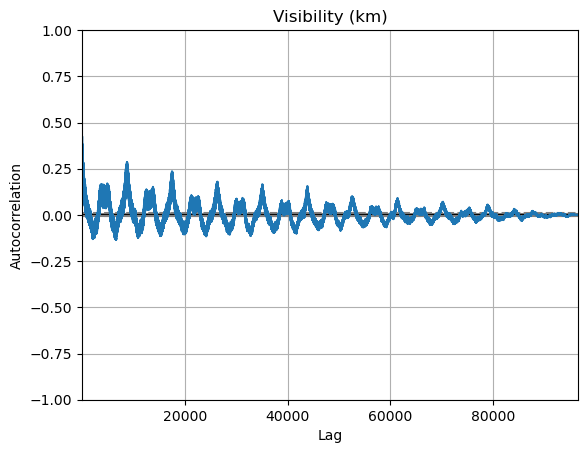

C:\Users\dexp\miniconda3\envs\env-tf\lib\site-packages\pandas\plotting\_matplotlib\misc.py:460: RuntimeWarning: invalid value encountered in double_scalars
  return ((data[: n - h] - mean) * (data[h:] - mean)).sum() / n / c0


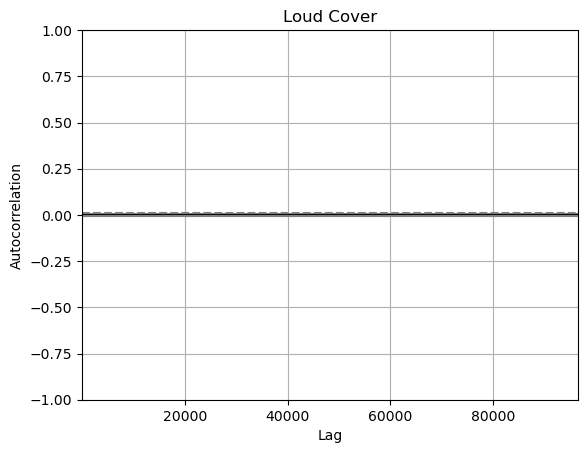

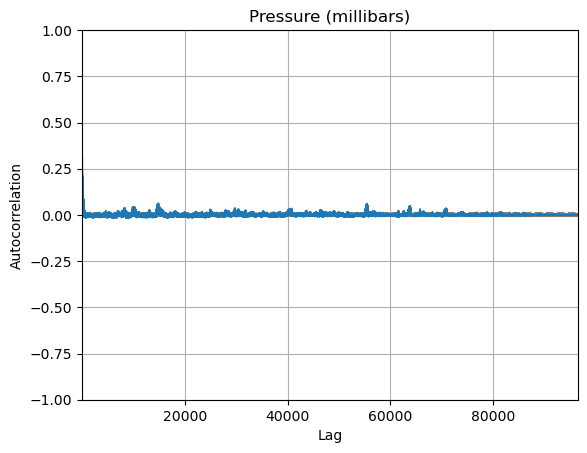

In [ ]:
from pandas.plotting import autocorrelation_plot

for column in df:
    if df[column].dtypes == 'object':
        continue
    plt.title(column)
    autocorrelation_plot(df[column])
    plt.show()

### Partial autocorrelation

C:\Users\dexp\miniconda3\envs\env-tf\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


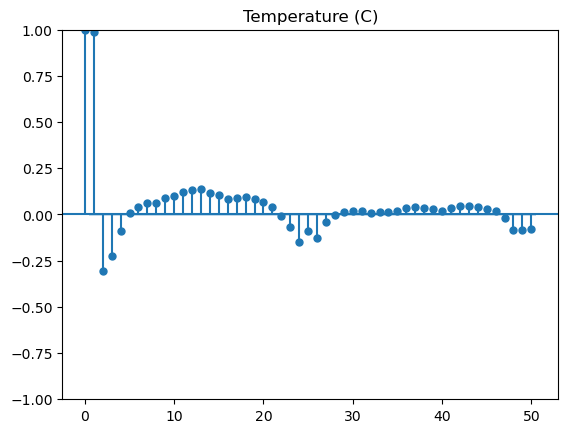

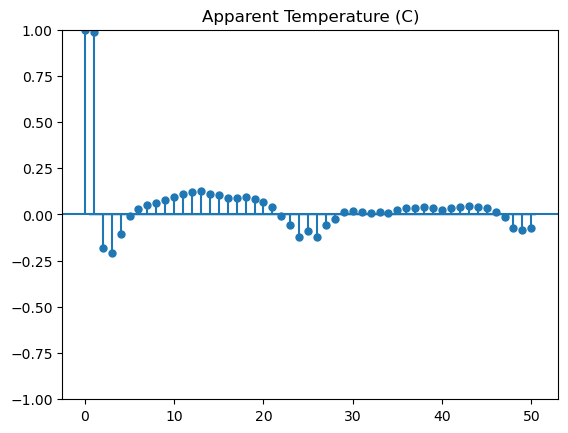

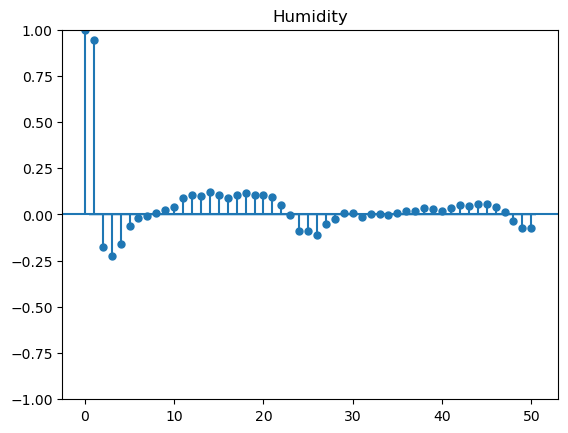

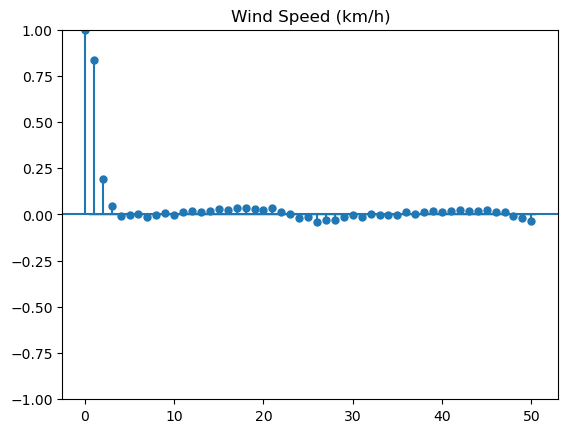

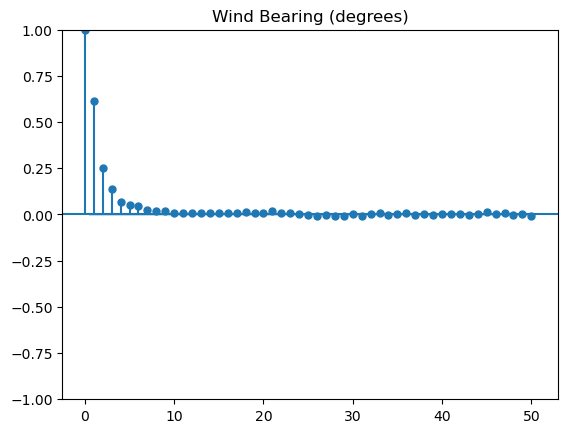

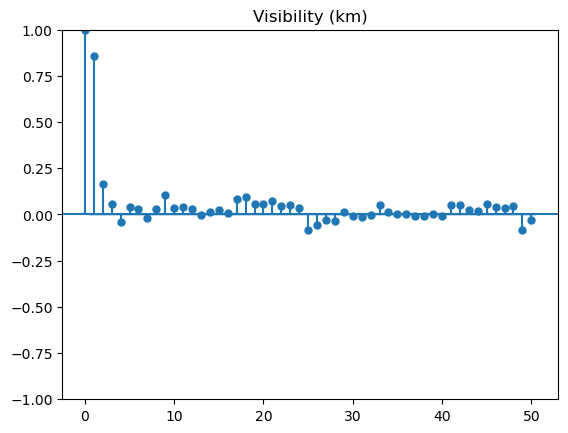

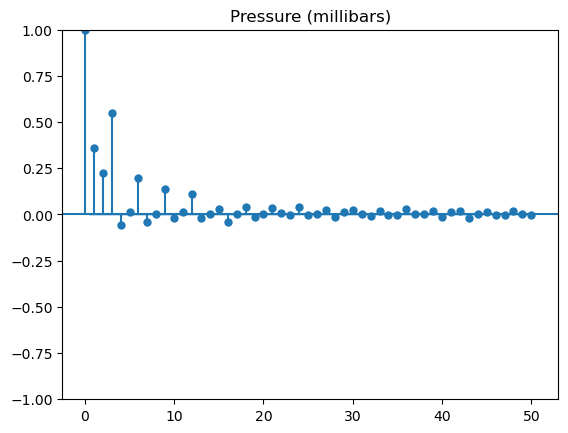

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf

for column in df.drop(columns = 'Loud Cover'):
    if df[column].dtypes == 'object':
        continue
    plot_pacf(df[column].to_numpy(), title = column)
    plt.show()

### Seasonal decomposition for the target feature

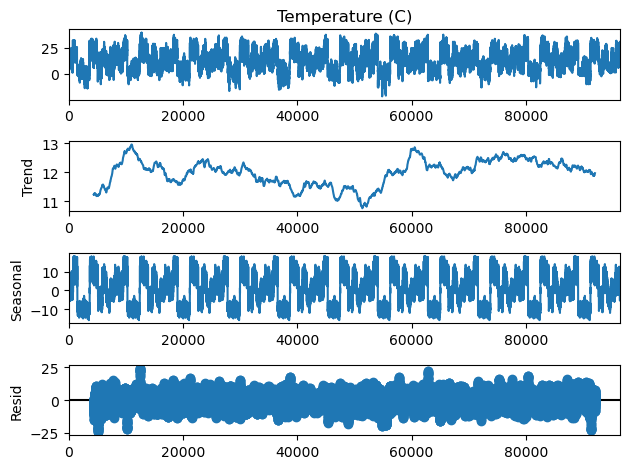

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

seasonal_decompose(df['Temperature (C)'], period = 365 * 24, model ='additive').plot()
plt.show()

# Preprocessing

In [ ]:
df_orig = df.copy()

## Setting the index

In [ ]:
df = df_orig.copy()
df.rename(columns = {'Formatted Date': 'Datetime'}, inplace = True)
df['Datetime'] = pd.to_datetime(df['Datetime'], utc = True)
df.drop_duplicates(subset = 'Datetime', inplace = True)
df = df.set_index('Datetime')
df = df.asfreq('1H')
df.sort_index(inplace = True)
df

,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
Datetime,,,,,,,,,,,
2005-12-31 23:00:00+00:00,Partly Cloudy,rain,0.577778,-4.050000,0.89,17.1143,140.0,9.9820,0.0,1016.66,Mostly cloudy throughout the day.
2006-01-01 00:00:00+00:00,Mostly Cloudy,rain,1.161111,-3.238889,0.85,16.6152,139.0,9.9015,0.0,1016.15,Mostly cloudy throughout the day.
2006-01-01 01:00:00+00:00,Mostly Cloudy,rain,1.666667,-3.155556,0.82,20.2538,140.0,9.9015,0.0,1015.87,Mostly cloudy throughout the day.
2006-01-01 02:00:00+00:00,Overcast,rain,1.711111,-2.194444,0.82,14.4900,140.0,9.9015,0.0,1015.56,Mostly cloudy throughout the day.
2006-01-01 03:00:00+00:00,Mostly Cloudy,rain,1.183333,-2.744444,0.86,13.9426,134.0,9.9015,0.0,1014.98,Mostly cloudy throughout the day.
...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 18:00:00+00:00,Mostly Cloudy,rain,0.488889,-2.644444,0.86,9.7566,167.0,8.0178,0.0,1020.03,Mostly cloudy throughout the day.
2016-12-31 19:00:00+00:00,Mostly Cloudy,rain,0.072222,-3.050000,0.88,9.4185,169.0,7.2450,0.0,1020.27,Mostly cloudy throughout the day.
2016-12-31 20:00:00+00:00,Mostly Cloudy,snow,-0.233333,-3.377778,0.89,9.2736,175.0,9.5795,0.0,1020.50,Mostly cloudy throughout the day.


In [ ]:
def verify_index(df):
    try:
        return (df.index == pd.date_range(start = df.index.min(), end = df.index.max(), freq = df.index.freq)).all()
    except:
        print("Error: can't verify temporary index")
        return False

verify_index(df)

True

In [ ]:
diff = len(df_orig) - len(df)
print(f'Amount of removed rows: {diff}')

Amount of removed rows: 21


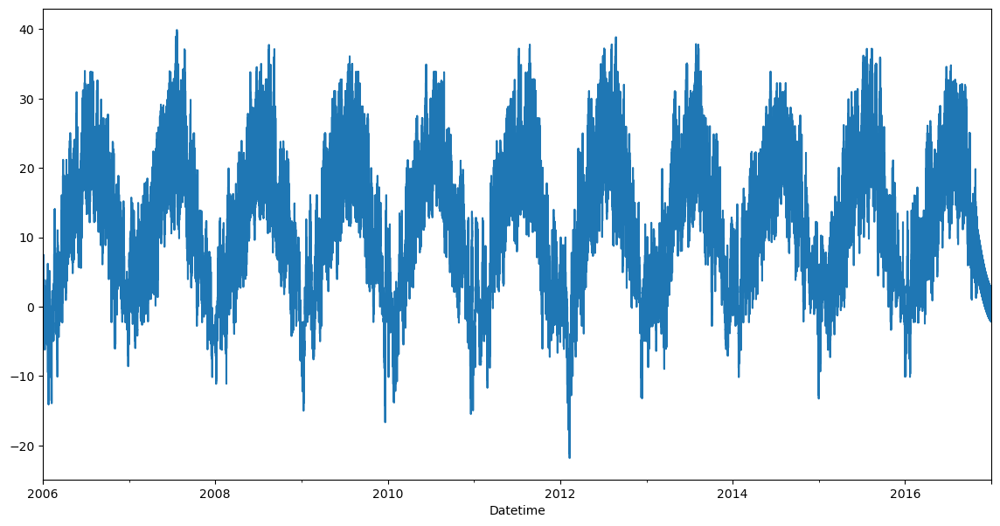

In [ ]:
plt.figure(figsize = (14, 7))
df['Temperature (C)'].plot()
plt.show()

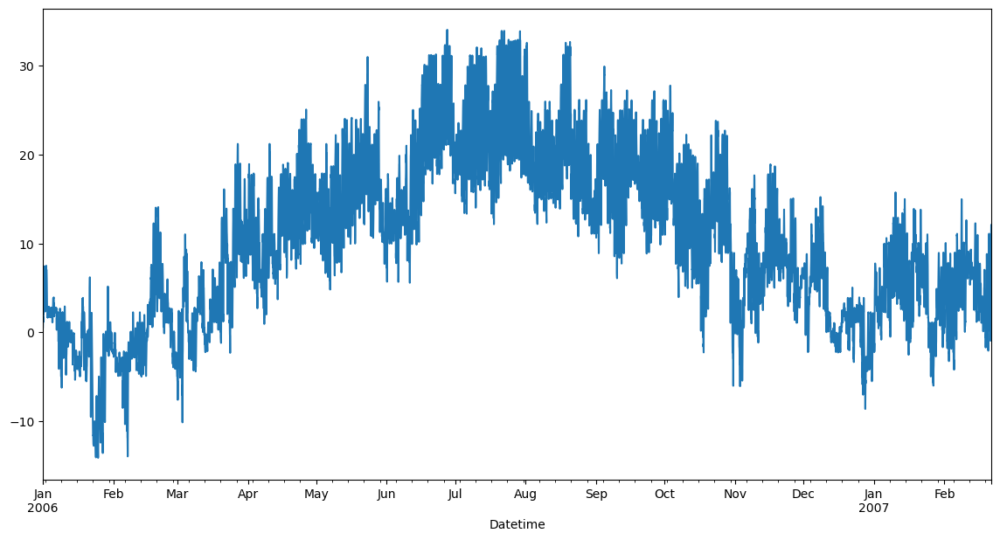

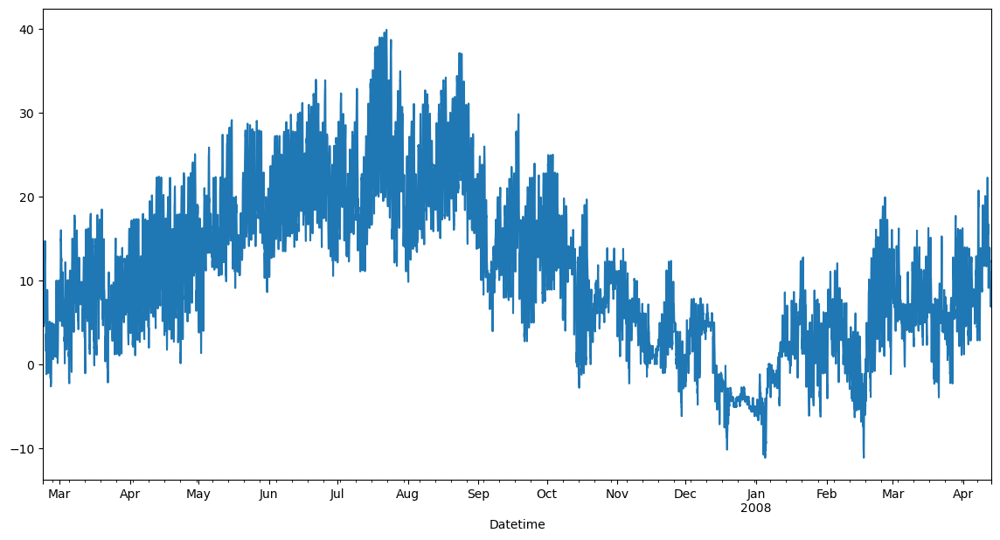

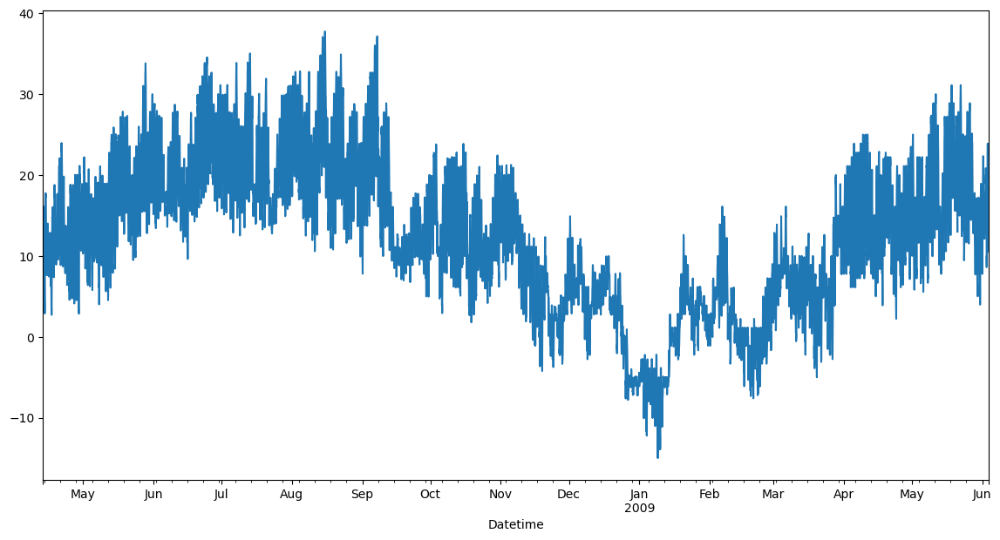

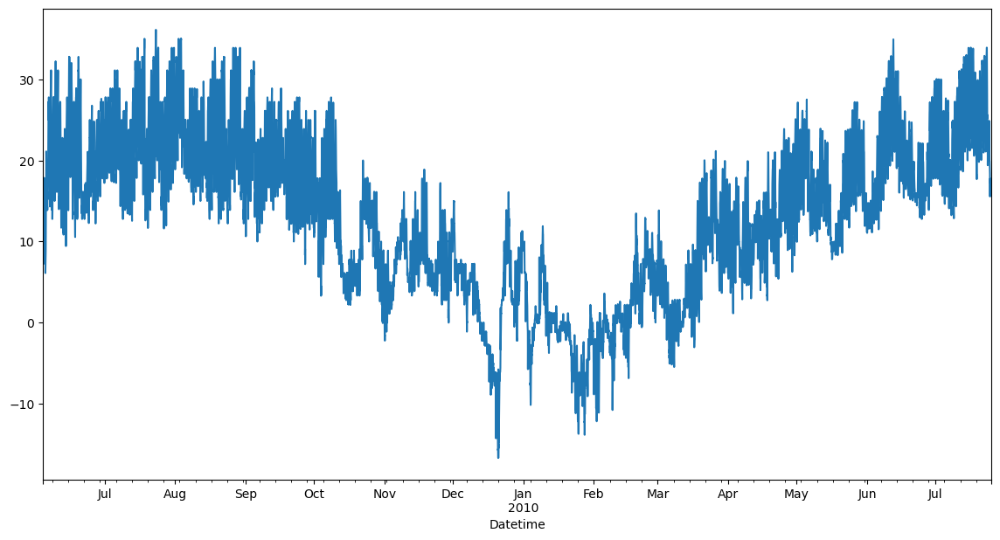

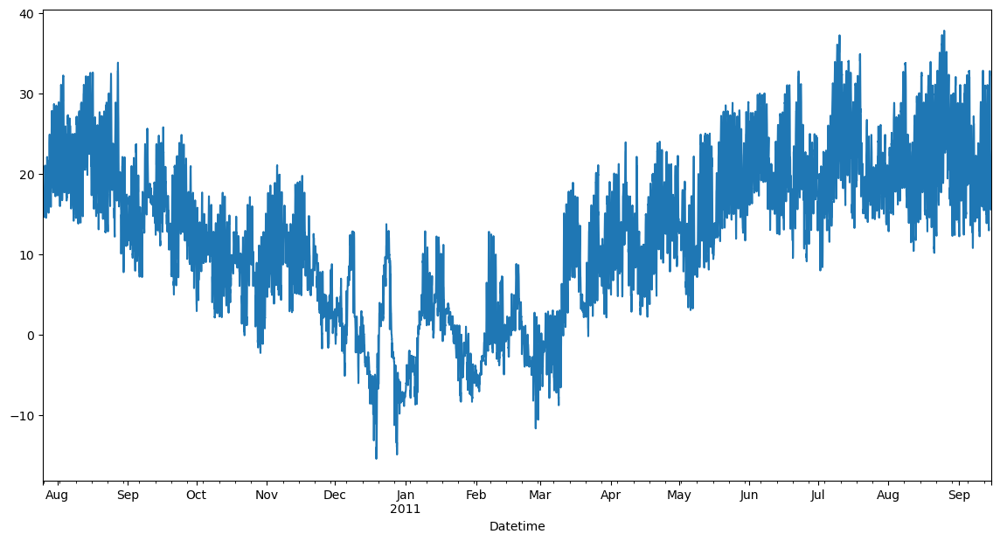

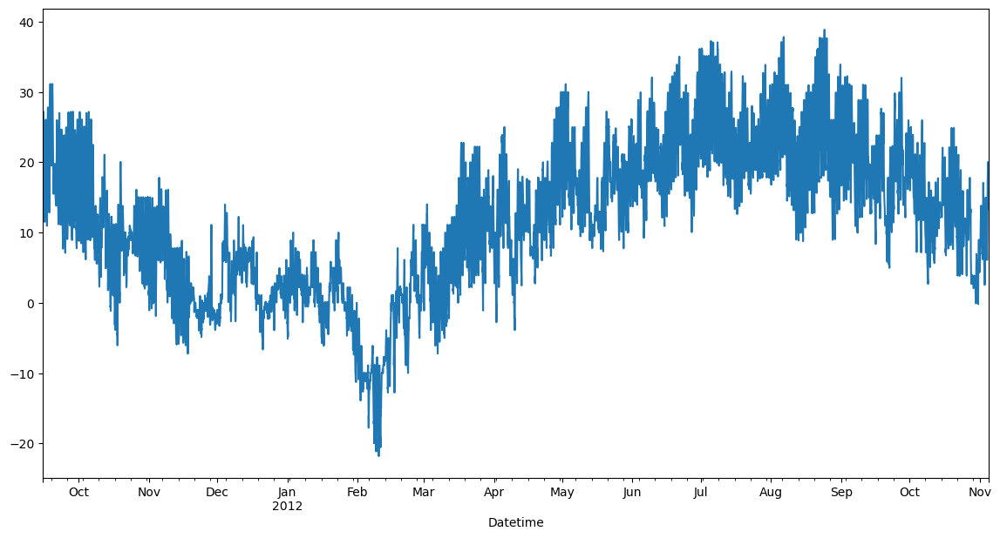

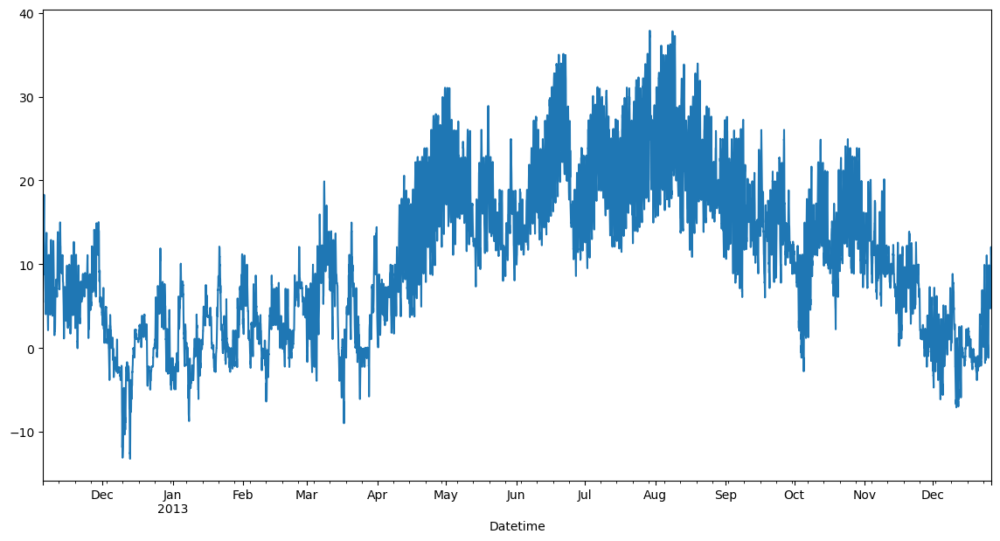

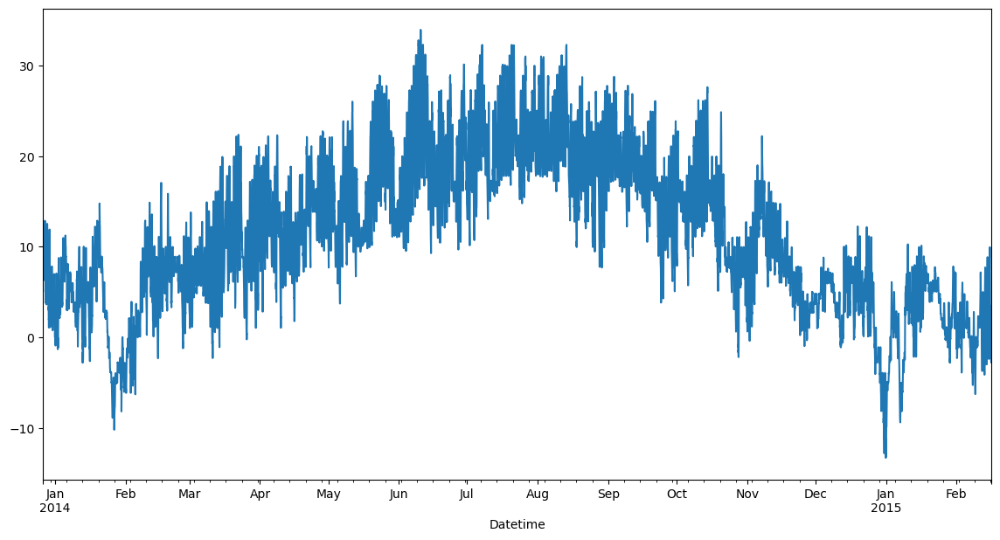

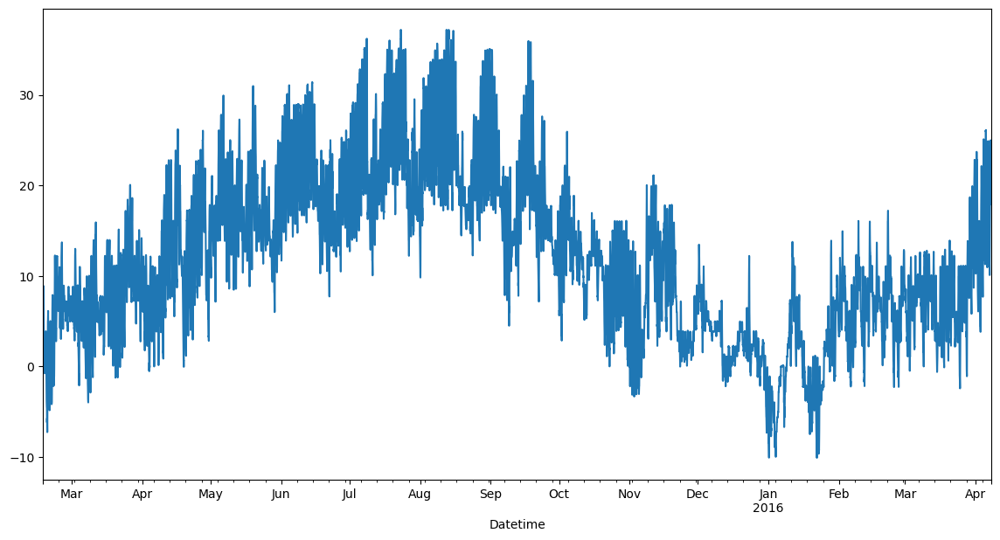

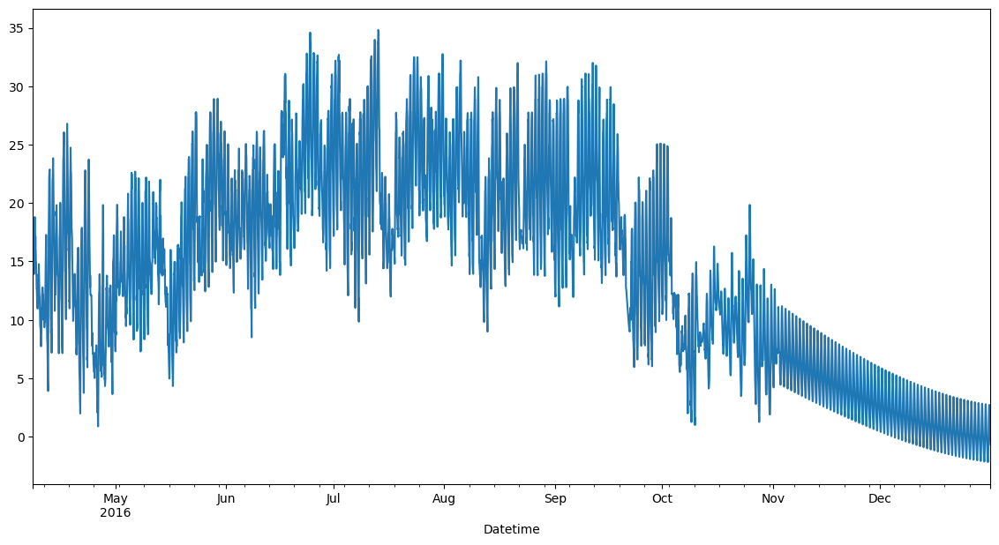

In [ ]:
step = 10000
for i in range(0, len(df), step):
    plt.figure(figsize = (14, 7))
    df.iloc[i:i + step]['Temperature (C)'].plot()
    plt.show()

## Dropping unnecessary columns

In [ ]:
df.drop(columns = ['Summary', 'Apparent Temperature (C)', 'Loud Cover', 'Daily Summary'], inplace = True)
df

,Precip Type,Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars)
Datetime,,,,,,,
2005-12-31 23:00:00+00:00,rain,0.577778,0.89,17.1143,140.0,9.9820,1016.66
2006-01-01 00:00:00+00:00,rain,1.161111,0.85,16.6152,139.0,9.9015,1016.15
2006-01-01 01:00:00+00:00,rain,1.666667,0.82,20.2538,140.0,9.9015,1015.87
2006-01-01 02:00:00+00:00,rain,1.711111,0.82,14.4900,140.0,9.9015,1015.56
2006-01-01 03:00:00+00:00,rain,1.183333,0.86,13.9426,134.0,9.9015,1014.98
...,...,...,...,...,...,...,...
2016-12-31 18:00:00+00:00,rain,0.488889,0.86,9.7566,167.0,8.0178,1020.03
2016-12-31 19:00:00+00:00,rain,0.072222,0.88,9.4185,169.0,7.2450,1020.27
2016-12-31 20:00:00+00:00,snow,-0.233333,0.89,9.2736,175.0,9.5795,1020.50


## Filling missing values

In [ ]:
print('Amount of missing values:')
print(df.isna().sum(axis = 0))

Amount of missing values:
Precip Type               520
Temperature (C)             3
Humidity                    3
Wind Speed (km/h)           3
Wind Bearing (degrees)      3
Visibility (km)             3
Pressure (millibars)        3
dtype: int64


In [ ]:
df['Precip Type'].unique()

array(['rain', 'snow', nan], dtype=object)

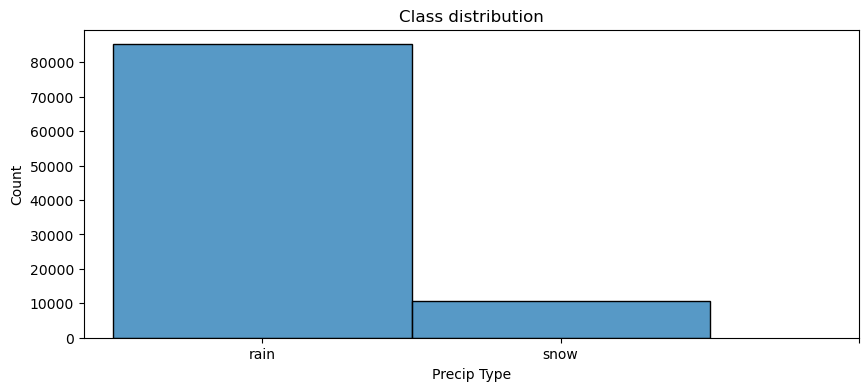

In [ ]:
def show_class_distribution(y, encoder = None):
    ticks = [i for i in range(0, len(y.unique()))]
    plt.figure(figsize = (10, 4))
    plt.title('Class distribution')
    if encoder != None:
        sb.histplot(encoder.inverse_transform(y), discrete = True)
    else:
        sb.histplot(y, discrete = True)
    plt.xticks(ticks)
    plt.show()

show_class_distribution(df['Precip Type'])

In [ ]:
df.fillna({'Precip Type': 'rain'}, inplace = True)
df.fillna({'Temperature (C)': df['Temperature (C)'].mean()}, inplace = True)
df.fillna({'Humidity': df['Humidity'].mean()}, inplace = True)
df.fillna({'Wind Speed (km/h)': df['Wind Speed (km/h)'].mean()}, inplace = True)
df.fillna({'Wind Bearing (degrees)': df['Wind Bearing (degrees)'].mean()}, inplace = True)
df.fillna({'Visibility (km)': df['Visibility (km)'].mean()}, inplace = True)
df.fillna({'Pressure (millibars)': df['Pressure (millibars)'].mean()}, inplace = True)
print('Amount of missing values:')
print(df.isna().sum(axis = 0))

Amount of missing values:
Precip Type               0
Temperature (C)           0
Humidity                  0
Wind Speed (km/h)         0
Wind Bearing (degrees)    0
Visibility (km)           0
Pressure (millibars)      0
dtype: int64


## Precipitation type encoding

In [ ]:
df = pd.get_dummies(df, columns = ['Precip Type'])
df.replace({False: 0, True: 1}, inplace = True)
df

,Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Precip Type_rain,Precip Type_snow
Datetime,,,,,,,,
2005-12-31 23:00:00+00:00,0.577778,0.89,17.1143,140.0,9.9820,1016.66,1,0
2006-01-01 00:00:00+00:00,1.161111,0.85,16.6152,139.0,9.9015,1016.15,1,0
2006-01-01 01:00:00+00:00,1.666667,0.82,20.2538,140.0,9.9015,1015.87,1,0
2006-01-01 02:00:00+00:00,1.711111,0.82,14.4900,140.0,9.9015,1015.56,1,0
2006-01-01 03:00:00+00:00,1.183333,0.86,13.9426,134.0,9.9015,1014.98,1,0
...,...,...,...,...,...,...,...,...
2016-12-31 18:00:00+00:00,0.488889,0.86,9.7566,167.0,8.0178,1020.03,1,0
2016-12-31 19:00:00+00:00,0.072222,0.88,9.4185,169.0,7.2450,1020.27,1,0
2016-12-31 20:00:00+00:00,-0.233333,0.89,9.2736,175.0,9.5795,1020.50,0,1


## Preprocessed dataset lookup

In [ ]:
dataset_lookup(df)

Dataset info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96432 entries, 2005-12-31 23:00:00+00:00 to 2016-12-31 22:00:00+00:00
Freq: H
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Temperature (C)         96432 non-null  float64
 1   Humidity                96432 non-null  float64
 2   Wind Speed (km/h)       96432 non-null  float64
 3   Wind Bearing (degrees)  96432 non-null  float64
 4   Visibility (km)         96432 non-null  float64
 5   Pressure (millibars)    96432 non-null  float64
 6   Precip Type_rain        96432 non-null  uint8  
 7   Precip Type_snow        96432 non-null  uint8  
dtypes: float64(6), uint8(2)
memory usage: 5.3 MB
None

Dataset description:
       Temperature (C)      Humidity  Wind Speed (km/h)  \
count     96432.000000  96432.000000       96432.000000   
mean         11.929692      0.734902          10.812460   
std           9.550343      0.195463   

# Feature engineering

## Adding time features

In [ ]:
df['year'] = df.index.year
df['quarter'] = df.index.quarter
df['month'] = df.index.month
df['week_of_year'] = pd.Index(df.index.isocalendar().week)
df['week_of_year'] = df['week_of_year'].astype(int)
df['day'] = df.index.day
df['day_of_year'] = df.index.dayofyear
df['day_of_week'] = df.index.dayofweek
df['hour'] = df.index.hour
df

,Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Precip Type_rain,Precip Type_snow,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
Datetime,,,,,,,,,,,,,,,,
2005-12-31 23:00:00+00:00,0.577778,0.89,17.1143,140.0,9.9820,1016.66,1,0,2005,4,12,52,31,365,5,23
2006-01-01 00:00:00+00:00,1.161111,0.85,16.6152,139.0,9.9015,1016.15,1,0,2006,1,1,52,1,1,6,0
2006-01-01 01:00:00+00:00,1.666667,0.82,20.2538,140.0,9.9015,1015.87,1,0,2006,1,1,52,1,1,6,1
2006-01-01 02:00:00+00:00,1.711111,0.82,14.4900,140.0,9.9015,1015.56,1,0,2006,1,1,52,1,1,6,2
2006-01-01 03:00:00+00:00,1.183333,0.86,13.9426,134.0,9.9015,1014.98,1,0,2006,1,1,52,1,1,6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 18:00:00+00:00,0.488889,0.86,9.7566,167.0,8.0178,1020.03,1,0,2016,4,12,52,31,366,5,18
2016-12-31 19:00:00+00:00,0.072222,0.88,9.4185,169.0,7.2450,1020.27,1,0,2016,4,12,52,31,366,5,19
2016-12-31 20:00:00+00:00,-0.233333,0.89,9.2736,175.0,9.5795,1020.50,0,1,2016,4,12,52,31,366,5,20


## Showcase of time features

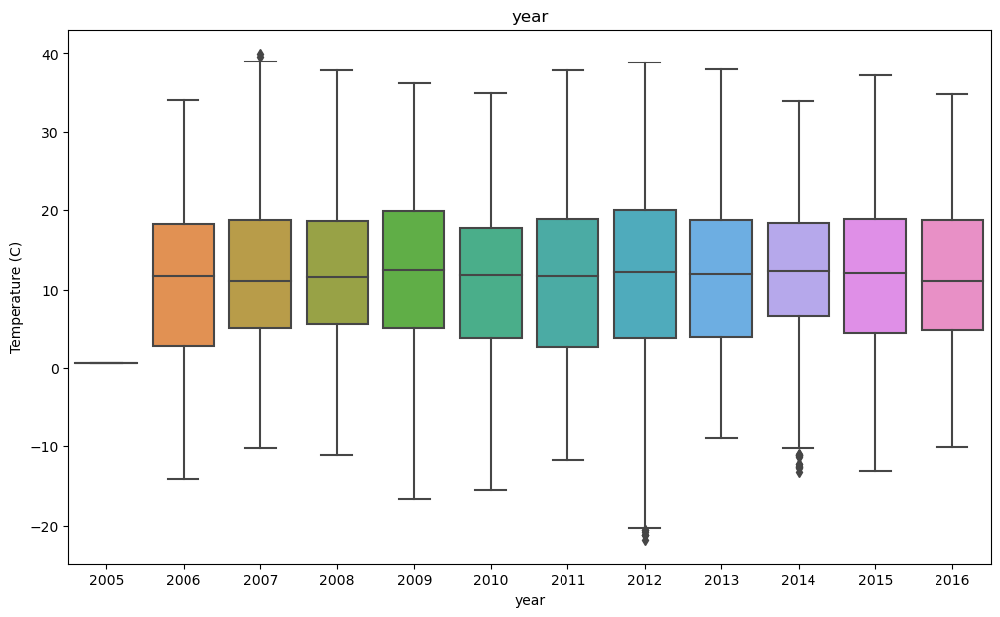

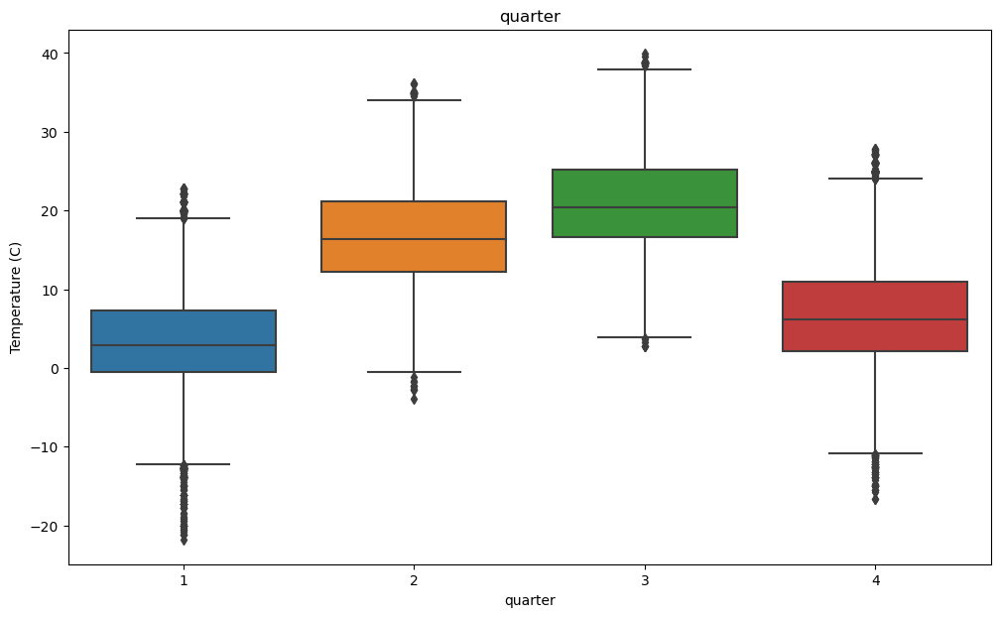

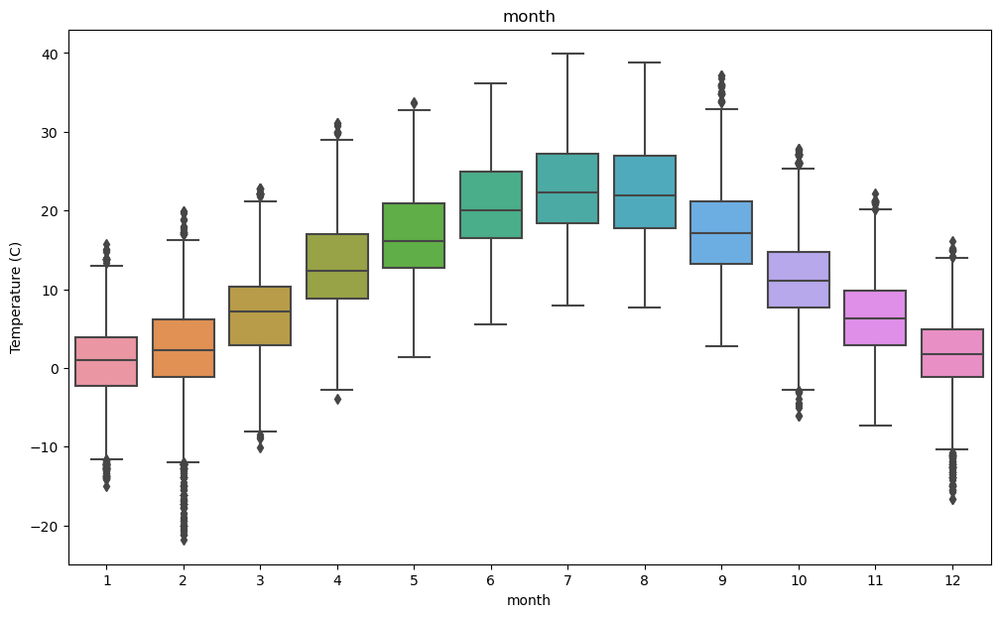

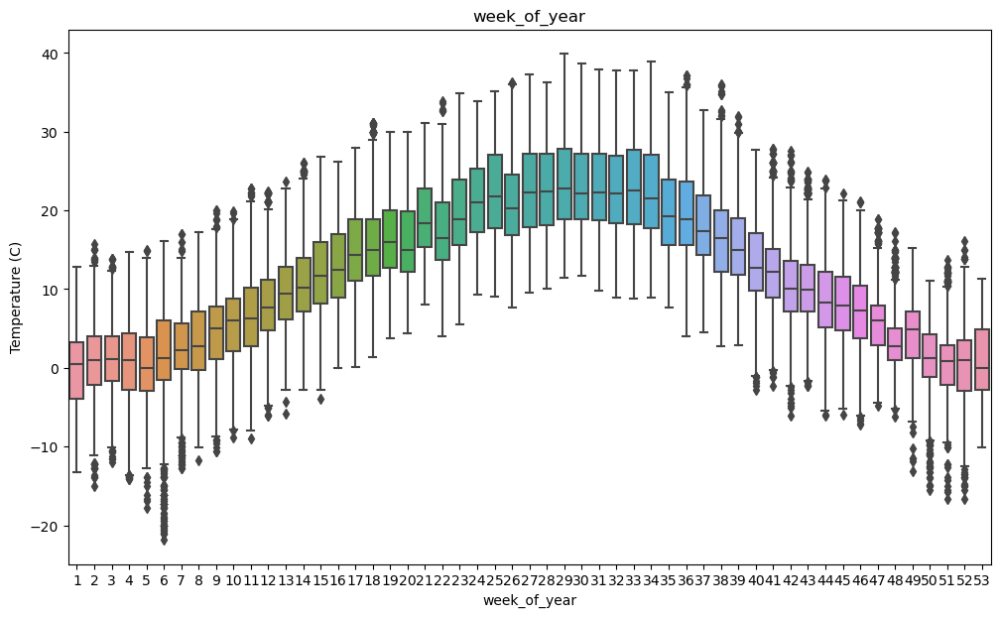

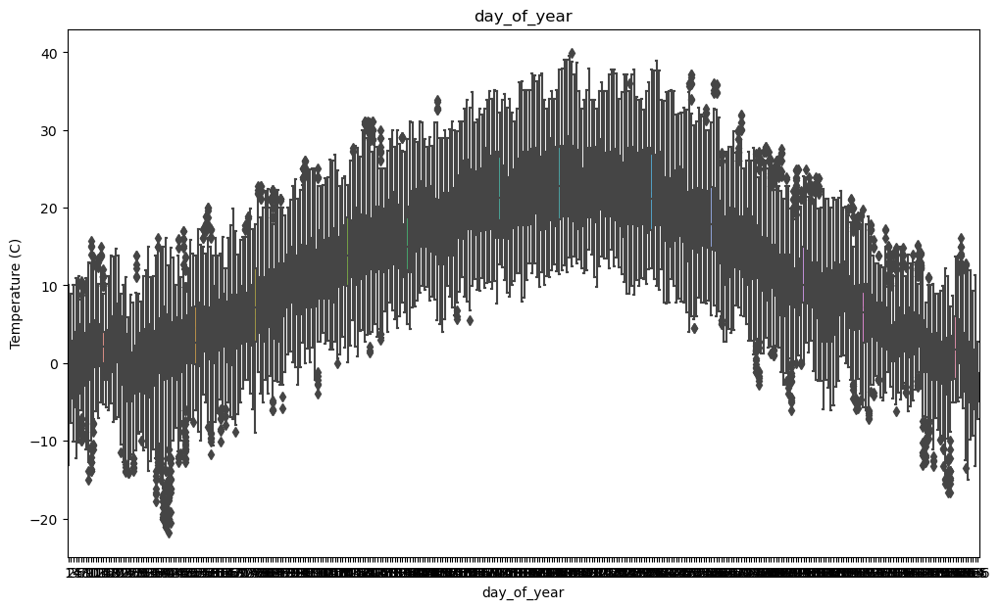

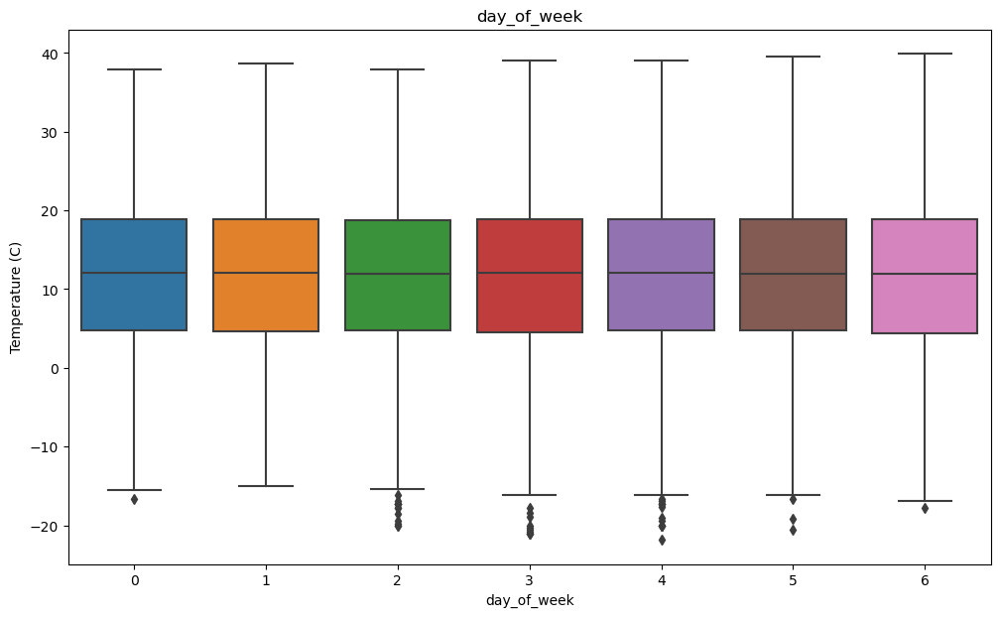

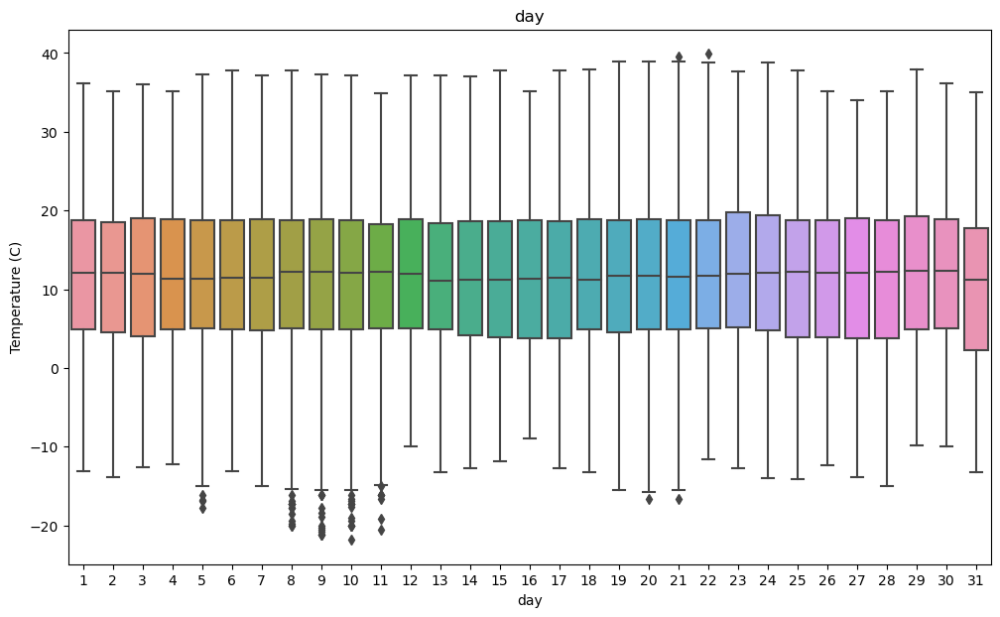

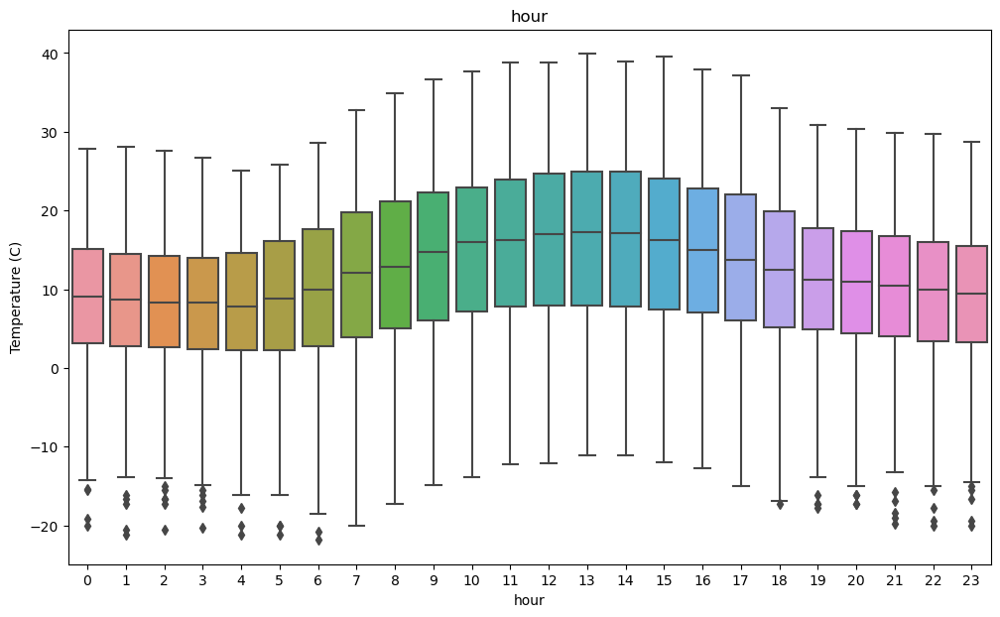

In [ ]:
time_features = ['year', 'quarter', 'month', 'week_of_year', 'day_of_year', 'day_of_week', 'day', 'hour']
for feature in time_features:
    plt.figure(figsize = (12, 7))
    plt.title(feature)
    sb.boxplot(x = feature, y = 'Temperature (C)', data = df)
    plt.show()

# Cross-validation for time series using neural networks

In [4]:
# df.to_csv('weather_history_preprocessed.csv')
df = pd.read_csv(f'{drive_path}/weather_history_preprocessed.csv', index_col = 'Datetime')
df

,Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Precip Type_rain,Precip Type_snow,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
Datetime,,,,,,,,,,,,,,,,
2005-12-31 23:00:00+00:00,0.577778,0.89,17.1143,140.0,9.9820,1016.66,1,0,2005,4,12,52,31,365,5,23
2006-01-01 00:00:00+00:00,1.161111,0.85,16.6152,139.0,9.9015,1016.15,1,0,2006,1,1,52,1,1,6,0
2006-01-01 01:00:00+00:00,1.666667,0.82,20.2538,140.0,9.9015,1015.87,1,0,2006,1,1,52,1,1,6,1
2006-01-01 02:00:00+00:00,1.711111,0.82,14.4900,140.0,9.9015,1015.56,1,0,2006,1,1,52,1,1,6,2
2006-01-01 03:00:00+00:00,1.183333,0.86,13.9426,134.0,9.9015,1014.98,1,0,2006,1,1,52,1,1,6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 18:00:00+00:00,0.488889,0.86,9.7566,167.0,8.0178,1020.03,1,0,2016,4,12,52,31,366,5,18
2016-12-31 19:00:00+00:00,0.072222,0.88,9.4185,169.0,7.2450,1020.27,1,0,2016,4,12,52,31,366,5,19
2016-12-31 20:00:00+00:00,-0.233333,0.89,9.2736,175.0,9.5795,1020.50,0,1,2016,4,12,52,31,366,5,20


## Taking a smaller part of the dataset

In [5]:
slice_amount = 24 * 365 * 5 # last 5 years of historical data
print(f'Taking {slice_amount} rows of data')
df_small = df[-slice_amount:].copy()

Taking 43800 rows of data


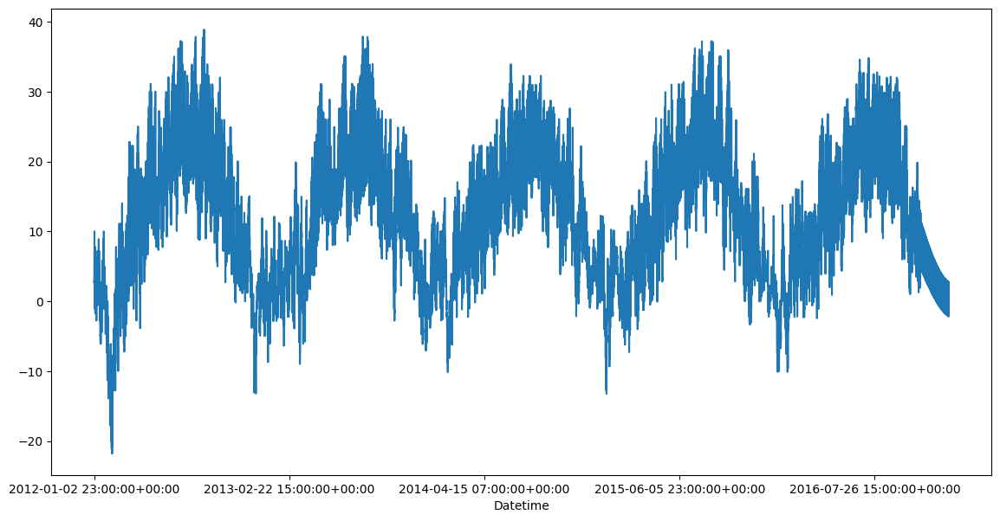

In [6]:
plt.figure(figsize = (14, 7))
df_small['Temperature (C)'].plot()
plt.show()

## Train & test split

In [11]:
rows_count = len(df_small)
proportion = 0.80
train_count = int(rows_count * proportion)
test_count = rows_count - train_count
df_train = df_small[:train_count].copy()
df_test = df_small[train_count:train_count + test_count].copy()
print(f'Train: {len(df_train)}')
print(f'Test: {len(df_test)}')

Train: 35040
Test: 8760


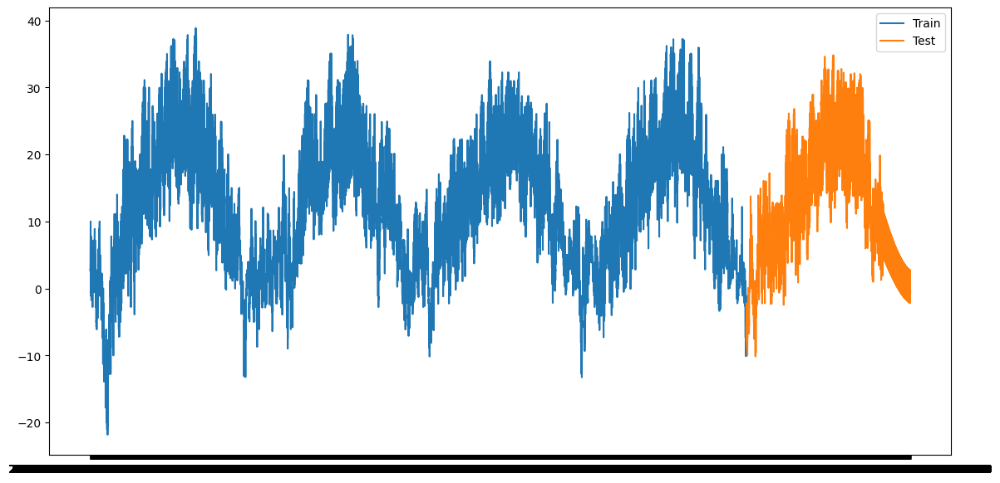

In [13]:
plt.figure(figsize = (14, 7))
plt.plot(df_train['Temperature (C)'])
plt.plot(df_test['Temperature (C)'])
plt.legend(['Train', 'Test'])
plt.show()

## Functions & imports

In [14]:
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import r2_score as r2, mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae

def rmse(y_true, y_pred):
    return np.sqrt(mse(y_test, y_pred))

def mape(y_true, y_pred):
    return (1.0 / len(y_true)) * np.sum(np.abs((y_true - y_pred) / y_true))

def smape(y_true, y_pred):
    return (1.0 / len(y_true)) * np.sum(np.abs(y_pred - y_true) / ((y_true + y_pred) / 2.0))

def scale_train_and_test(train, test, columns_to_scale):
    if train.shape[-1] != test.shape[-1]:
        raise Exception('Train and test dataframes are incompatible')
    scaler = StandardScaler()
    train_scaled_columns = scaler.fit_transform(train[columns_to_scale])
    test_scaled_columns = scaler.transform(test[columns_to_scale])
    columns = list(train.columns)
    for column in columns_to_scale:
        columns.remove(column)
    train_scaled = pd.DataFrame(
        train.drop(columns = columns_to_scale),
        index = train.index,
        columns = columns)
    for i, column in enumerate(columns_to_scale):
        train_scaled[column] = train_scaled_columns.T[i]
    test_scaled = pd.DataFrame(
        test.drop(columns = columns_to_scale),
        index = test.index,
        columns = columns)
    for i, column in enumerate(columns_to_scale):
        test_scaled[column] = test_scaled_columns.T[i]
    return train_scaled, test_scaled, scaler

def show_regression_chart(y, prediction, sort = True):
    t = pd.DataFrame({'prediction': prediction, 'y': y})
    if sort:
        t.sort_values(by = ['y'], inplace = True)
    plt.figure(figsize = (10, 6))
    plt.plot(t['y'].tolist(), label = 'expected')
    plt.plot(t['prediction'].tolist(), label = 'prediction')
    plt.ylabel('output')
    plt.legend()
    plt.xticks(rotation = 45)
    plt.show()

def show_training_history(history, metrics, metric_names, figure_size = (7, 6), last_epoch = None):
    if len(metrics) == 1 and len(metric_names) == 1:
        plt.figure(figsize = figure_size)
        fig, ax = plt.subplots()
        metric = metrics[0]
        metric_name = metric_names[0]
        ax.plot(history[metric], color = 'b', label = f'Training {metric_name}')
        if f'val_{metric}' in history:
            ax.plot(history[f'val_{metric}'], color = 'r', label = f'Validation {metric_name}')
        if last_epoch is not None:
            ax.axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
        legend = ax.legend(loc = 'best', shadow = True)
        plt.show()
    elif len(metrics) > 1 and len(metrics) == len(metric_names):
        plt.figure(figsize = figure_size)
        fig, ax = plt.subplots(len(metrics), 1)
        for i in range(len(metrics)):
            metric = metrics[i]
            metric_name = metric_names[i]
            ax[i].plot(history[metric], color = 'b', label = f'Training {metric_name}')
            if f'val_{metric}' in history:
                ax[i].plot(history[f'val_{metric}'], color = 'r', label = f'Validation {metric_name}', axes = ax[i])
            if last_epoch is not None:
                ax[i].axvline(x = last_epoch, color = 'g', label = 'Start of fine tuning')
            legend = ax[i].legend(loc = 'best', shadow = True)
        plt.show()
    else:
        raise Exception('Invalid metrics/metric names amount')

def create_dataset(df, target_column_name, look_back = 1):
    target_column_position = df.columns.get_loc(target_column_name)
    dataX, dataY = [], []
    for i in range(len(df) - look_back - 1):
        x_slice = df.iloc[i:(i + look_back)]
        x_slice = x_slice.drop(x_slice.columns[target_column_position], axis = 1)
        dataX.append(x_slice)
        dataY.append(df.iloc[i + look_back, target_column_position])
    dataX = np.array(dataX)
    dataY = np.array(dataY)
    return np.reshape(dataX, (dataX.shape[0], dataX.shape[1], df.shape[-1] - 1)), dataY

In [15]:
!pip install catboost --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 2.6 MB/s eta 0:00:00


## ML models

----------------
Dummy model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


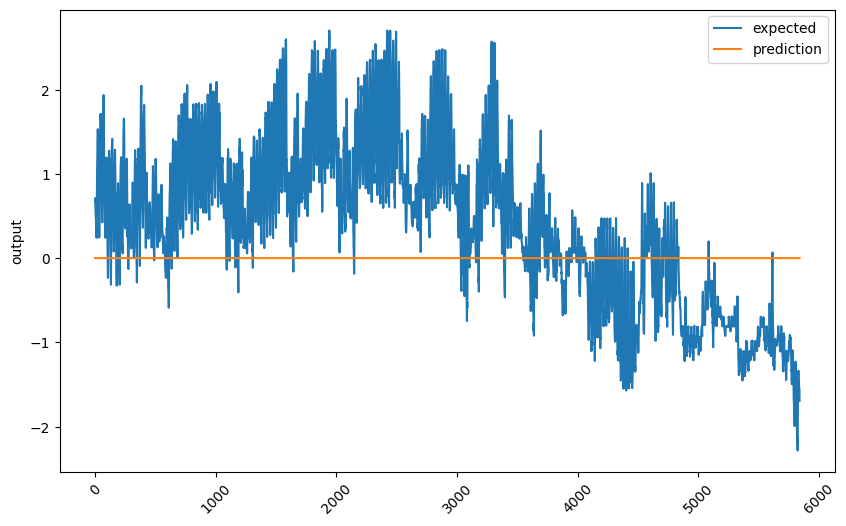

Done!

----------------
LR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


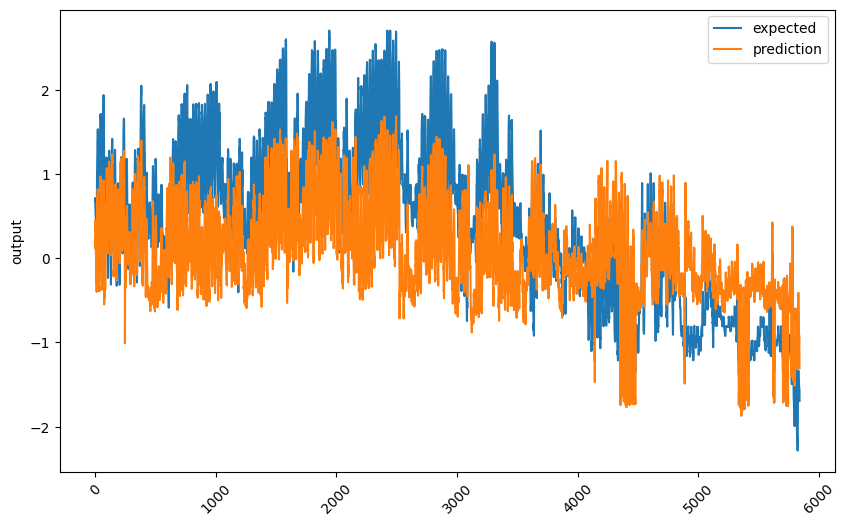

Done!

----------------
KNN model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


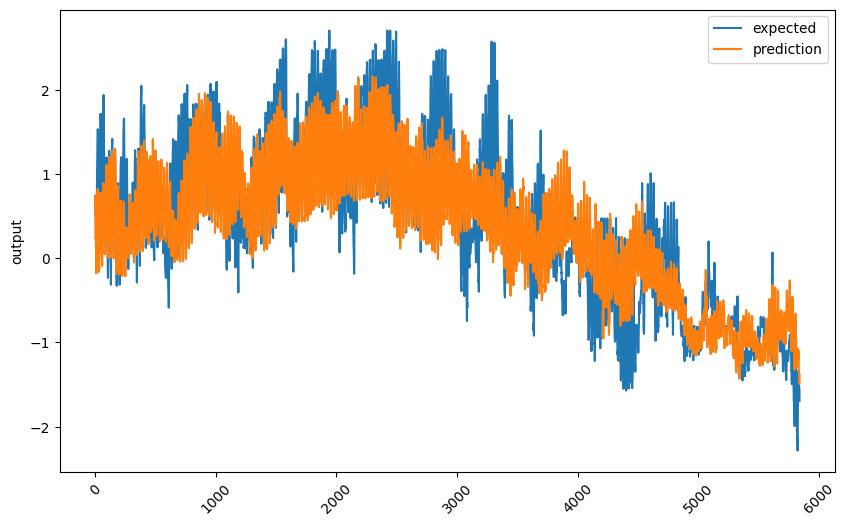

Done!

----------------
CART model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


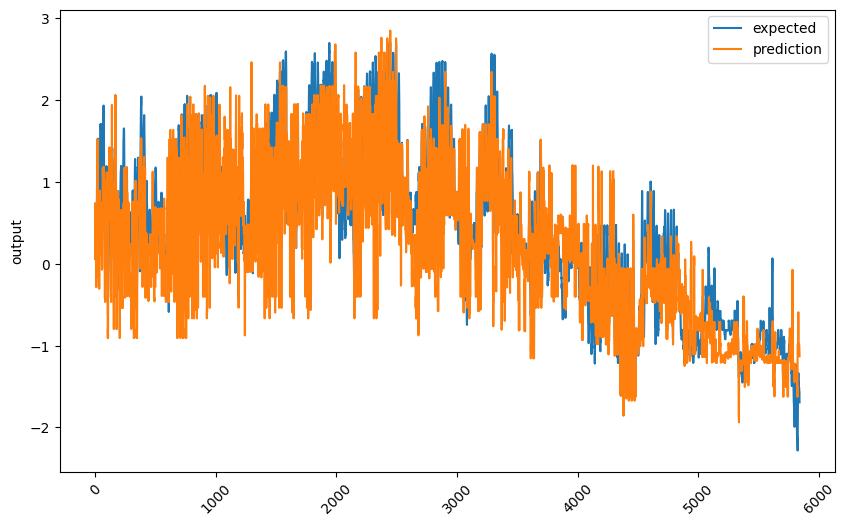

Done!

----------------
RF model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


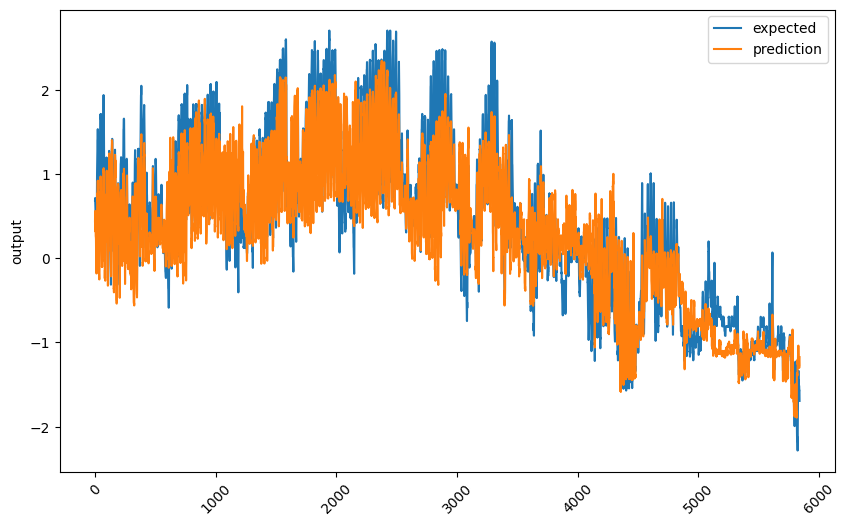

Done!

----------------
XT model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


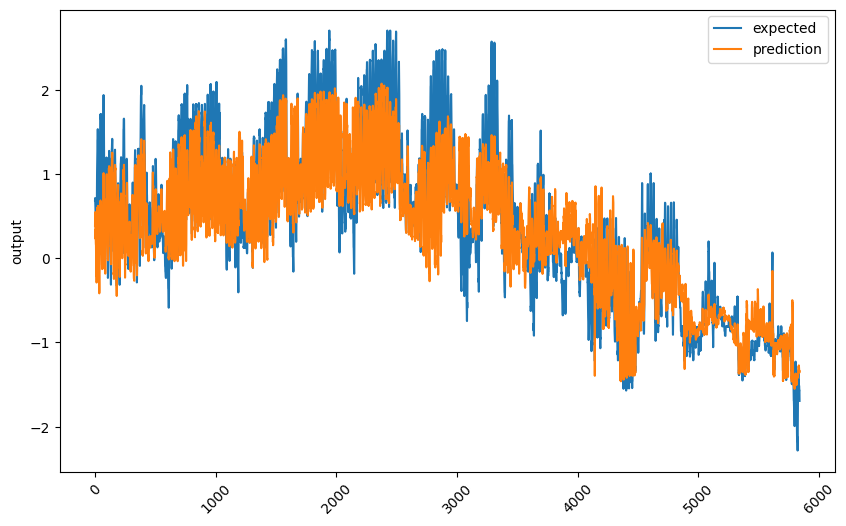

Done!

----------------
BAG model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


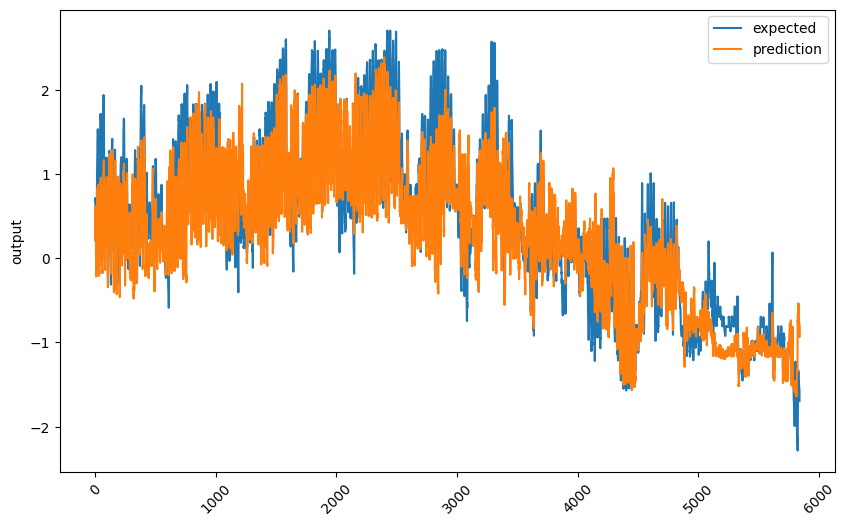

Done!

----------------
ADA model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


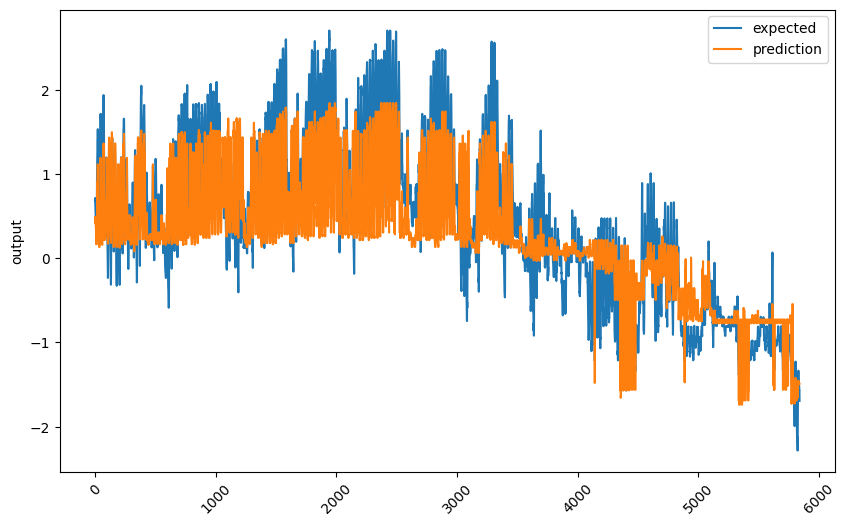

Done!

----------------
HGBoost model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


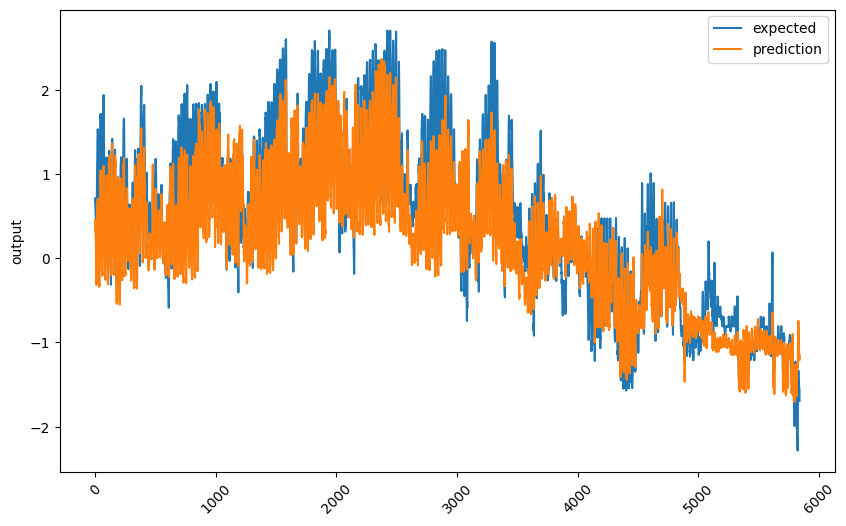

Done!

----------------
XGBoost model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


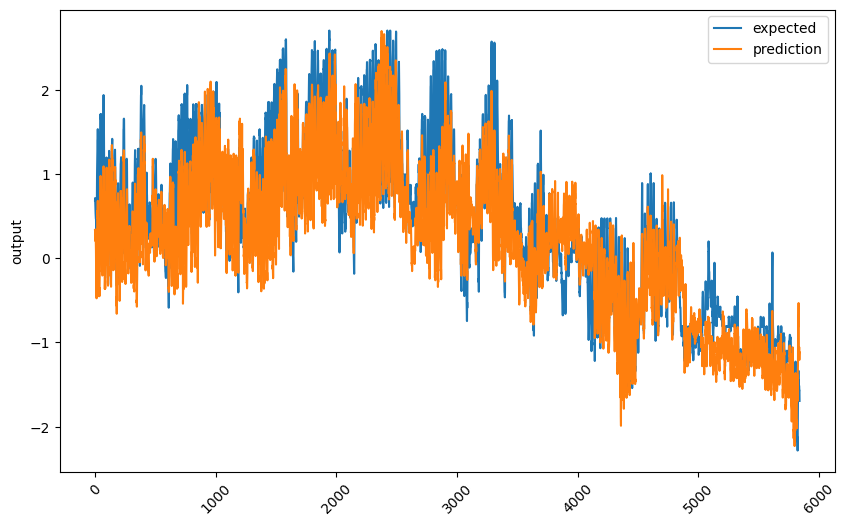

Done!

----------------
CatBoost model...
Fold #1...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #2...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #3...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #4...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #5...


Default metric period is 5 because MAE is/are not implemented for GPU


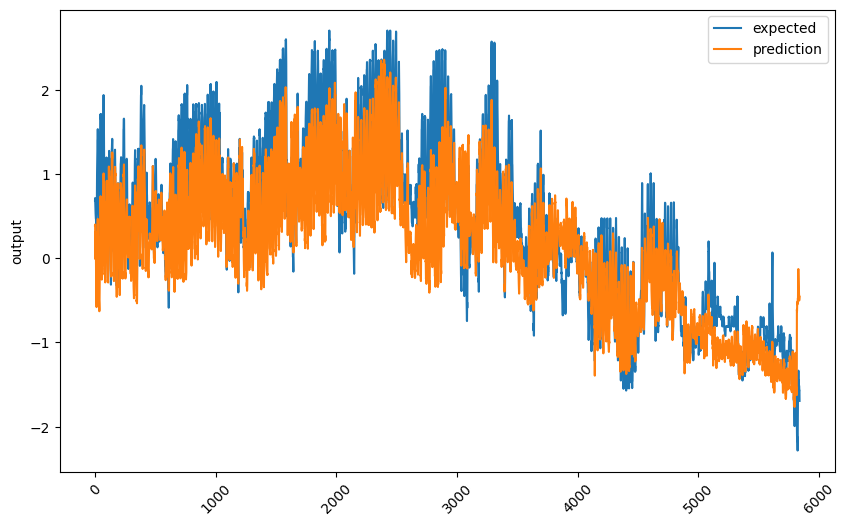

Done!



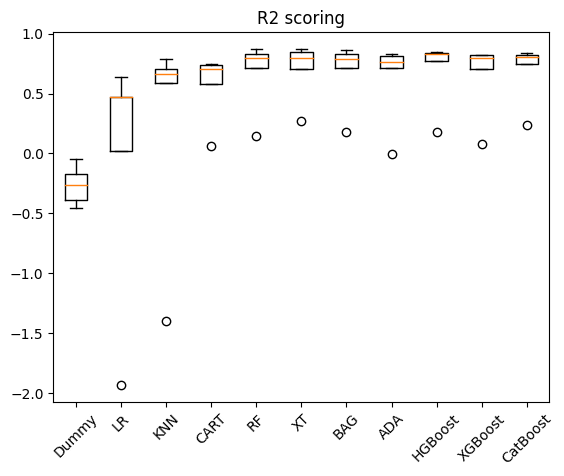

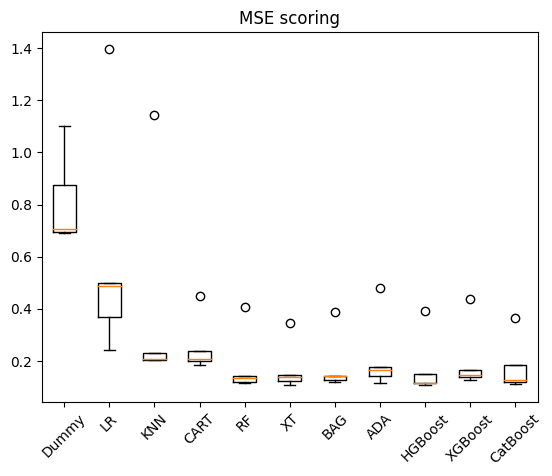

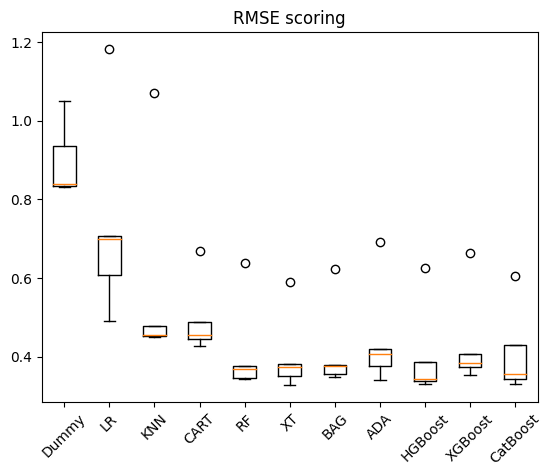

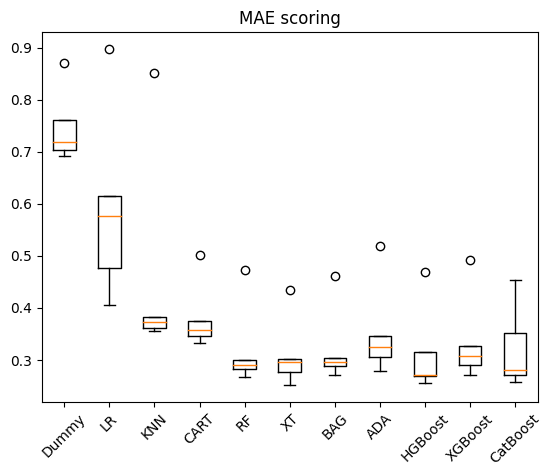

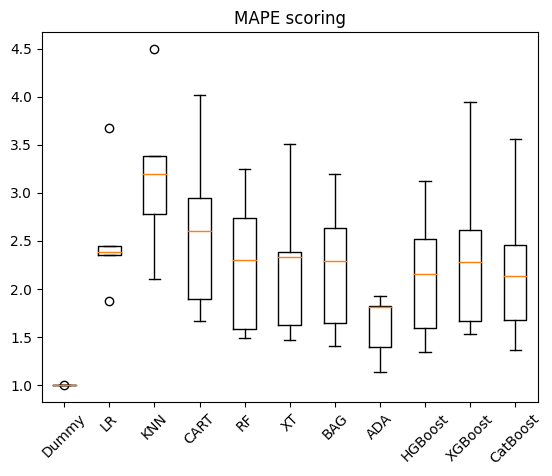

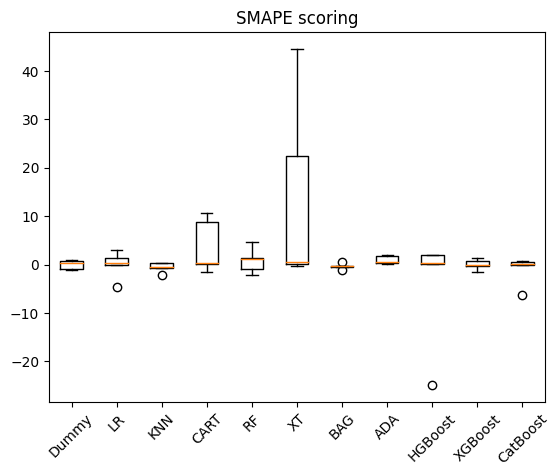

In [16]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.dummy import DummyRegressor

models = []
models.append(('Dummy', DummyRegressor()))
models.append(('LR', LinearRegression(fit_intercept = False)))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 20, n_jobs = -1)))
models.append(('CART', DecisionTreeRegressor(random_state = 42)))
models.append(('RF', RandomForestRegressor(n_jobs = -1, random_state = 42)))
models.append(('XT', ExtraTreesRegressor(n_jobs = -1, random_state = 42)))
models.append(('BAG', BaggingRegressor(n_jobs = -1, random_state = 42)))
models.append(('ADA', AdaBoostRegressor(random_state = 42)))
models.append(('HGBoost', HistGradientBoostingRegressor(random_state = 42)))
models.append(('XGBoost', XGBRegressor(tree_method = 'gpu_hist', verbosity = 0, random_state = 42)))
models.append(('CatBoost', CatBoostRegressor(
    random_seed = 42,
    loss_function = 'RMSE',
    eval_metric = 'MAE',
    od_type = 'Iter',
    od_wait = 20,
    task_type = 'GPU',
    logging_level = 'Silent')))

results = {
    'r2' : [],
    'mse' : [],
    'rmse' : [],
    'mae' : [],
    'mape' : [],
    'smape' : []
}
names = []

for name, model in models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : []
    }
    fold_num = 1
    num_of_splits = 5
    timeFold = TimeSeriesSplit(n_splits = num_of_splits)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        columns_to_scale = [
            'Temperature (C)',
            'Humidity',
            'Wind Speed (km/h)',
            'Wind Bearing (degrees)',
            'Visibility (km)',
            'Pressure (millibars)'
        ]
        target_column = 'Temperature (C)'
        train_scaled, test_scaled, _ = scale_train_and_test(train, test, columns_to_scale)
        x_train, y_train = train_scaled.drop(columns = target_column), train_scaled[target_column]
        x_test, y_test = test_scaled.drop(columns = target_column), test_scaled[target_column]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse(y_test, y_pred))
        model_results['rmse'].append(rmse(y_test, y_pred))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred))
        model_results['smape'].append(smape(y_test, y_pred))
        if fold_num == num_of_splits:
            show_regression_chart(y_test, y_pred, sort = False)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

for result_key, result_value in results.items():
    plt.title(f'{result_key.upper()} scoring')
    plt.boxplot(result_value, labels = names)
    plt.xticks(rotation = 45)
    plt.show()

## DL models

In [17]:
import tensorflow as tf
from tensorflow import keras
from keras import Input
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization, ReLU, GRU, LSTM

# List of devices
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [18]:
def get_fnn_model_regression(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(50, activation = 'relu'),
            Dense(40, activation = 'relu'),
            Dense(30, activation = 'relu'),
            Dense(20, activation = 'relu'),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_fnn_model_regression_with_regularization(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            Dense(50),
            BatchNormalization(),
            ReLU(),
            Dense(40),
            BatchNormalization(),
            ReLU(),
            Dense(30),
            BatchNormalization(),
            ReLU(),
            Dense(20),
            BatchNormalization(),
            ReLU(),
            Dense(10),
            BatchNormalization(),
            ReLU(),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_gru_model_regression(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(50, return_sequences = True),
            GRU(40, return_sequences = True),
            GRU(30, return_sequences = True),
            GRU(20),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_gru_model_regression_with_regularization(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            GRU(50, dropout = 0.15, return_sequences = True),
            GRU(40, dropout = 0.20, return_sequences = True),
            GRU(30, dropout = 0.25, return_sequences = True),
            GRU(20, dropout = 0.30),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_lstm_model_regression(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(50, return_sequences = True),
            LSTM(40, return_sequences = True),
            LSTM(30, return_sequences = True),
            LSTM(20),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

def get_lstm_model_regression_with_regularization(input_shape):
    model = Sequential(
        [
            Input(shape = input_shape),
            LSTM(50, dropout = 0.15, return_sequences = True),
            LSTM(40, dropout = 0.20, return_sequences = True),
            LSTM(30, dropout = 0.25, return_sequences = True),
            LSTM(20, dropout = 0.30),
            Dense(10, activation = 'relu'),
            Dense(1)
        ])
    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    return model

----------------
GRU model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


<Figure size 700x600 with 0 Axes>

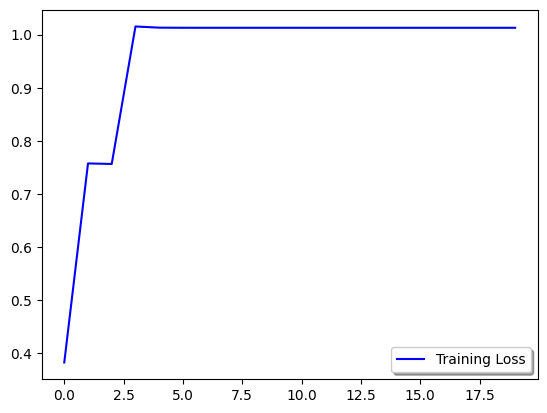

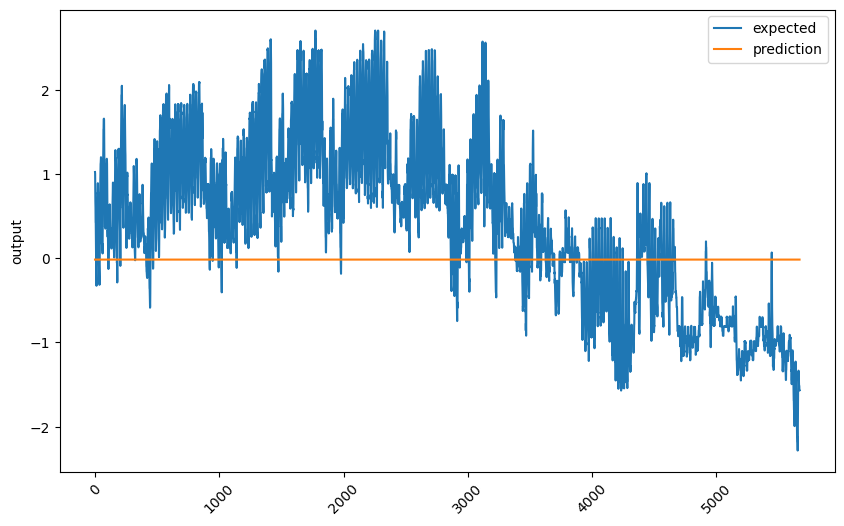

Done!

----------------
GRU w/ Reg. model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


<Figure size 700x600 with 0 Axes>

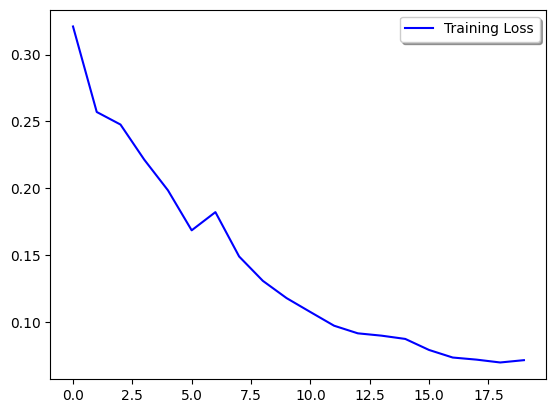

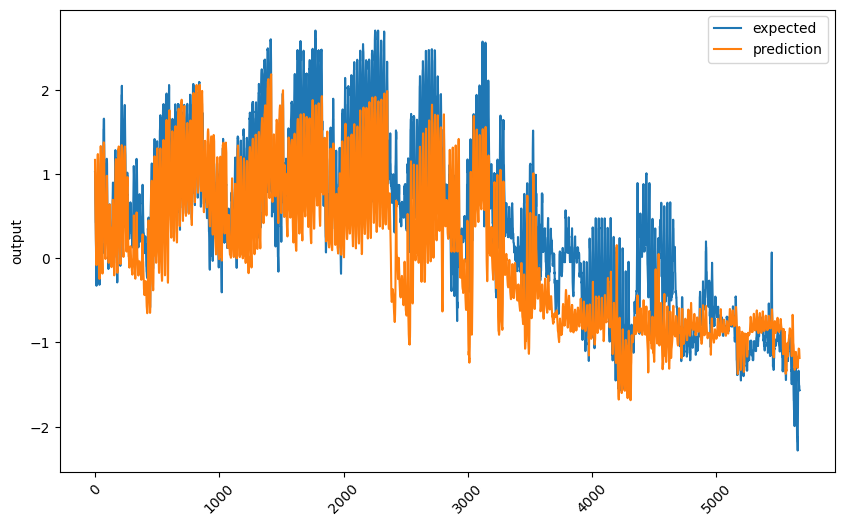

Done!

----------------
LSTM model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


<Figure size 700x600 with 0 Axes>

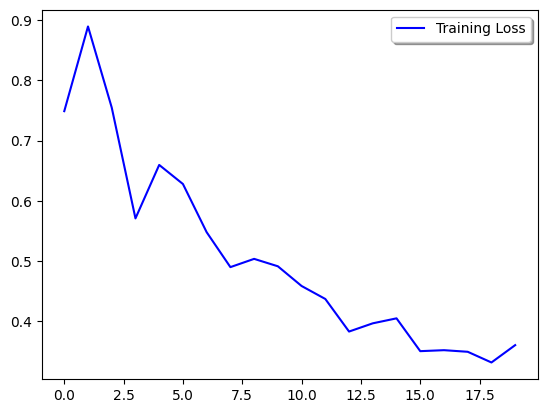

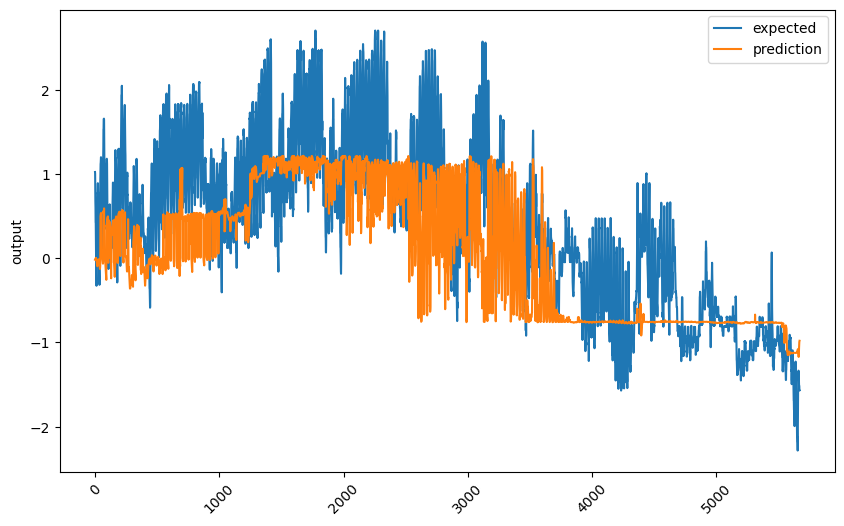

Done!

----------------
LSTM w/ Reg. model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


<Figure size 700x600 with 0 Axes>

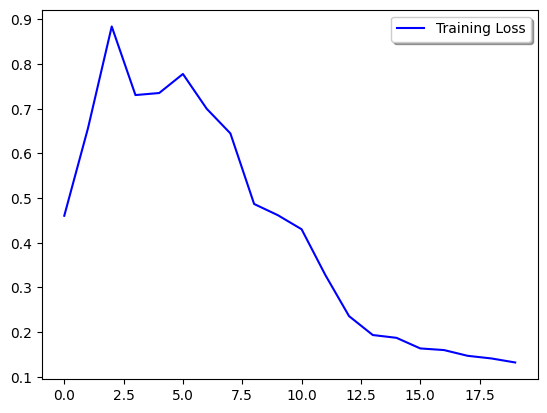

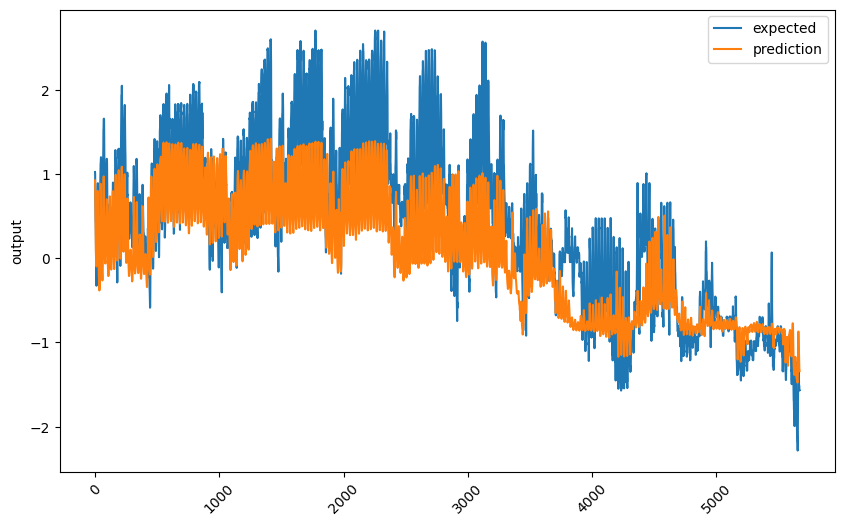

Done!

----------------
FNN model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


<Figure size 700x600 with 0 Axes>

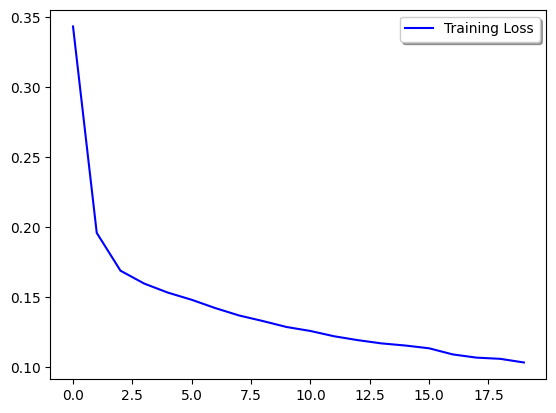

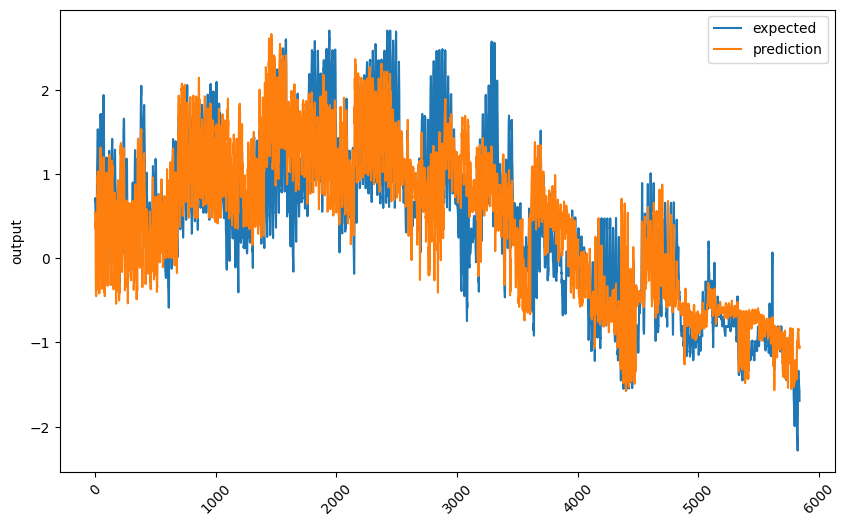

Done!

----------------
FNN w/ Reg. model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...


<Figure size 700x600 with 0 Axes>

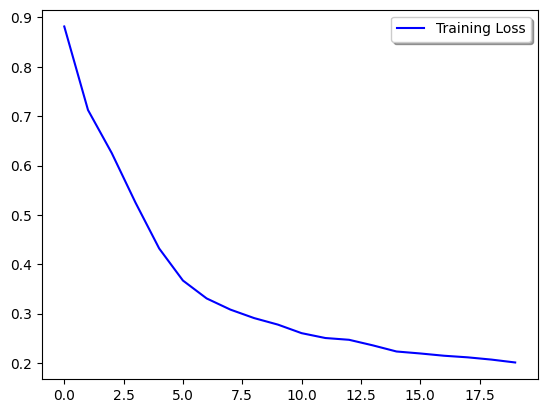

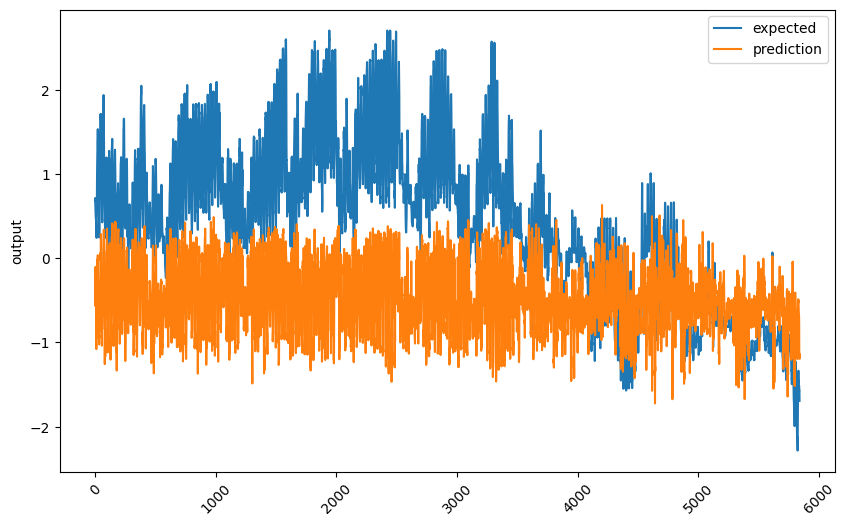

Done!



In [19]:
dl_models = []
dl_models.append(('GRU', get_gru_model_regression))
dl_models.append(('GRU w/ Reg.', get_gru_model_regression_with_regularization))
dl_models.append(('LSTM', get_lstm_model_regression))
dl_models.append(('LSTM w/ Reg.', get_lstm_model_regression_with_regularization))
dl_models.append(('FNN', get_fnn_model_regression))
dl_models.append(('FNN w/ Reg.', get_fnn_model_regression_with_regularization))
batch_size = 32
epochs = 20
look_back = 24 * 7 # use a week of measurements to look back
num_of_variables = df_train.shape[-1] - 1
input_shape_feedforward = (num_of_variables,)
input_shape_recurrent = (look_back, num_of_variables,)

for name, model_function in dl_models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': []
    }
    fold_num = 1
    num_of_splits = 5
    timeFold = TimeSeriesSplit(n_splits = num_of_splits)
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        columns_to_scale = list(df_train.columns)
        columns_to_scale.remove('Precip Type_rain')
        columns_to_scale.remove('Precip Type_snow')
        target_column = 'Temperature (C)'
        train_scaled, test_scaled, _ = scale_train_and_test(train, test, columns_to_scale)
        is_fnn = name.find('FNN') != -1
        (x_train, y_train) = \
            (train_scaled.drop(columns = target_column), train_scaled[target_column]) \
            if is_fnn else \
            create_dataset(train_scaled, target_column, look_back = look_back)
        (x_test, y_test) = \
            (test_scaled.drop(columns = target_column), test_scaled[target_column]) \
            if is_fnn else \
            create_dataset(test_scaled, target_column, look_back = look_back)
        model = model_function(input_shape_feedforward \
            if is_fnn else input_shape_recurrent)
        train_history = model.fit(
            x = x_train,
            y = y_train,
            batch_size = batch_size,
            epochs = epochs,
            shuffle = False,
            verbose = 0).history
        y_pred = model.predict(x_test, verbose = 0)
        model_results['r2'].append(r2(y_test, y_pred))
        model_results['mse'].append(mse(y_test, y_pred))
        model_results['rmse'].append(rmse(y_test, y_pred))
        model_results['mae'].append(mae(y_test, y_pred))
        model_results['mape'].append(mape(y_test, y_pred.flatten()))
        model_results['smape'].append(smape(y_test, y_pred.flatten()))
        if fold_num == num_of_splits:
            show_training_history(train_history, ['loss'], ['Loss'])
            show_regression_chart(y_test, y_pred.flatten(), sort = False)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

## All CV results

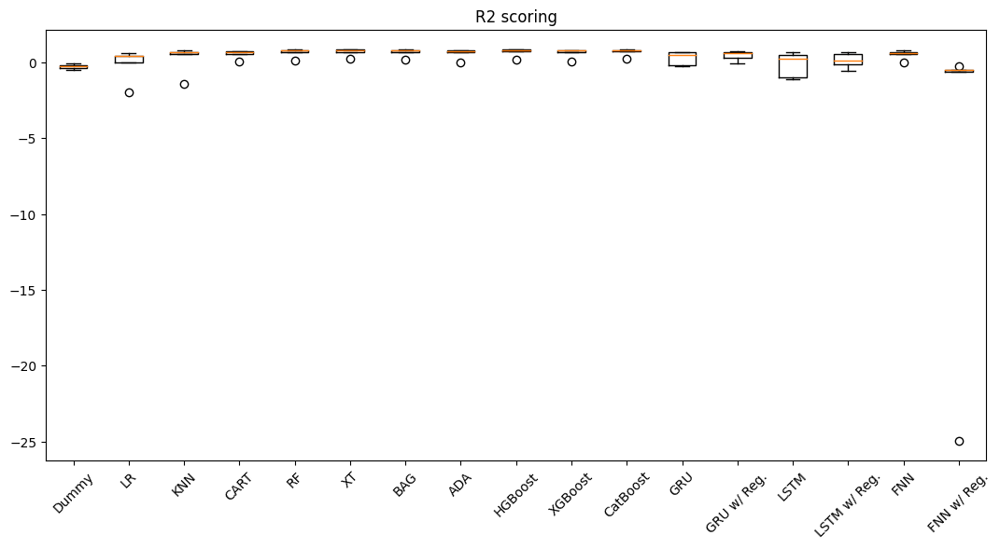

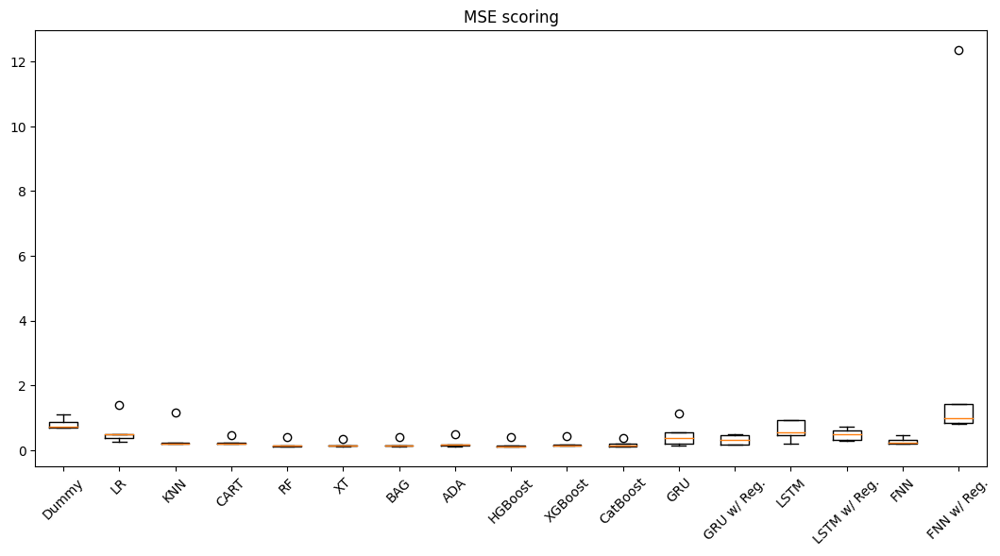

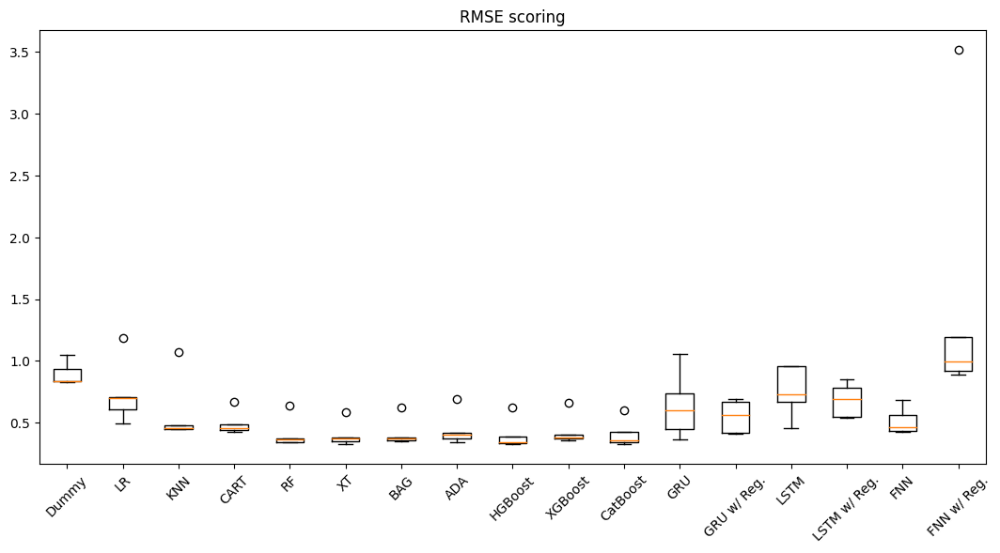

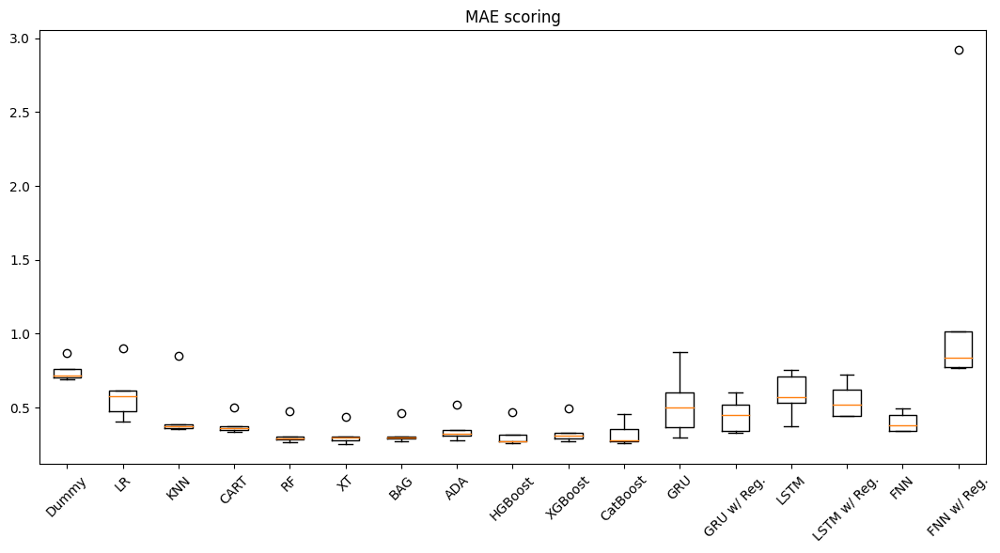

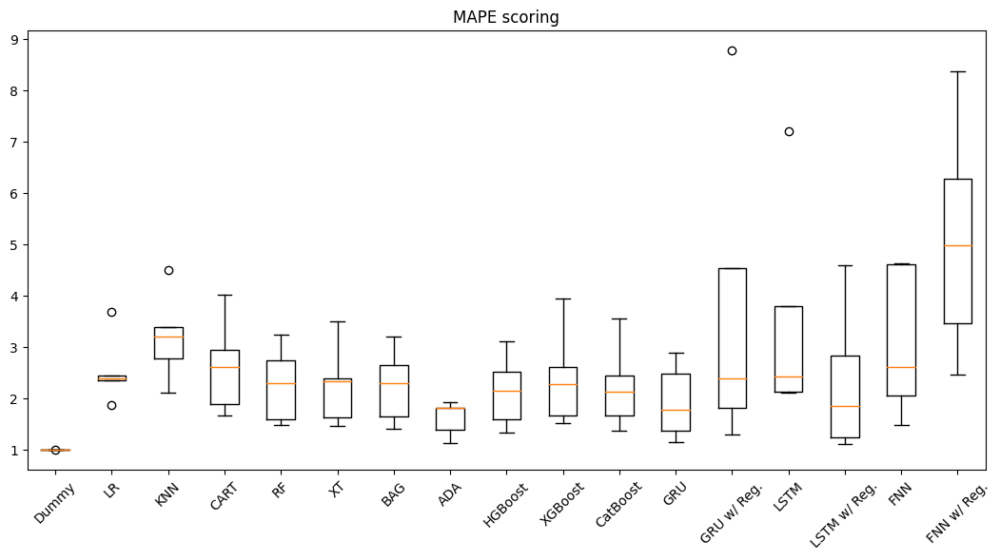

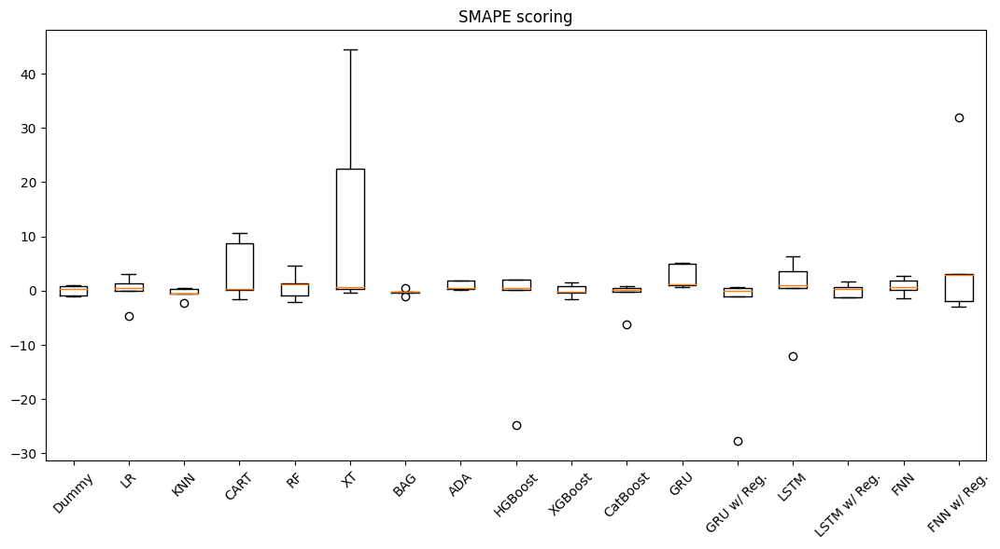

In [20]:
for result_key, result_value in results.items():
    plt.figure(figsize = (13, 6))
    plt.title(f'{result_key.upper()} scoring')
    plt.boxplot(result_value, labels = names)
    plt.xticks(rotation = 45)
    plt.show()

# Running all models on a test dataset

----------------
Dummy model...


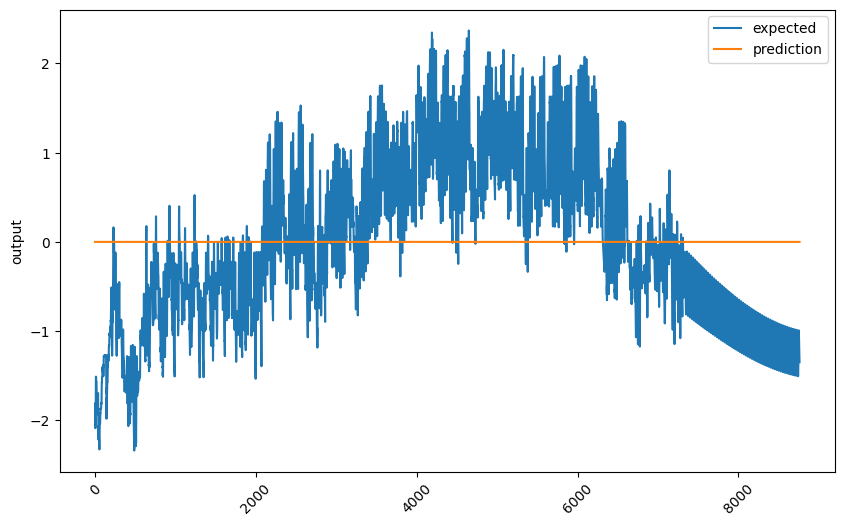

Done!

----------------
LR model...


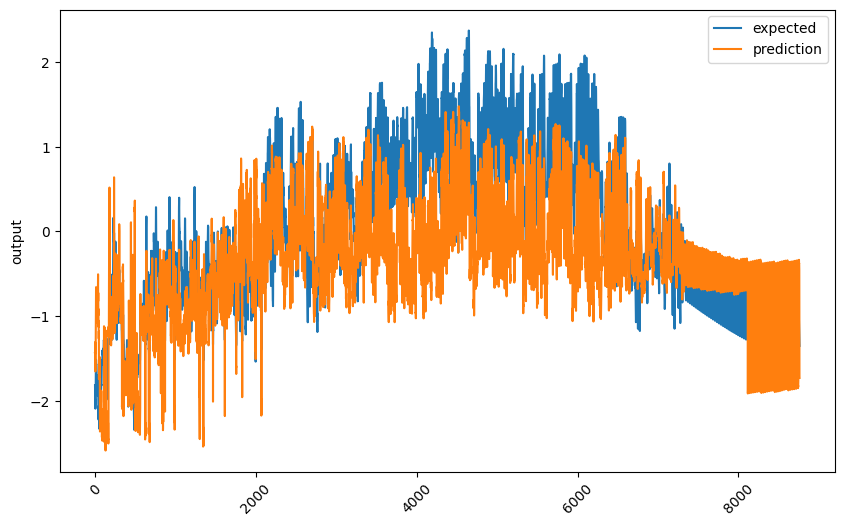

Done!

----------------
KNN model...


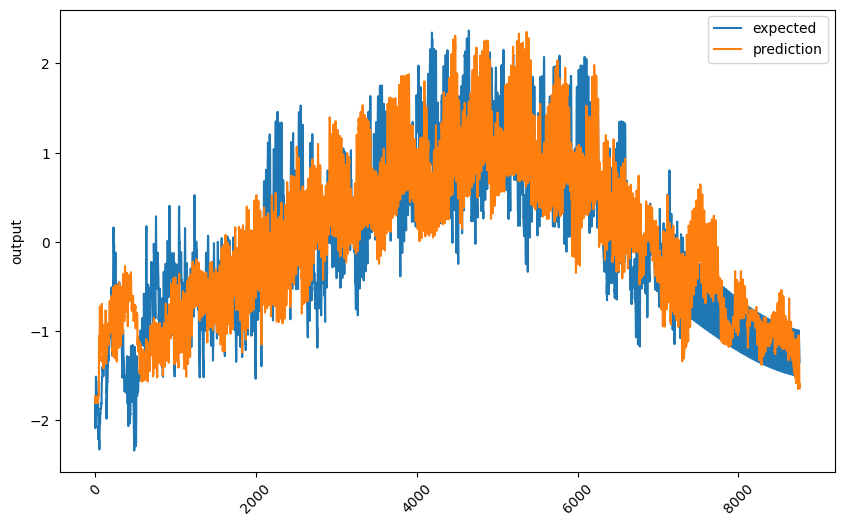

Done!

----------------
CART model...


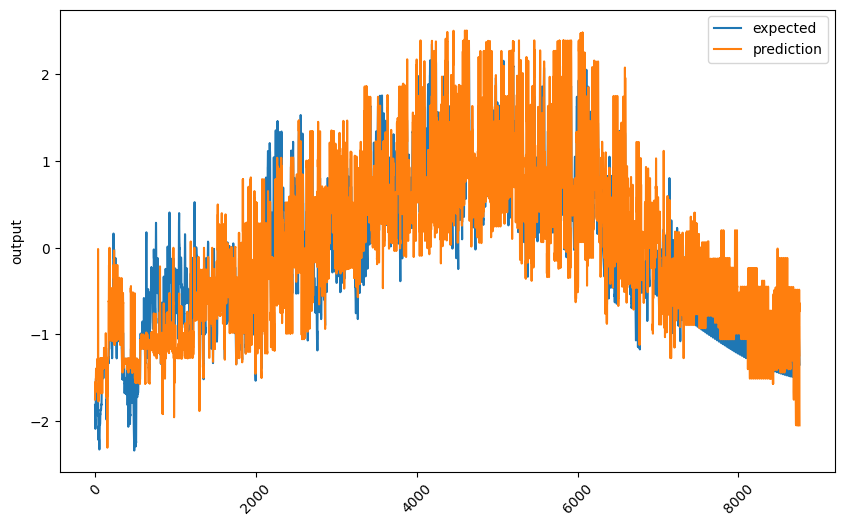

Done!

----------------
RF model...


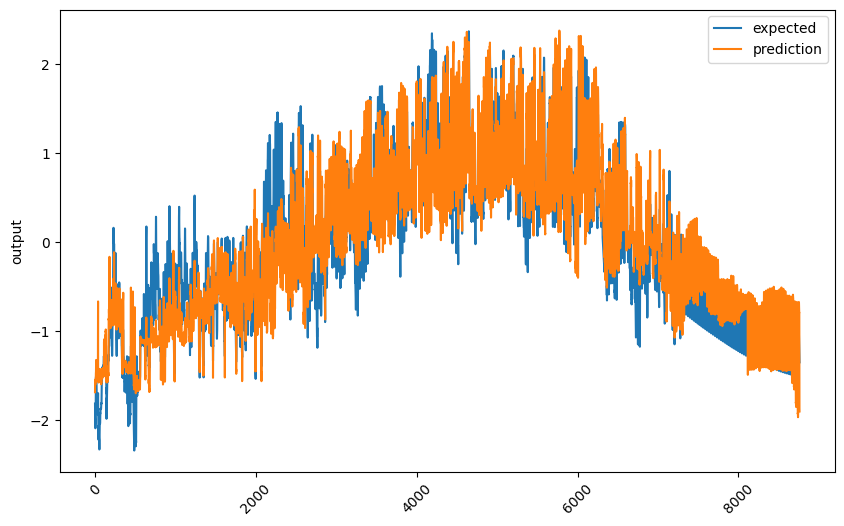

Done!

----------------
XT model...


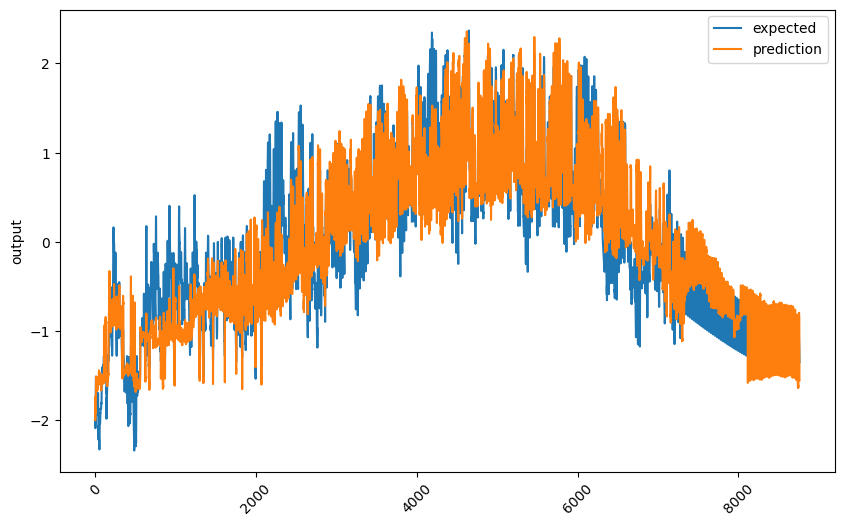

Done!

----------------
BAG model...


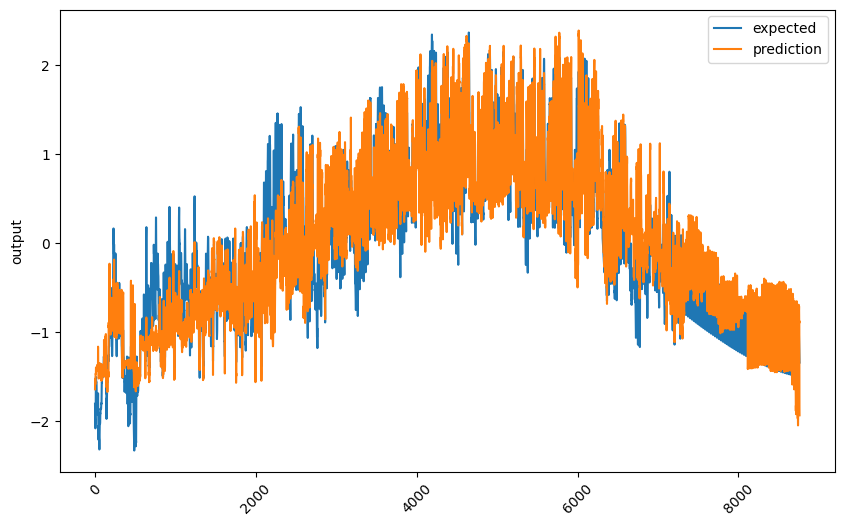

Done!

----------------
ADA model...


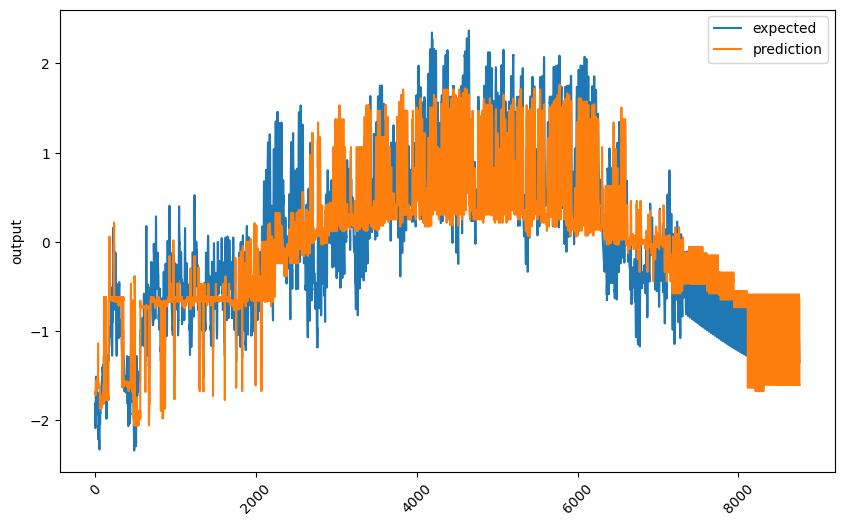

Done!

----------------
HGBoost model...


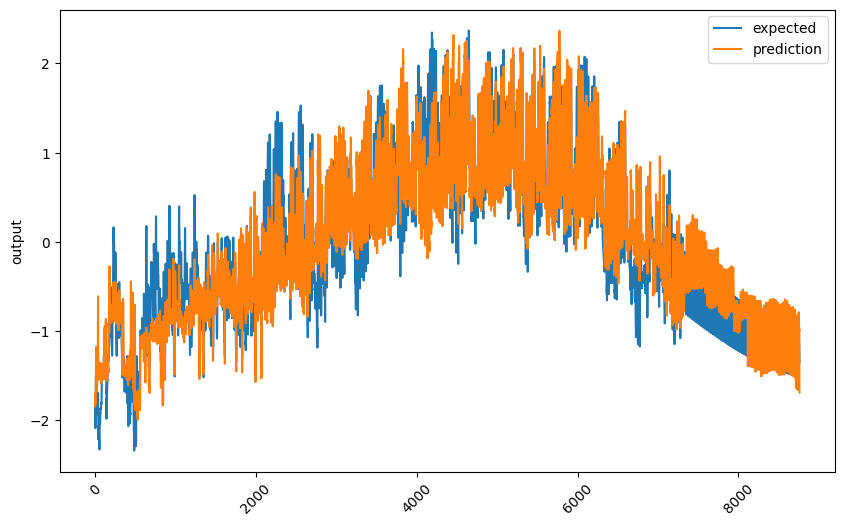

Done!

----------------
XGBoost model...


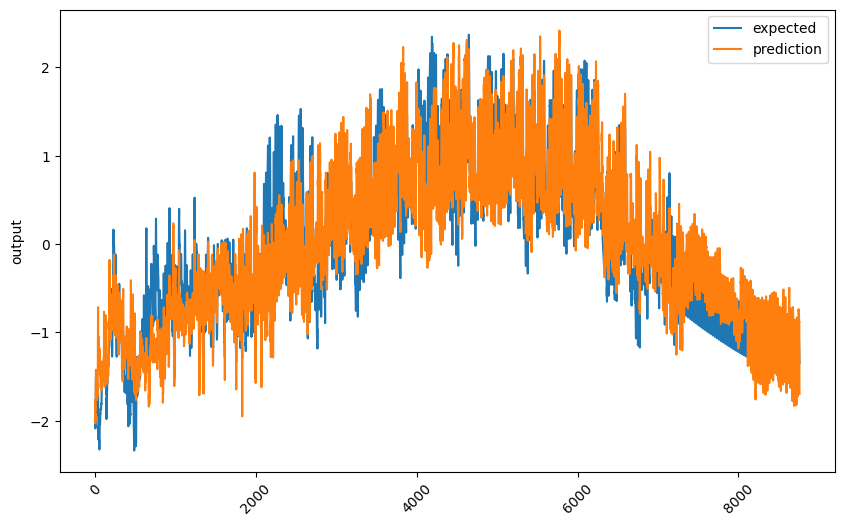

Done!

----------------
CatBoost model...


Default metric period is 5 because MAE is/are not implemented for GPU


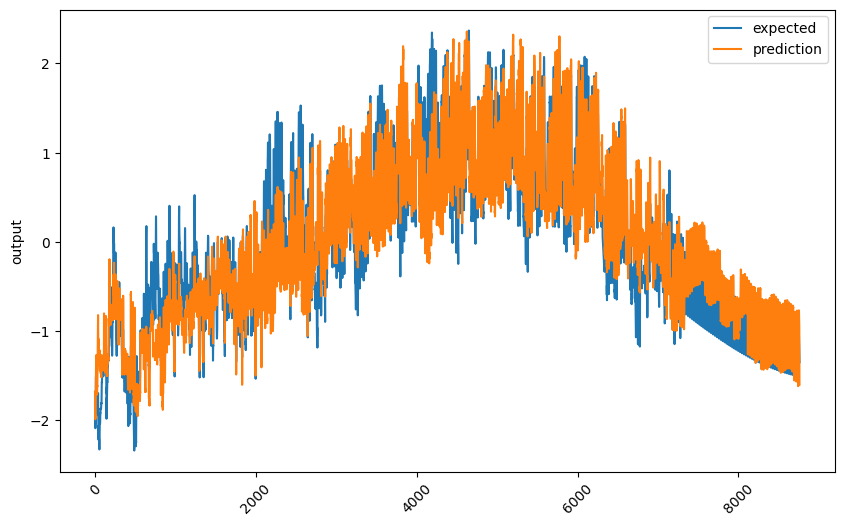

Done!

----------------
GRU model...


<Figure size 700x600 with 0 Axes>

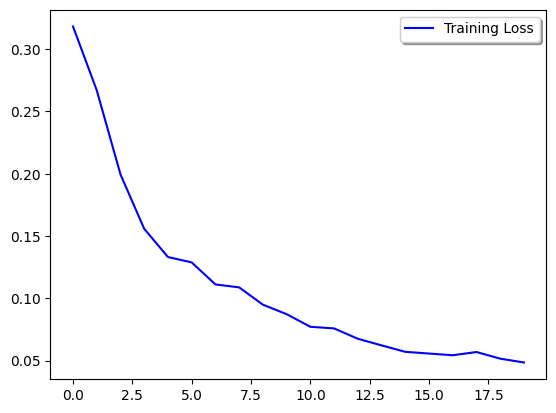

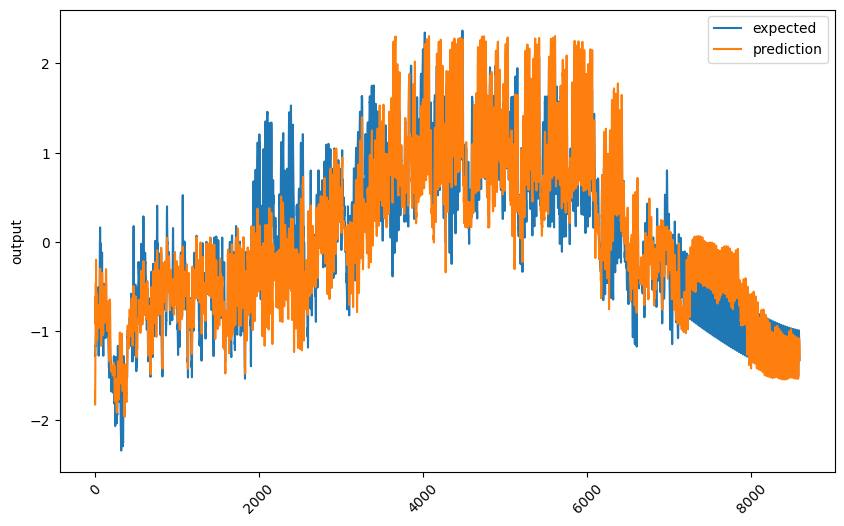

Done!

----------------
GRU w/ Reg. model...


<Figure size 700x600 with 0 Axes>

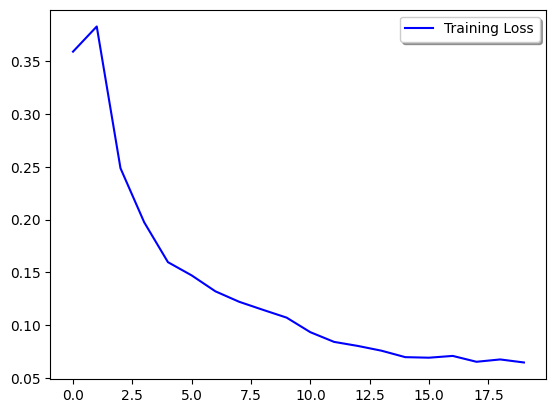

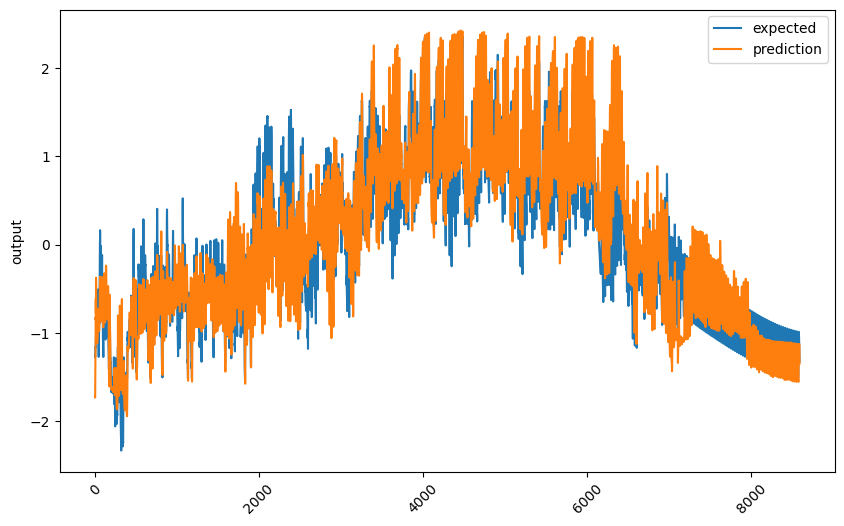

Done!

----------------
LSTM model...


<Figure size 700x600 with 0 Axes>

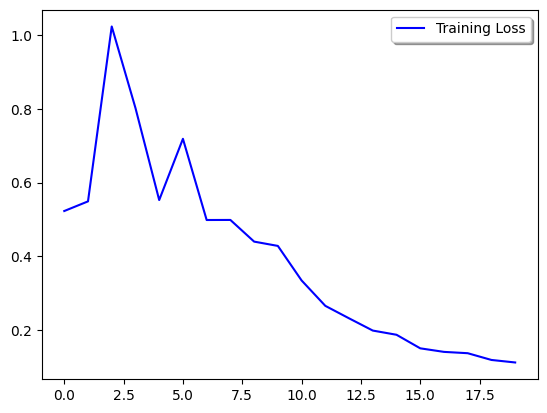

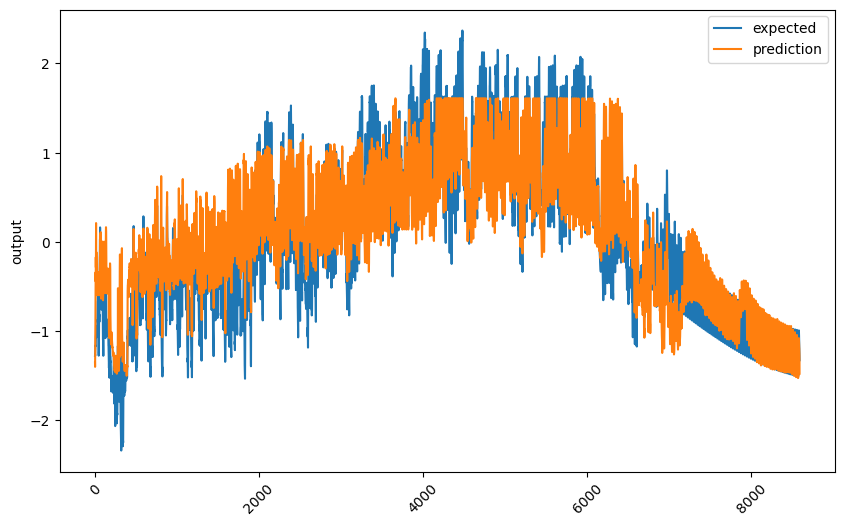

Done!

----------------
LSTM w/ Reg. model...


<Figure size 700x600 with 0 Axes>

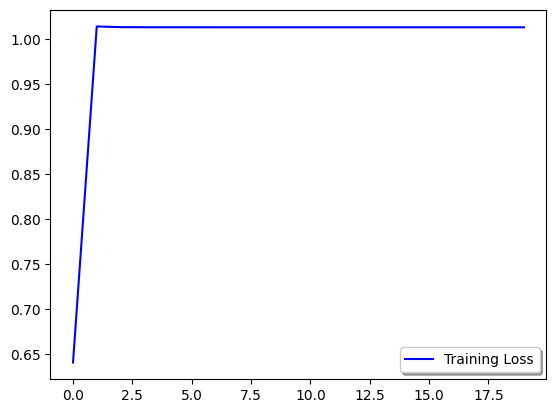

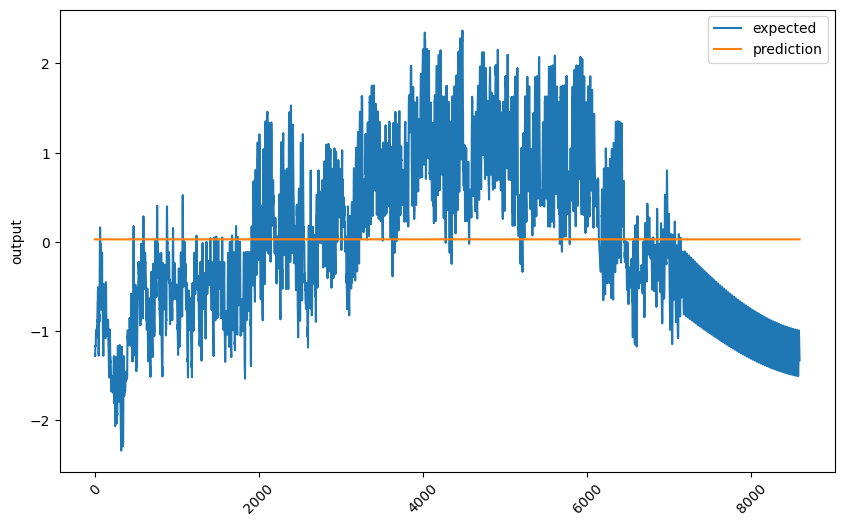

Done!

----------------
FNN model...


<Figure size 700x600 with 0 Axes>

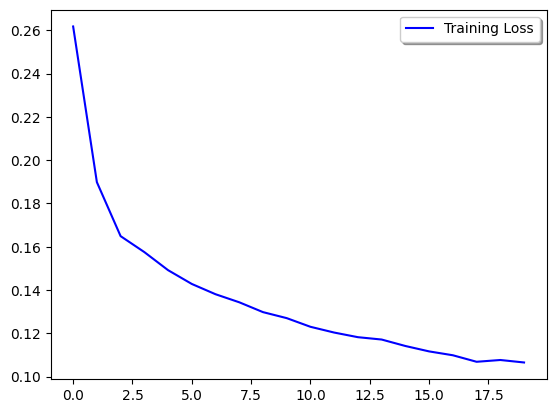

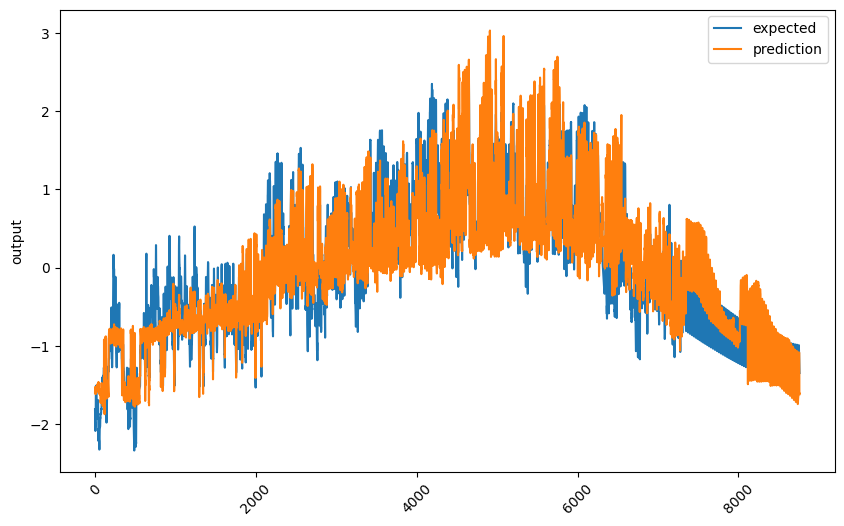

Done!

----------------
FNN w/ Reg. model...


<Figure size 700x600 with 0 Axes>

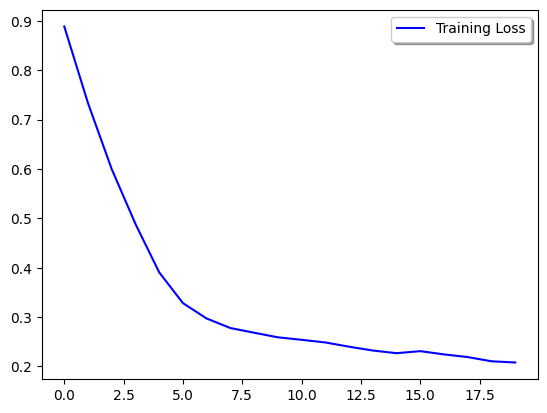

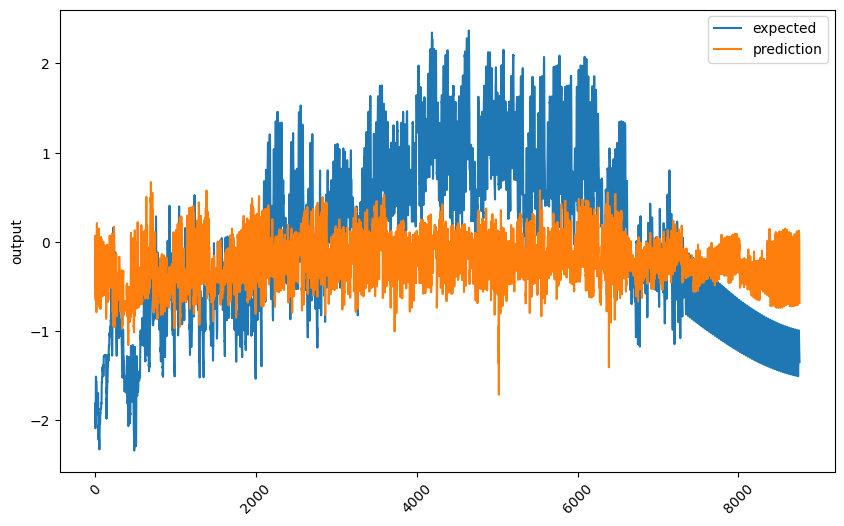

Done!



In [21]:
models = []
models.append(('Dummy', DummyRegressor()))
models.append(('LR', LinearRegression(fit_intercept = False)))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 20, n_jobs = -1)))
models.append(('CART', DecisionTreeRegressor(random_state = 42)))
models.append(('RF', RandomForestRegressor(n_jobs = -1, random_state = 42)))
models.append(('XT', ExtraTreesRegressor(n_jobs = -1, random_state = 42)))
models.append(('BAG', BaggingRegressor(n_jobs = -1, random_state = 42)))
models.append(('ADA', AdaBoostRegressor(random_state = 42)))
models.append(('HGBoost', HistGradientBoostingRegressor(random_state = 42)))
models.append(('XGBoost', XGBRegressor(tree_method = 'gpu_hist', verbosity = 0, random_state = 42)))
models.append(('CatBoost', CatBoostRegressor(
    random_seed = 42,
    loss_function = 'RMSE',
    eval_metric = 'MAE',
    od_type = 'Iter',
    od_wait = 20,
    task_type = 'GPU',
    logging_level = 'Silent')))

results = {
    'r2' : [],
    'mse' : [],
    'rmse' : [],
    'mae' : [],
    'mape' : [],
    'smape' : []
}
names = []

for name, model in models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : []
    }
    columns_to_scale = [
        'Temperature (C)',
        'Humidity',
        'Wind Speed (km/h)',
        'Wind Bearing (degrees)',
        'Visibility (km)',
        'Pressure (millibars)'
    ]
    target_column = 'Temperature (C)'
    train_scaled, test_scaled, _ = scale_train_and_test(df_train, df_test, columns_to_scale)
    x_train, y_train = train_scaled.drop(columns = target_column), train_scaled[target_column]
    x_test, y_test = test_scaled.drop(columns = target_column), test_scaled[target_column]
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    model_results['r2'].append(r2(y_test, y_pred))
    model_results['mse'].append(mse(y_test, y_pred))
    model_results['rmse'].append(rmse(y_test, y_pred))
    model_results['mae'].append(mae(y_test, y_pred))
    model_results['mape'].append(mape(y_test, y_pred))
    model_results['smape'].append(smape(y_test, y_pred))
    show_regression_chart(y_test, y_pred, sort = False)
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

dl_models = []
dl_models.append(('GRU', get_gru_model_regression))
dl_models.append(('GRU w/ Reg.', get_gru_model_regression_with_regularization))
dl_models.append(('LSTM', get_lstm_model_regression))
dl_models.append(('LSTM w/ Reg.', get_lstm_model_regression_with_regularization))
dl_models.append(('FNN', get_fnn_model_regression))
dl_models.append(('FNN w/ Reg.', get_fnn_model_regression_with_regularization))

batch_size = 32
epochs = 20
look_back = 24 * 7 # use a week of measurements to look back
num_of_variables = df_train.shape[-1] - 1
input_shape_feedforward = (num_of_variables,)
input_shape_recurrent = (look_back, num_of_variables,)

for name, model_function in dl_models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape': []
    }
    columns_to_scale = list(df_train.columns)
    columns_to_scale.remove('Precip Type_rain')
    columns_to_scale.remove('Precip Type_snow')
    target_column = 'Temperature (C)'
    train_scaled, test_scaled, _ = scale_train_and_test(df_train, df_test, columns_to_scale)
    is_fnn = name.find('FNN') != -1
    (x_train, y_train) = \
        (train_scaled.drop(columns = target_column), train_scaled[target_column]) \
        if is_fnn else \
        create_dataset(train_scaled, target_column, look_back = look_back)
    (x_test, y_test) = \
        (test_scaled.drop(columns = target_column), test_scaled[target_column]) \
        if is_fnn else \
        create_dataset(test_scaled, target_column, look_back = look_back)
    model = model_function(input_shape_feedforward \
        if is_fnn else input_shape_recurrent)
    train_history = model.fit(
        x = x_train,
        y = y_train,
        batch_size = batch_size,
        epochs = epochs,
        shuffle = False,
        verbose = 0).history
    y_pred = model.predict(x_test, verbose = 0)
    model_results['r2'].append(r2(y_test, y_pred))
    model_results['mse'].append(mse(y_test, y_pred))
    model_results['rmse'].append(rmse(y_test, y_pred))
    model_results['mae'].append(mae(y_test, y_pred))
    model_results['mape'].append(mape(y_test, y_pred.flatten()))
    model_results['smape'].append(smape(y_test, y_pred.flatten()))
    show_training_history(train_history, ['loss'], ['Loss'])
    show_regression_chart(y_test, y_pred.flatten(), sort = False)
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

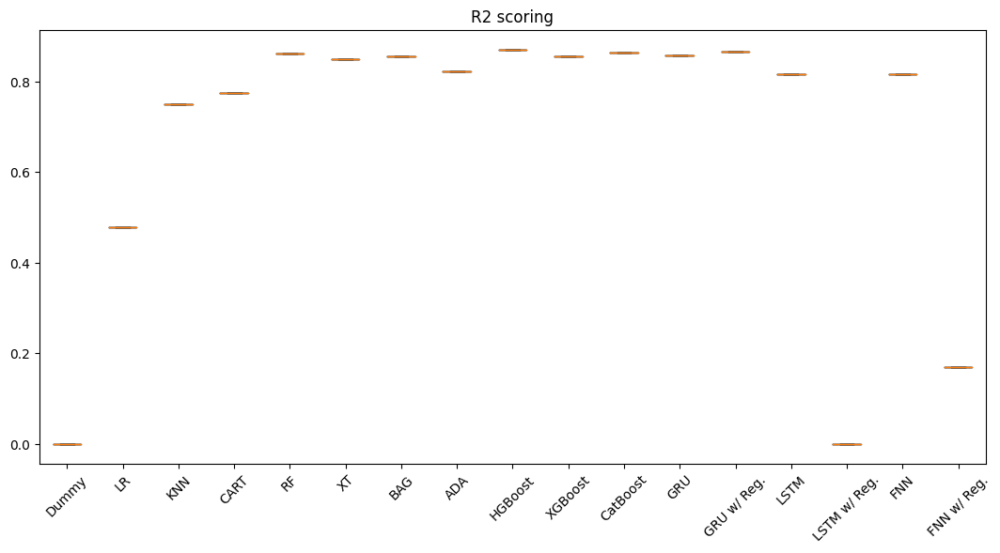

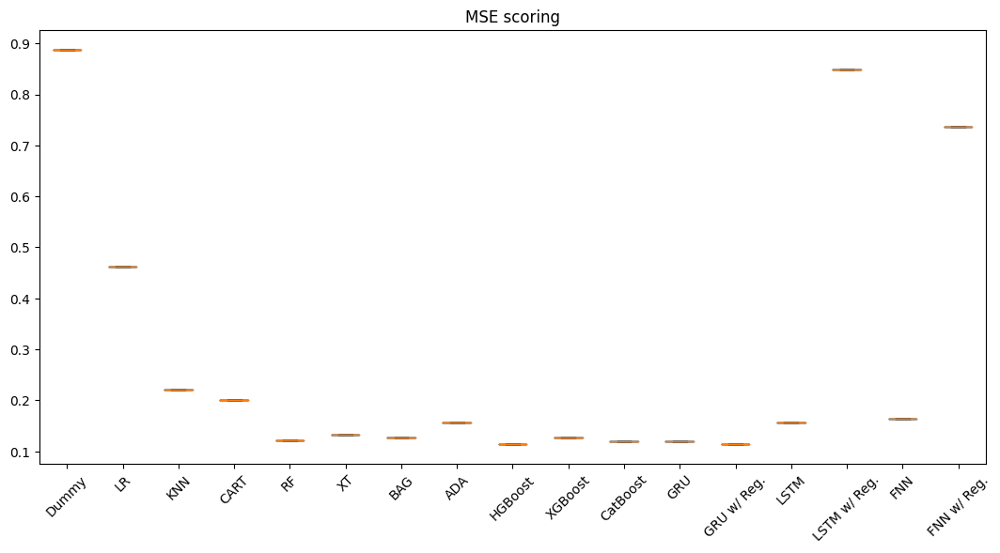

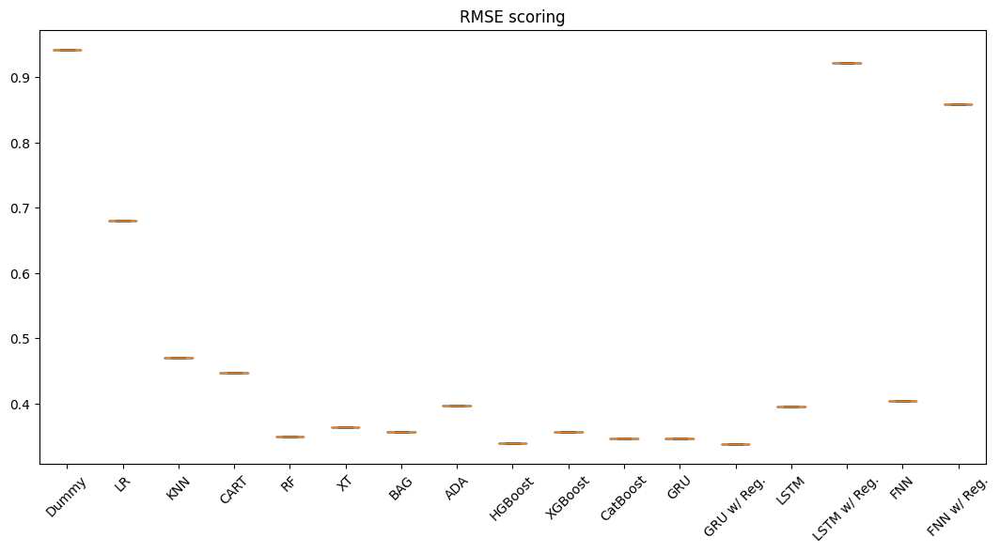

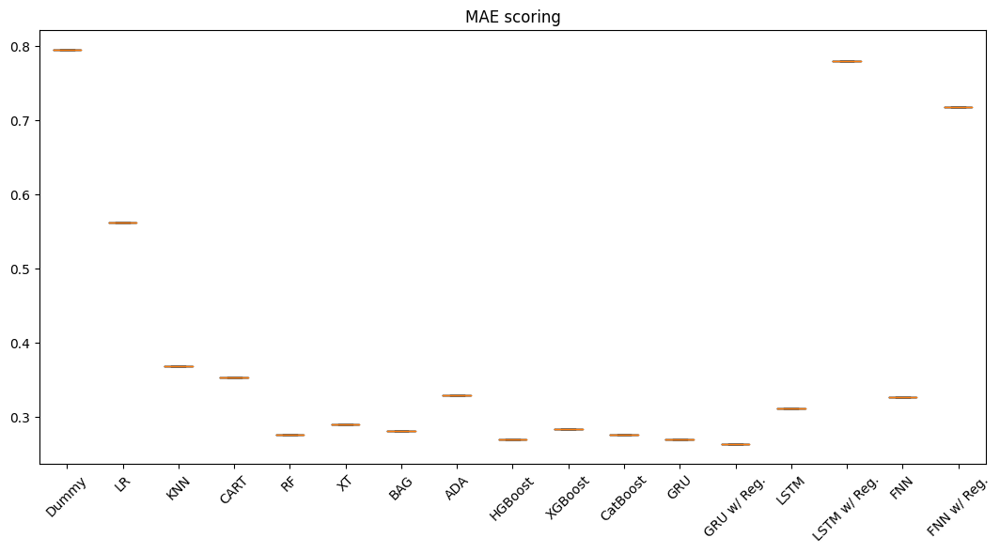

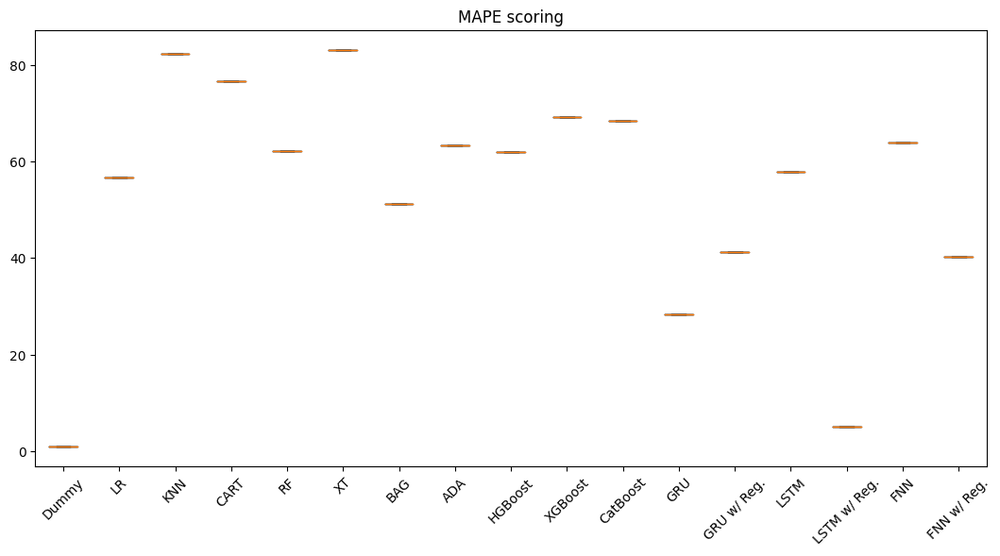

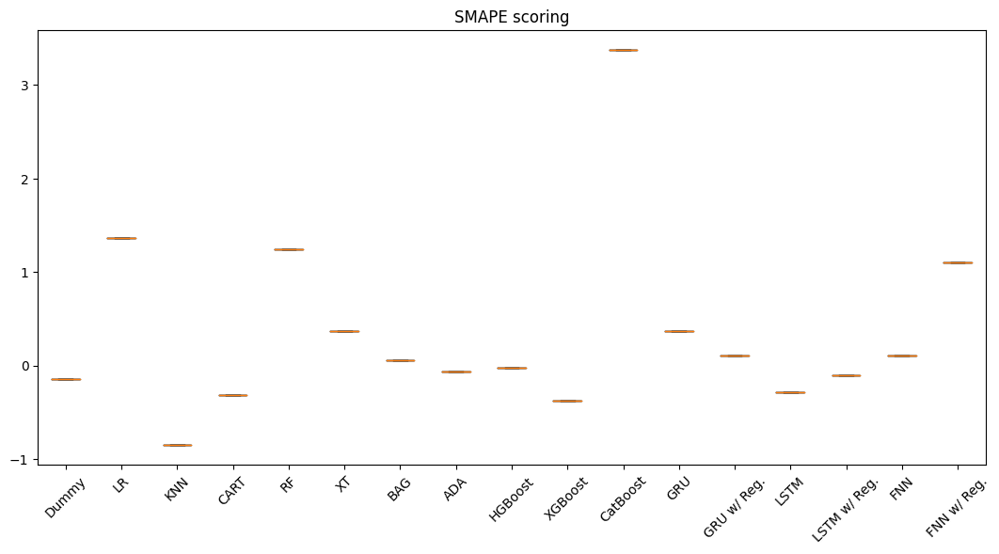

In [22]:
for result_key, result_value in results.items():
    plt.figure(figsize = (13, 6))
    #plt.ylim(18000, 80000)
    plt.title(f'{result_key.upper()} scoring')
    plt.boxplot(result_value, labels = names)
    plt.xticks(rotation = 45)
    plt.show()